# Cellula Task - Notebook 2

## Overview
This notebook demonstrates data processing, analysis and visualization techniques using Python.

**Author:** Omar Mamon Hamed  
**Date:** 26/2/2025  
**Version:** 2.0

### Contents
- Data Loading and Preprocessing  
- Exploratory Data Analysis
- Statistical Analysis
- Data Visualization
- Scaling and Normalization
- Model Development and Evaluation
- Model Selection and Hyperparameter Tuning 

---
*Note: Make sure all required libraries are installed before running this notebook in your machine*

In [6]:
# Data manipulation libraries
import pandas as pd
import numpy as np

# Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
from matplotlib.gridspec import GridSpec
from mpl_toolkits.mplot3d import Axes3D

# Geospatial libraries
import folium
from folium.plugins import HeatMap
from geopy.distance import geodesic
from math import radians, sin, cos, sqrt, atan2

# Statistical and machine learning libraries
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OrdinalEncoder
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
from sklearn.preprocessing import RobustScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.feature_selection import mutual_info_regression, SelectKBest


## Load data

In [7]:
# Load the data
df = pd.read_csv('final_internship_data.csv')

## Understand the Data Structure

In [8]:
df.head()

,User ID,User Name,Driver Name,Car Condition,Weather,Traffic Condition,key,fare_amount,pickup_datetime,pickup_longitude,...,month,weekday,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing
0,KHVrEVlD,Kimberly Adams,Amy Butler,Very Good,windy,Congested Traffic,2009-06-15 17:26:21.0000001,4.5,2009-06-15 17:26:21,-1.288826,...,6,0,2009,20.265840,55.176046,14.342611,34.543548,27.572573,1.030764,-2.918897
1,lPxIuEri,Justin Tapia,Hannah Zimmerman,Excellent,cloudy,Flow Traffic,2010-01-05 16:52:16.0000002,16.9,2010-01-05 16:52:16,-1.291824,...,1,1,2010,44.667679,31.832358,23.130775,15.125872,8.755732,8.450134,-0.375217
2,gsVN8JLS,Elizabeth Lopez,Amanda Jackson,Bad,stormy,Congested Traffic,2011-08-18 00:35:00.00000049,5.7,2011-08-18 00:35:00,-1.291242,...,8,3,2011,43.597686,33.712082,19.865289,17.722624,9.847344,1.389525,2.599961
3,9I7kWFgd,Steven Wilson,Amy Horn,Very Good,stormy,Flow Traffic,2012-04-21 04:30:42.0000001,7.7,2012-04-21 04:30:42,-1.291319,...,4,5,2012,42.642965,32.556289,21.063132,15.738963,7.703421,2.799270,0.133905
4,8QN5ZaGN,Alexander Andrews,Cassandra Larson,Bad,stormy,Congested Traffic,2010-03-09 07:51:00.000000135,5.3,2010-03-09 07:51:00,-1.290987,...,3,1,2010,43.329953,39.406828,15.219339,23.732406,15.600745,1.999157,-0.502703


In [9]:
df.rename(columns={
    "User ID": "user_id",
    "User Name": "user_name",
    "Driver Name": "driver_name",
    "Car Condition": "car_condition",
    "Weather": "weather",
    "Traffic Condition": "traffic",
    "key": "ride_id",
    "fare_amount": "fare",
    "pickup_datetime": "pickup_time",
    "pickup_longitude": "pickup_lon",
    "pickup_latitude": "pickup_lat",
    "dropoff_longitude": "dropoff_lon",
    "dropoff_latitude": "dropoff_lat",
    "passenger_count": "passengers",
    "hour": "request_hour",
    "day": "request_day",
    "month": "request_month",
    "weekday": "request_weekday",
    "year": "request_year",
    "jfk_dist": "distance_jfk",
    "ewr_dist": "distance_ewr",
    "lga_dist": "distance_lga",
    "sol_dist": "distance_sol",
    "nyc_dist": "distance_nyc",
    "distance": "ride_distance",
    "bearing": "ride_bearing"
}, inplace=True)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 26 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   user_id          500000 non-null  object 
 1   user_name        500000 non-null  object 
 2   driver_name      500000 non-null  object 
 3   car_condition    500000 non-null  object 
 4   weather          500000 non-null  object 
 5   traffic          500000 non-null  object 
 6   ride_id          500000 non-null  object 
 7   fare             500000 non-null  float64
 8   pickup_time      500000 non-null  object 
 9   pickup_lon       500000 non-null  float64
 10  pickup_lat       500000 non-null  float64
 11  dropoff_lon      499995 non-null  float64
 12  dropoff_lat      499995 non-null  float64
 13  passengers       500000 non-null  int64  
 14  request_hour     500000 non-null  int64  
 15  request_day      500000 non-null  int64  
 16  request_month    500000 non-null  int6

In [11]:
df.describe() 

,fare,pickup_lon,pickup_lat,dropoff_lon,dropoff_lat,passengers,request_hour,request_day,request_month,request_weekday,request_year,distance_jfk,distance_ewr,distance_lga,distance_sol,distance_nyc,ride_distance,ride_bearing
count,500000.000000,500000.000000,500000.000000,499995.000000,499995.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,499995.000000,499995.000000,499995.000000,499995.000000,499995.000000,499995.000000,499995.000000
mean,11.358361,-1.265712,0.696740,-1.265755,0.696675,1.683428,13.510834,15.684206,6.268650,3.042008,2011.739132,385.279367,380.503657,363.843772,363.674038,355.991423,19.468775,0.297145
std,9.916617,0.206941,0.140909,0.205903,0.128997,1.307395,6.511571,8.681066,3.437815,1.949240,1.860889,2419.087483,2428.804740,2425.075903,2428.348683,2428.730839,367.299601,1.804548
min,-44.900000,-52.119764,-54.389440,-59.049665,-44.676047,0.000000,0.000000,1.000000,1.000000,0.000000,2009.000000,1.017646,1.460945,0.382119,0.532545,0.080500,0.000000,-3.141593
25%,6.000000,-1.291405,0.710958,-1.291393,0.710943,1.000000,9.000000,8.000000,3.000000,1.000000,2010.000000,41.341514,32.173712,17.100762,14.886989,7.147384,1.214550,-0.854721
50%,8.500000,-1.291226,0.711268,-1.291197,0.711277,1.000000,14.000000,16.000000,6.000000,3.000000,2012.000000,42.523163,34.787507,19.591554,18.347580,10.458151,2.116970,-0.050442
75%,12.500000,-1.290970,0.711520,-1.290908,0.711538,2.000000,19.000000,23.000000,9.000000,5.000000,2013.000000,43.785649,38.304502,22.214815,22.417812,14.448699,3.890070,2.206769
max,500.000000,37.360538,29.724576,0.712985,7.061893,6.000000,23.000000,31.000000,12.000000,6.000000,2015.000000,30133.067880,30167.595967,30167.285794,30159.407296,30162.285356,12399.956433,3.141593


In [12]:
df.nunique()

user_id            500000
user_name          221675
driver_name        221700
car_condition           4
weather                 5
traffic                 3
ride_id            500000
fare                 1688
pickup_time        461206
pickup_lon          95037
pickup_lat         119115
dropoff_lon        108283
dropoff_lat        135053
passengers              7
request_hour           24
request_day            31
request_month          12
request_weekday         7
request_year            7
distance_jfk       490613
distance_ewr       490613
distance_lga       490613
distance_sol       490613
distance_nyc       490613
ride_distance      485705
ride_bearing       485636
dtype: int64

## Data Quality Assessment

Initial data inspection reveals:

1. Dataset Size:
    - 500,000 records
    - 26 columns

2. Missing Values:
    - 5 null values identified in multiple columns:
      * dropoff_lon
      * dropoff_lat
      * distance_jfk
      * distance_ewr  
      * distance_lga
      * distance_sol
      * distance_nyc
      * ride_distance
      * ride_bearing

3. Data Types:
    - Float64: 12 columns (coordinates, distances, fare)
    - Int64: 6 columns (passengers, time features)
    - Object: 8 columns (IDs, names, conditions)

4. Impact Assessment:
    - Missing data represents only 0.001% of total records
    - Safe to proceed with row deletion given minimal data loss

## Handle Missing Values

In [13]:
df.isnull().sum()  # Count missing values per column  

user_id            0
user_name          0
driver_name        0
car_condition      0
weather            0
traffic            0
ride_id            0
fare               0
pickup_time        0
pickup_lon         0
pickup_lat         0
dropoff_lon        5
dropoff_lat        5
passengers         0
request_hour       0
request_day        0
request_month      0
request_weekday    0
request_year       0
distance_jfk       5
distance_ewr       5
distance_lga       5
distance_sol       5
distance_nyc       5
ride_distance      5
ride_bearing       5
dtype: int64

In [14]:
# First, let's identify which rows have missing values in each column
missing_lon = df[df['dropoff_lon'].isna()].index
missing_lat = df[df['dropoff_lat'].isna()].index
missing_distances = df[df['ride_distance'].isna()].index
missing_bearing = df[df['ride_bearing'].isna()].index

print(f"Missing dropoff_lon: {len(missing_lon)} rows")
print(f"Missing dropoff_lat: {len(missing_lat)} rows")
print(f"Missing ride_distance: {len(missing_distances)} rows")
print(f"Missing ride_bearing: {len(missing_bearing)} rows")

# Check overlap between missing values
print(f"Rows missing both coordinates: {len(set(missing_lon).intersection(missing_lat))}")

Missing dropoff_lon: 5 rows
Missing dropoff_lat: 5 rows
Missing ride_distance: 5 rows
Missing ride_bearing: 5 rows
Rows missing both coordinates: 5


In [15]:
# Identify the rows where dropoff coordinates are missing
missing_coordinate_rows = df[df['dropoff_lon'].isna()].index
print(f"Found {len(missing_coordinate_rows)} rows with missing coordinates out of {len(df)} total rows")
print(f"Rows to process: {missing_coordinate_rows.tolist()}")

Found 5 rows with missing coordinates out of 500000 total rows
Rows to process: [120227, 245696, 340533, 428108, 471472]


In [16]:
# Define a function to calculate distance between two geographic points
def calculate_geographic_distance(lat1, lon1, lat2, lon2):
    """
    Calculate the distance between two geographic points using the Haversine formula.
    
    Parameters:
        lat1, lon1: Latitude and longitude of the first point in decimal degrees
        lat2, lon2: Latitude and longitude of the second point in decimal degrees
        
    Returns:
        Distance in kilometers between the two points
    """
    
    # Earth's radius in kilometers
    earth_radius_miles = 6371
    
    # Convert decimal degrees to radians
    lat1_rad, lon1_rad, lat2_rad, lon2_rad = map(radians, [lat1, lon1, lat2, lon2])
    
    # Calculate differences in coordinates
    delta_lat = lat2_rad - lat1_rad
    delta_lon = lon2_rad - lon1_rad
    
    # Apply Haversine formula
    a = sin(delta_lat/2)**2 + cos(lat1_rad) * cos(lat2_rad) * sin(delta_lon/2)**2
    c = 2 * atan2(sqrt(a), sqrt(1-a))
    
    # Calculate distance
    distance_miles = earth_radius_miles * c
    
    return distance_miles

In [17]:
# Define locations of key points for distance calculations
airport_locations = {
    'jfk': {'name': 'JFK Airport', 'coordinates': (40.6413, -73.7781)},
    'ewr': {'name': 'Newark Airport', 'coordinates': (40.6895, -74.1745)},
    'lga': {'name': 'LaGuardia Airport', 'coordinates': (40.7769, -73.8740)},
    'sol': {'name': 'Statue of Liberty', 'coordinates': (40.7527, -73.9772)},
    'nyc': {'name': 'NYC Center', 'coordinates': (40.7128, -74.0060)}
}

In [18]:
# Drop null values from the dataset
df.dropna(subset=['dropoff_lon', 'dropoff_lat'], inplace=True)

In [19]:
df.isnull().sum()

user_id            0
user_name          0
driver_name        0
car_condition      0
weather            0
traffic            0
ride_id            0
fare               0
pickup_time        0
pickup_lon         0
pickup_lat         0
dropoff_lon        0
dropoff_lat        0
passengers         0
request_hour       0
request_day        0
request_month      0
request_weekday    0
request_year       0
distance_jfk       0
distance_ewr       0
distance_lga       0
distance_sol       0
distance_nyc       0
ride_distance      0
ride_bearing       0
dtype: int64

## Data Distributions

#### Univariate Analysis

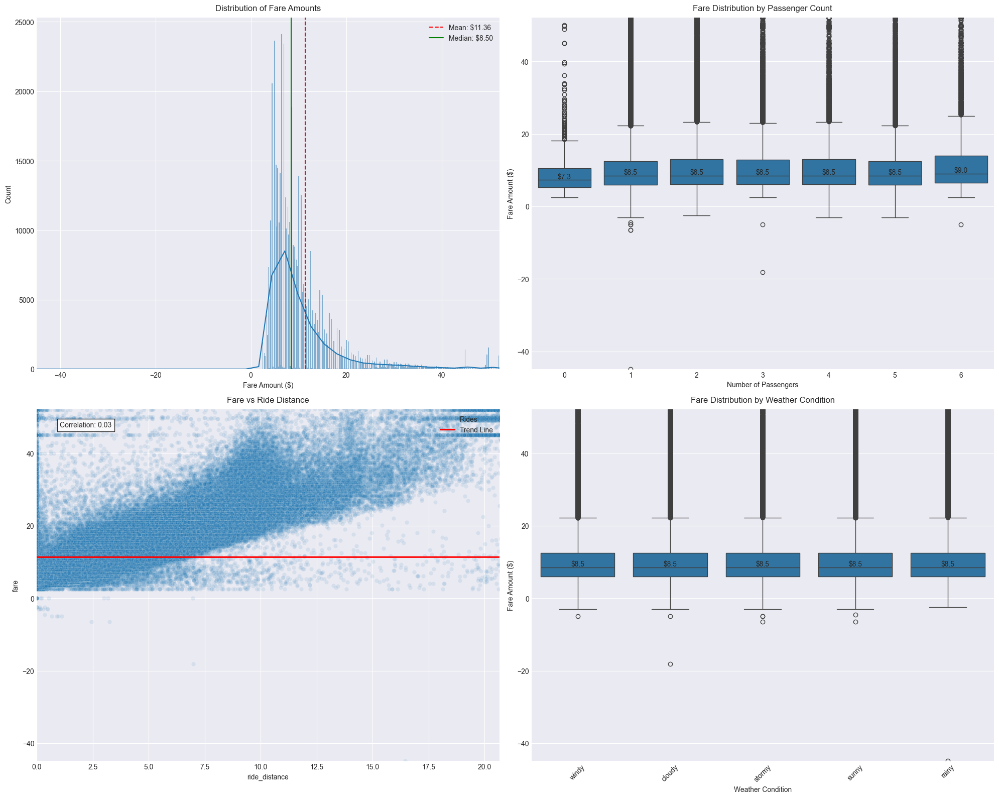

In [20]:
# Create a figure with 2x2 subplots with better spacing
plt.style.use('seaborn-v0_8-darkgrid')
fig, axes = plt.subplots(2, 2, figsize=(20, 16))

# 1. Fare Distribution (Top Left)
sns.histplot(data=df, x='fare', kde=True, ax=axes[0,0])
axes[0,0].set_title('Distribution of Fare Amounts', fontsize=12, pad=10)
axes[0,0].set_xlabel('Fare Amount ($)', fontsize=10)
axes[0,0].set_ylabel('Count', fontsize=10)

# Add mean and median lines with annotations
mean_fare = df['fare'].mean()
median_fare = df['fare'].median()
axes[0,0].axvline(mean_fare, color='red', linestyle='--', 
                  label=f'Mean: ${mean_fare:.2f}')
axes[0,0].axvline(median_fare, color='green', linestyle='-', 
                  label=f'Median: ${median_fare:.2f}')
axes[0,0].legend()

# Set x-axis limits to show 99% of the data
fare_99th = np.percentile(df['fare'], 99)
axes[0,0].set_xlim(df['fare'].min(), fare_99th)

# 2. Fare by Passenger Count (Top Right)
sns.boxplot(data=df, x='passengers', y='fare', ax=axes[0,1])
axes[0,1].set_title('Fare Distribution by Passenger Count', fontsize=12, pad=10)
axes[0,1].set_xlabel('Number of Passengers', fontsize=10)
axes[0,1].set_ylabel('Fare Amount ($)', fontsize=10)

# Set y-axis limits to show 99% of the data
axes[0,1].set_ylim(df['fare'].min(), fare_99th)

# Add median values on top of boxes
medians = df.groupby('passengers')['fare'].median()
for i, median in enumerate(medians):
    axes[0,1].text(i, median, f'${median:.1f}', 
                   horizontalalignment='center', verticalalignment='bottom')

# 3. Fare vs Distance (Bottom Left)
scatter = sns.scatterplot(data=df, x='ride_distance', y='fare', alpha=0.1, ax=axes[1,0])
axes[1,0].set_title('Fare vs Ride Distance', fontsize=12, pad=10)
axes[1,0].set_xlabel('Ride Distance (miles)', fontsize=10)
axes[1,0].set_ylabel('Fare Amount ($)', fontsize=10)

# Set axis limits to show 99% of the data
distance_99th = np.percentile(df['ride_distance'], 99)
axes[1,0].set_xlim(0, distance_99th)
axes[1,0].set_ylim(df['fare'].min(), fare_99th)

# Add trend line with confidence interval
sns.regplot(data=df, x='ride_distance', y='fare', 
            scatter=False, color='red', ax=axes[1,0],
            line_kws={'label': 'Trend Line'})

# Calculate correlation coefficient
correlation = df['ride_distance'].corr(df['fare'])

# Add correlation text
axes[1,0].text(0.05, 0.95, f'Correlation: {correlation:.2f}', 
               transform=axes[1,0].transAxes, 
               fontsize=10, 
               bbox=dict(facecolor='white', alpha=0.8))

# Add legend
axes[1,0].legend(['Rides', 'Trend Line'], loc='upper right')

# 4. Fare Distribution by Weather (Bottom Right)
sns.boxplot(data=df, x='weather', y='fare', ax=axes[1,1])
axes[1,1].set_title('Fare Distribution by Weather Condition', fontsize=12, pad=10)
axes[1,1].set_xlabel('Weather Condition', fontsize=10)
axes[1,1].set_ylabel('Fare Amount ($)', fontsize=10)
axes[1,1].tick_params(axis='x', rotation=45)

# Set y-axis limits to show 99% of the data
axes[1,1].set_ylim(df['fare'].min(), fare_99th)

# Add median values on top of boxes
medians = df.groupby('weather')['fare'].median()
for i, median in enumerate(medians):
    axes[1,1].text(i, median, f'${median:.1f}', 
                   horizontalalignment='center', verticalalignment='bottom')

# Adjust layout
plt.tight_layout()
plt.show()

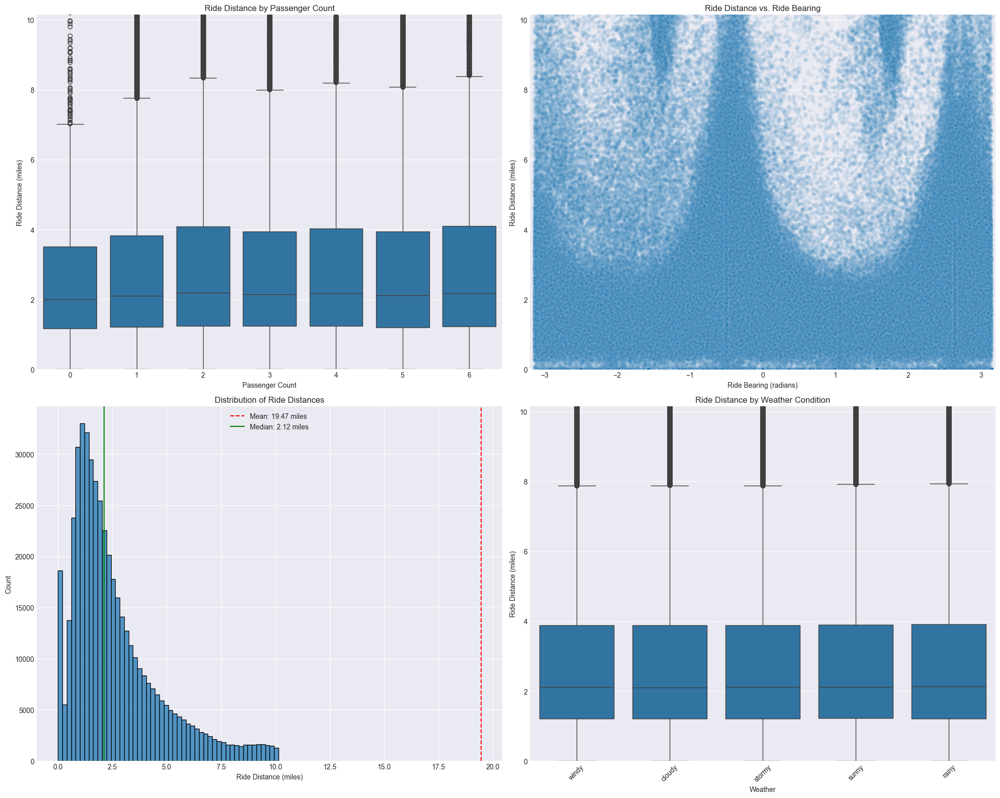

In [21]:
fig, axes = plt.subplots(2, 2, figsize=(20, 16))
plt.style.use('seaborn-v0_8-darkgrid')

# 1. Ride distance distribution with passenger count
sns.boxplot(data=df, x='passengers', y='ride_distance', ax=axes[0,0])
axes[0,0].set_title('Ride Distance by Passenger Count')
axes[0,0].set_xlabel('Passenger Count')
axes[0,0].set_ylabel('Ride Distance (miles)')
# Set y-axis limit to show 95% of the data (excluding extreme outliers)
axes[0,0].set_ylim(0, df['ride_distance'].quantile(0.95))

# 2. Ride distance distribution with ride bearing
sns.scatterplot(data=df, x='ride_bearing', y='ride_distance', 
                alpha=0.1, ax=axes[0,1])
axes[0,1].set_title('Ride Distance vs. Ride Bearing')
axes[0,1].set_xlabel('Ride Bearing (radians)')
axes[0,1].set_ylabel('Ride Distance (miles)')
axes[0,1].set_ylim(0, df['ride_distance'].quantile(0.95))
axes[0,1].set_xlim(-3.2, 3.2)  # Range of bearing in radians

# 3. Histogram of ride distances
sns.histplot(data=df[df['ride_distance'] <= df['ride_distance'].quantile(0.95)],
             x='ride_distance', bins=50, ax=axes[1,0])
axes[1,0].set_title('Distribution of Ride Distances')
axes[1,0].set_xlabel('Ride Distance (miles)')
axes[1,0].set_ylabel('Count')

# Add mean and median lines
mean_distance = df['ride_distance'].mean()
median_distance = df['ride_distance'].median()
axes[1,0].axvline(mean_distance, color='red', linestyle='--', 
                  label=f'Mean: {mean_distance:.2f} miles')
axes[1,0].axvline(median_distance, color='green', linestyle='-', 
                  label=f'Median: {median_distance:.2f} miles')
axes[1,0].legend()

# 4. Box plot of ride distances by weather
sns.boxplot(data=df, x='weather', y='ride_distance', ax=axes[1,1])
axes[1,1].set_title('Ride Distance by Weather Condition')
axes[1,1].set_xlabel('Weather')
axes[1,1].set_ylabel('Ride Distance (miles)')
axes[1,1].set_ylim(0, df['ride_distance'].quantile(0.95))
axes[1,1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


- Categorical columns

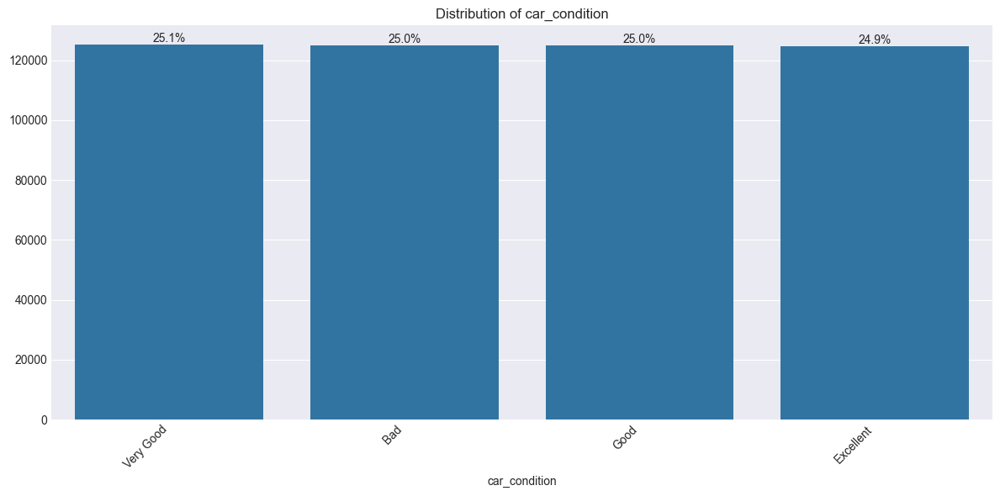


Value counts for car_condition:


,Count,Percentage
car_condition,,
Very Good,125310,25.06
Bad,124977,25.00
Good,124967,24.99
Excellent,124741,24.95


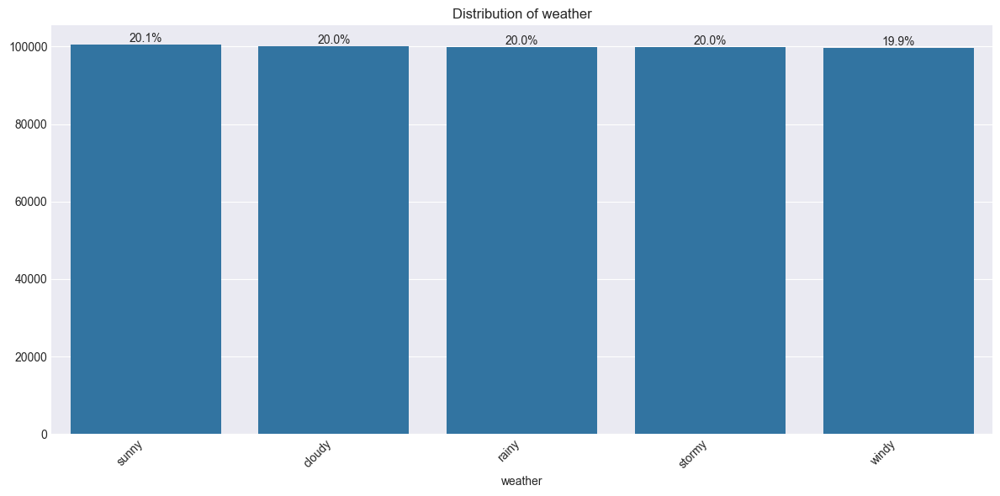


Value counts for weather:


,Count,Percentage
weather,,
sunny,100433,20.09
cloudy,100060,20.01
rainy,99971,19.99
stormy,99955,19.99
windy,99576,19.92


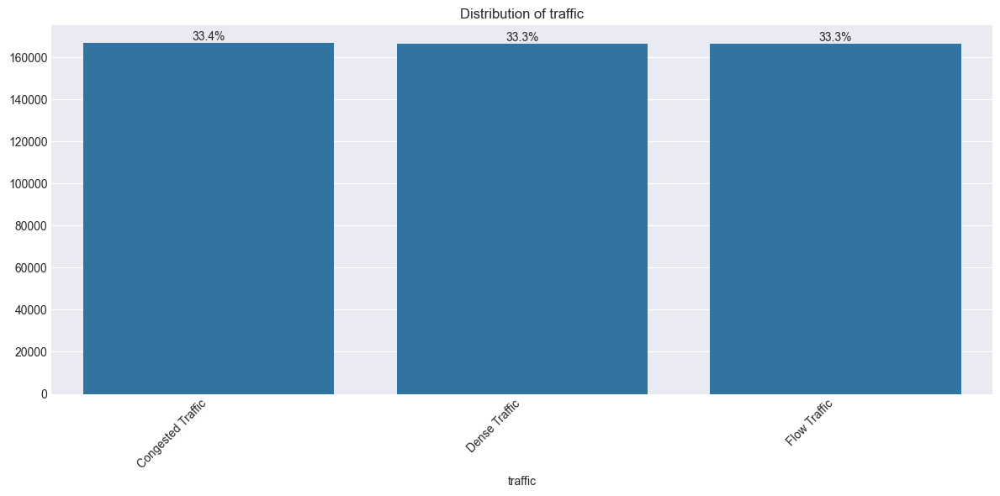


Value counts for traffic:


,Count,Percentage
traffic,,
Congested Traffic,166846,33.37
Dense Traffic,166581,33.32
Flow Traffic,166568,33.31


In [22]:
# Select categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns.tolist()
categorical_cols = [col for col in categorical_cols if df[col].nunique() < 30]  # Filter out high cardinality

for col in categorical_cols:
    plt.figure(figsize=(12, 6))
    value_counts = df[col].value_counts().sort_values(ascending=False)
    
    # Bar plot
    ax = sns.barplot(x=value_counts.index, y=value_counts.values)
    plt.title(f'Distribution of {col}')
    plt.xticks(rotation=45, ha='right')
    
    # Add percentage labels
    total = len(df)
    for i, p in enumerate(ax.patches):
        percentage = 100 * p.get_height() / total
        ax.annotate(f'{percentage:.1f}%', 
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha = 'center', va = 'bottom', rotation=0)
    
    plt.tight_layout()
    plt.show()
    
    # Print detailed breakdown
    print(f"\nValue counts for {col}:")
    count_df = pd.DataFrame({
        'Count': df[col].value_counts(),
        'Percentage': df[col].value_counts(normalize=True).mul(100).round(2)
    })
    display(count_df)

#### Temporal Analysis

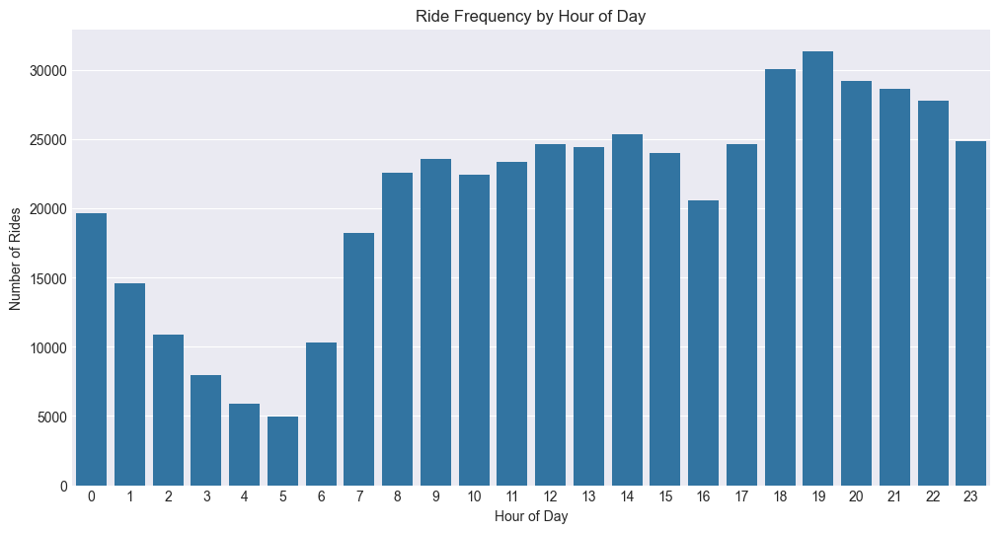

Hourly distribution of rides:
Hour 0: 3.93% of rides
Hour 1: 2.91% of rides
Hour 2: 2.18% of rides
Hour 3: 1.59% of rides
Hour 4: 1.17% of rides
Hour 5: 1.0% of rides
Hour 6: 2.07% of rides
Hour 7: 3.65% of rides
Hour 8: 4.52% of rides
Hour 9: 4.71% of rides
Hour 10: 4.49% of rides
Hour 11: 4.67% of rides
Hour 12: 4.93% of rides
Hour 13: 4.88% of rides
Hour 14: 5.08% of rides
Hour 15: 4.81% of rides
Hour 16: 4.11% of rides
Hour 17: 4.93% of rides
Hour 18: 6.01% of rides
Hour 19: 6.28% of rides
Hour 20: 5.84% of rides
Hour 21: 5.73% of rides
Hour 22: 5.56% of rides
Hour 23: 4.97% of rides


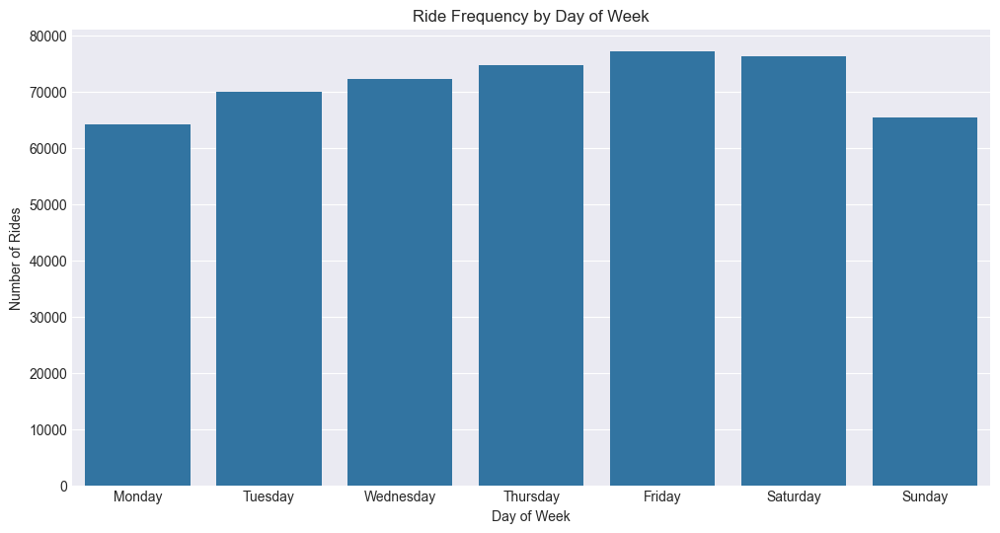

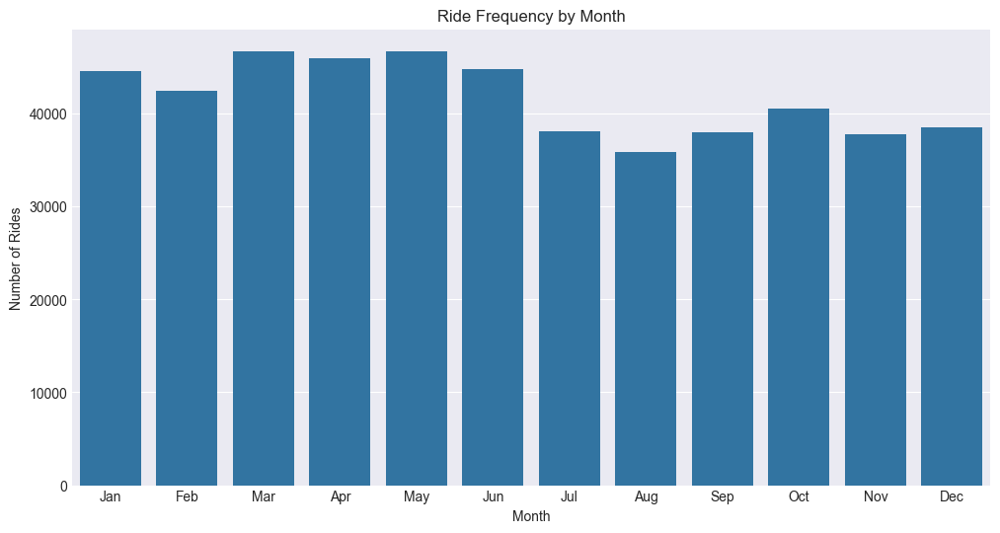

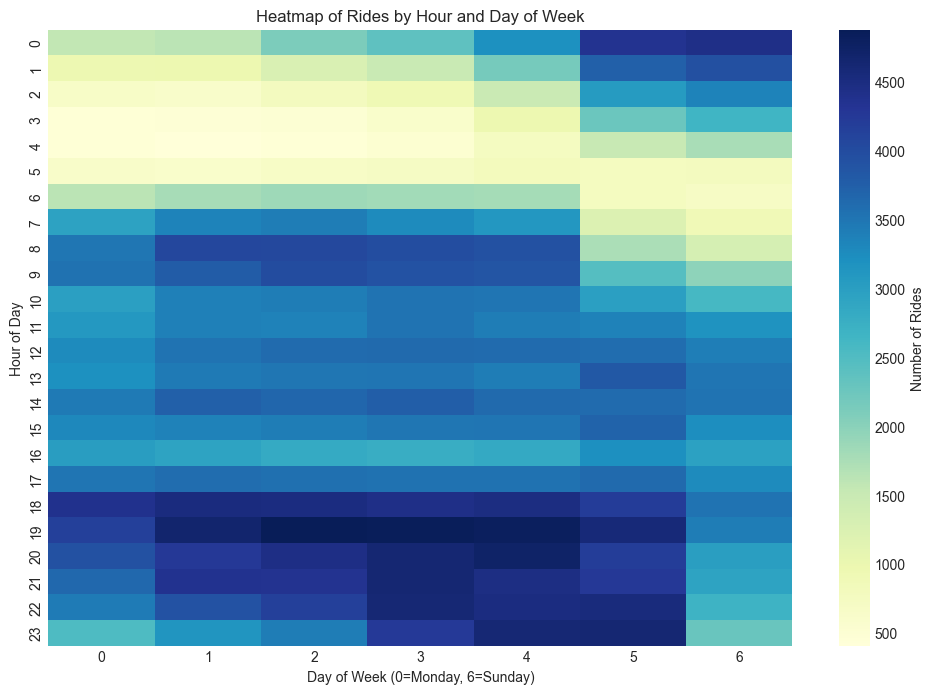

In [23]:
# Hour of day patterns
plt.figure(figsize=(12, 6))
hourly_counts = df.groupby('request_hour').size()
sns.barplot(x=hourly_counts.index, y=hourly_counts.values)
plt.title('Ride Frequency by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Rides')
plt.xticks(range(24))
plt.show()

# Add percentage labels
total_rides = len(df)
hourly_percentages = (hourly_counts / total_rides * 100).round(2)
print("Hourly distribution of rides:")
for hour, percentage in hourly_percentages.items():
    print(f"Hour {hour}: {percentage}% of rides")

# Day of week patterns
weekday_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekday_counts = df.groupby('request_weekday').size()
plt.figure(figsize=(12, 6))
sns.barplot(x=[weekday_names[i] for i in range(7)], y=[weekday_counts.get(i, 0) for i in range(7)])
plt.title('Ride Frequency by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Number of Rides')
plt.show()

# Monthly patterns
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
monthly_counts = df.groupby('request_month').size()
plt.figure(figsize=(12, 6))
sns.barplot(x=[month_names[i-1] for i in range(1, 13)], y=[monthly_counts.get(i, 0) for i in range(1, 13)])
plt.title('Ride Frequency by Month')
plt.xlabel('Month')
plt.ylabel('Number of Rides')
plt.show()

# Temporal heatmap: Hour by Weekday
hour_day_heatmap = pd.crosstab(df['request_hour'], df['request_weekday'])
plt.figure(figsize=(12, 8))
sns.heatmap(hour_day_heatmap, cmap='YlGnBu', annot=False, fmt='d', cbar_kws={'label': 'Number of Rides'})
plt.title('Heatmap of Rides by Hour and Day of Week')
plt.xlabel('Day of Week (0=Monday, 6=Sunday)')
plt.ylabel('Hour of Day')
plt.show()

#### Geospatial Analysis

Pickup heatmap saved to 'pickup_heatmap.html'
Dropoff heatmap saved to 'dropoff_heatmap.html'


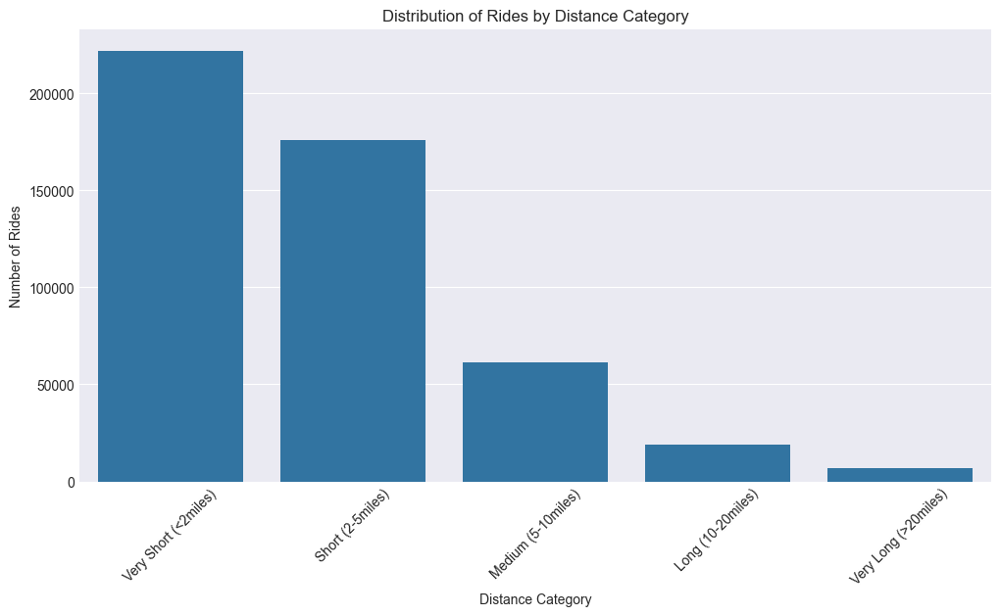

In [24]:
# Create base map centered on average coordinates
base_map = folium.Map(
    location=[df['pickup_lat'].mean(), df['pickup_lon'].mean()],
    zoom_start=12
)

# Add pickup heatmap using all data points
pickup_points = df[['pickup_lat', 'pickup_lon']].values.tolist()
HeatMap(pickup_points, radius=15).add_to(base_map)

# Save to HTML file
base_map.save('pickup_heatmap.html')
print("Pickup heatmap saved to 'pickup_heatmap.html'")

# Create dropoff heatmap
dropoff_map = folium.Map(
    location=[df['dropoff_lat'].mean(), df['dropoff_lon'].mean()],
    zoom_start=12
)
dropoff_points = df[['dropoff_lat', 'dropoff_lon']].values.tolist()
HeatMap(dropoff_points, radius=15).add_to(dropoff_map)
dropoff_map.save('dropoff_heatmap.html')
print("Dropoff heatmap saved to 'dropoff_heatmap.html'")

# Analyze ride distances by zone
# Create distance bins for analysis
df['distance_category'] = pd.cut(
    df['ride_distance'], 
    bins=[0, 2, 5, 10, 20, np.inf], 
    labels=['Very Short (<2miles)', 'Short (2-5miles)', 'Medium (5-10miles)', 'Long (10-20miles)', 'Very Long (>20miles)']
)

plt.figure(figsize=(12, 6))
distance_counts = df['distance_category'].value_counts().sort_index()
sns.barplot(x=distance_counts.index, y=distance_counts.values)
plt.title('Distribution of Rides by Distance Category')
plt.xlabel('Distance Category')
plt.ylabel('Number of Rides')
plt.xticks(rotation=45)
plt.show()


#### Outliers


Outlier Detection Summary:

Column Details:

fare:
Z-score outliers: 13325 (2.67%)
IQR outliers: 43329 (8.67%)

pickup_lon:
Z-score outliers: 9776 (1.96%)
IQR outliers: 33965 (6.79%)

pickup_lat:
Z-score outliers: 9720 (1.94%)
IQR outliers: 23701 (4.74%)

dropoff_lon:
Z-score outliers: 9790 (1.96%)
IQR outliers: 35805 (7.16%)

dropoff_lat:
Z-score outliers: 9736 (1.95%)
IQR outliers: 30748 (6.15%)

passengers:
Z-score outliers: 10590 (2.12%)
IQR outliers: 56526 (11.31%)

request_hour:
Z-score outliers: 0 (0.00%)
IQR outliers: 0 (0.00%)

request_day:
Z-score outliers: 0 (0.00%)
IQR outliers: 0 (0.00%)

request_month:
Z-score outliers: 0 (0.00%)
IQR outliers: 0 (0.00%)

request_weekday:
Z-score outliers: 0 (0.00%)
IQR outliers: 0 (0.00%)

request_year:
Z-score outliers: 0 (0.00%)
IQR outliers: 0 (0.00%)

distance_jfk:
Z-score outliers: 10148 (2.03%)
IQR outliers: 59285 (11.86%)

distance_ewr:
Z-score outliers: 10148 (2.03%)
IQR outliers: 28380 (5.68%)

distance_lga:
Z-score outliers: 10

<Figure size 2000x1500 with 0 Axes>

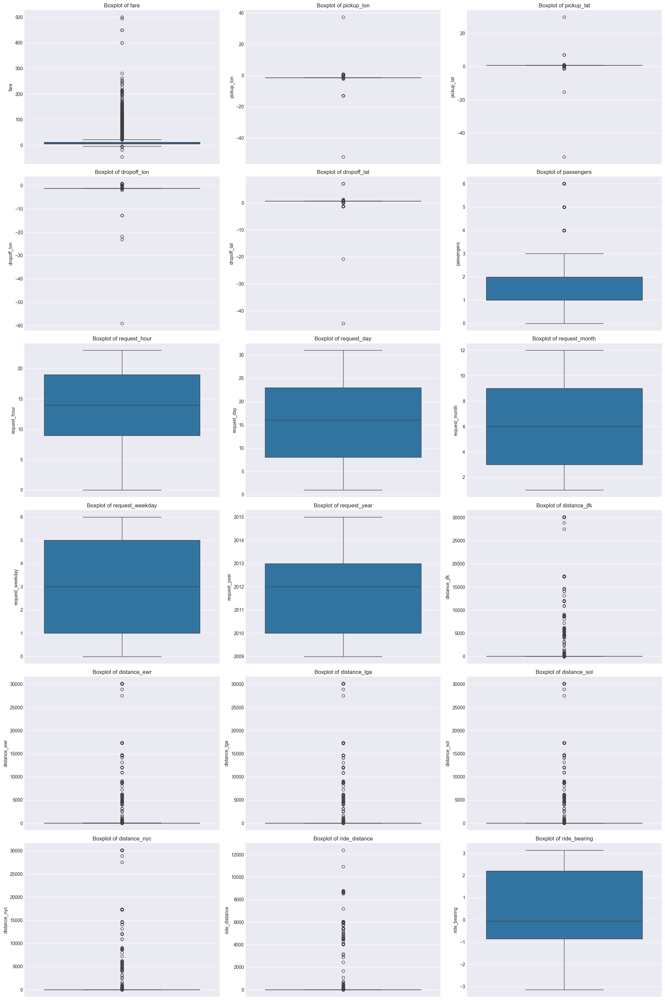

In [25]:
# Function to calculate z-score outliers
def detect_zscore_outliers(data, threshold=3):
    z_scores = (data - data.mean()) / data.std()
    return data[abs(z_scores) > threshold]

# Function to calculate IQR outliers
def detect_iqr_outliers(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return data[(data < lower_bound) | (data > upper_bound)]

# Create figure with subplots
plt.figure(figsize=(20, 15))

# List of numerical columns
numerical_columns = ['fare', 'pickup_lon', 'pickup_lat', 'dropoff_lon', 'dropoff_lat', 
                    'passengers', 'request_hour', 'request_day', 'request_month', 'request_weekday',
                    'request_year', 'distance_jfk', 'distance_ewr', 'distance_lga', 
                    'distance_sol', 'distance_nyc', 'ride_distance', 'ride_bearing']

# Create boxplots and calculate outliers
outlier_summary = {}
for i, column in enumerate(numerical_columns):
    # Skip any columns with missing values
    if df[column].isnull().any():
        continue
        
    # Calculate outliers using both methods
    zscore_outliers = detect_zscore_outliers(df[column])
    iqr_outliers = detect_iqr_outliers(df[column])
    
    # Store results
    outlier_summary[column] = {
        'zscore_count': len(zscore_outliers),
        'zscore_percent': (len(zscore_outliers) / len(df)) * 100,
        'iqr_count': len(iqr_outliers),
        'iqr_percent': (len(iqr_outliers) / len(df)) * 100,
        'total_records': len(df)
    }

# Create a summary DataFrame
summary_df = pd.DataFrame.from_dict(outlier_summary, orient='index')
summary_df = summary_df.round(2)

# Print the summary
print("\nOutlier Detection Summary:")
print("\nColumn Details:")
for column in numerical_columns:
    if column in outlier_summary:
        print(f"\n{column}:")
        print(f"Z-score outliers: {outlier_summary[column]['zscore_count']} "
              f"({outlier_summary[column]['zscore_percent']:.2f}%)")
        print(f"IQR outliers: {outlier_summary[column]['iqr_count']} "
              f"({outlier_summary[column]['iqr_percent']:.2f}%)")

# Create boxplots for visualization
fig, axes = plt.subplots(6, 3, figsize=(20, 30))
axes = axes.ravel()

for idx, column in enumerate(numerical_columns):
    if idx < len(axes):  # Ensure we don't exceed the number of subplots
        sns.boxplot(data=df, y=column, ax=axes[idx])
        axes[idx].set_title(f'Boxplot of {column}')
        axes[idx].tick_params(axis='x', rotation=45)

# Remove empty subplots if any
for idx in range(len(numerical_columns), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()


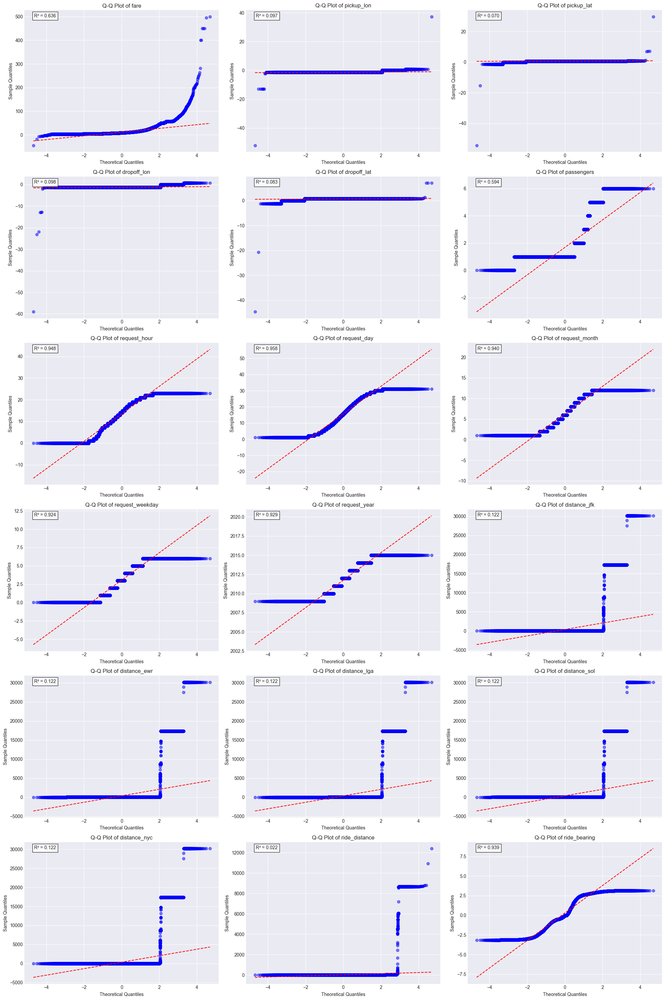


Normality test for fare:
p-value: 0.0000000000
Skewness: 4.898
Kurtosis: 83.178

Normality test for pickup_lon:
p-value: 0.0000000000
Skewness: -14.008
Kurtosis: 9868.853

Normality test for pickup_lat:
p-value: 0.0000000000
Skewness: -108.101
Kurtosis: 50711.452

Normality test for dropoff_lon:
p-value: 0.0000000000
Skewness: -44.819
Kurtosis: 12950.743

Normality test for dropoff_lat:
p-value: 0.0000000000
Skewness: -100.307
Kurtosis: 32220.109

Normality test for passengers:
p-value: 0.0000000000
Skewness: 1.974
Kurtosis: 2.758

Normality test for request_hour:
p-value: 0.0000000000
Skewness: -0.435
Kurtosis: -0.767

Normality test for request_day:
p-value: 0.0000000000
Skewness: 0.020
Kurtosis: -1.159

Normality test for request_month:
p-value: 0.0000000000
Skewness: 0.110
Kurtosis: -1.198

Normality test for request_weekday:
p-value: 0.0000000000
Skewness: -0.041
Kurtosis: -1.200

Normality test for request_year:
p-value: 0.0000000000
Skewness: 0.066
Kurtosis: -1.143

Normality t

In [26]:
# Create figure with subplots
fig, axes = plt.subplots(6, 3, figsize=(20, 30))
axes = axes.ravel()

# List of numerical columns
numerical_columns = ['fare', 'pickup_lon', 'pickup_lat', 'dropoff_lon', 'dropoff_lat', 
                    'passengers', 'request_hour', 'request_day', 'request_month', 'request_weekday',
                    'request_year', 'distance_jfk', 'distance_ewr', 'distance_lga', 
                    'distance_sol', 'distance_nyc', 'ride_distance', 'ride_bearing']

# Create Q-Q plots for each numerical column
for idx, column in enumerate(numerical_columns):
    if idx < len(axes):  # Ensure we don't exceed the number of subplots
        # Calculate theoretical quantiles
        data = df[column].dropna()
        (quantiles, values), (slope, intercept, r) = stats.probplot(data, dist="norm")
        
        # Create Q-Q plot
        axes[idx].scatter(quantiles, values, color='blue', alpha=0.5)
        axes[idx].plot(quantiles, slope * quantiles + intercept, color='red', linestyle='--')
        
        # Add labels and title
        axes[idx].set_title(f'Q-Q Plot of {column}')
        axes[idx].set_xlabel('Theoretical Quantiles')
        axes[idx].set_ylabel('Sample Quantiles')
        
        # Calculate and display R-squared value
        r_squared = r ** 2
        axes[idx].text(0.05, 0.95, f'R² = {r_squared:.3f}', 
                      transform=axes[idx].transAxes, 
                      bbox=dict(facecolor='white', alpha=0.8))

# Remove empty subplots if any
for idx in range(len(numerical_columns), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

# Print detailed statistics for each column
for column in numerical_columns:
    if not df[column].isnull().any():
        print(f"\nNormality test for {column}:")
        stat, p_value = stats.normaltest(df[column])
        print(f"p-value: {p_value:.10f}")
        print(f"Skewness: {stats.skew(df[column]):.3f}")
        print(f"Kurtosis: {stats.kurtosis(df[column]):.3f}")

#### Bivariate and Multivariate Analysis

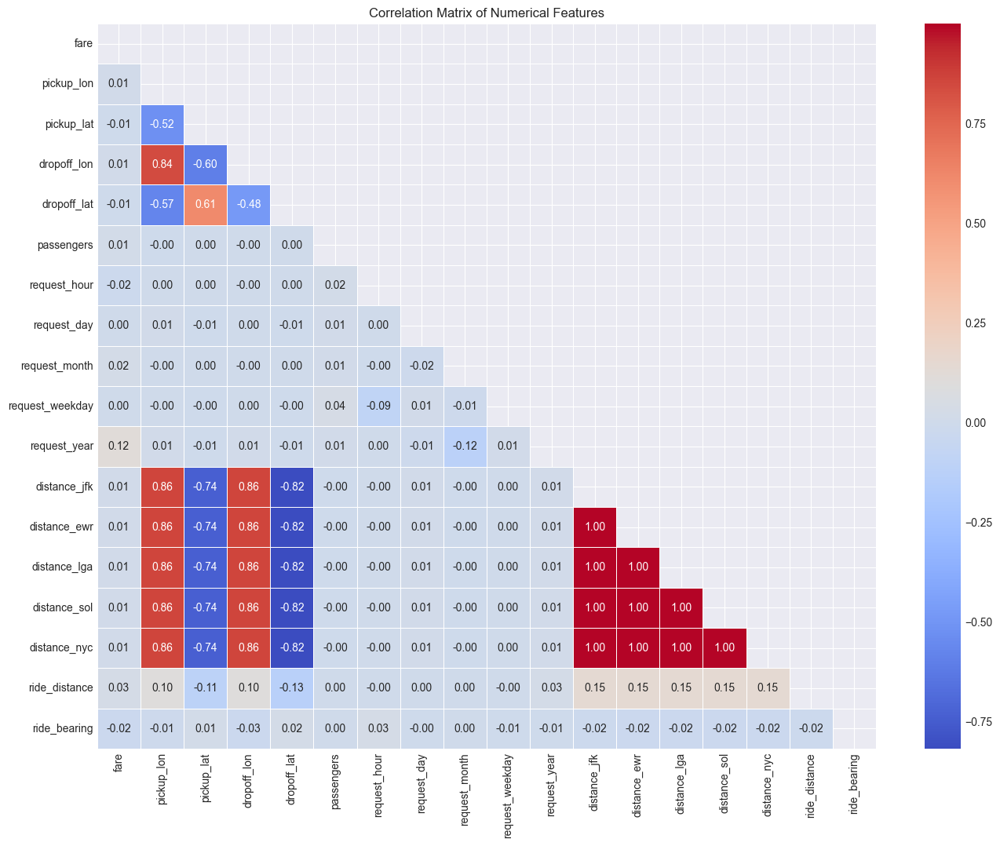

Top correlations with fare:


fare               1.000000
request_year       0.115774
ride_distance      0.026486
request_month      0.024429
passengers         0.013823
distance_nyc       0.009764
distance_ewr       0.009654
distance_sol       0.009609
dropoff_lon        0.009233
distance_lga       0.009006
pickup_lon         0.008822
distance_jfk       0.008002
request_weekday    0.003152
request_day        0.001900
pickup_lat        -0.007779
dropoff_lat       -0.007865
request_hour      -0.019272
ride_bearing      -0.024303
Name: fare, dtype: float64

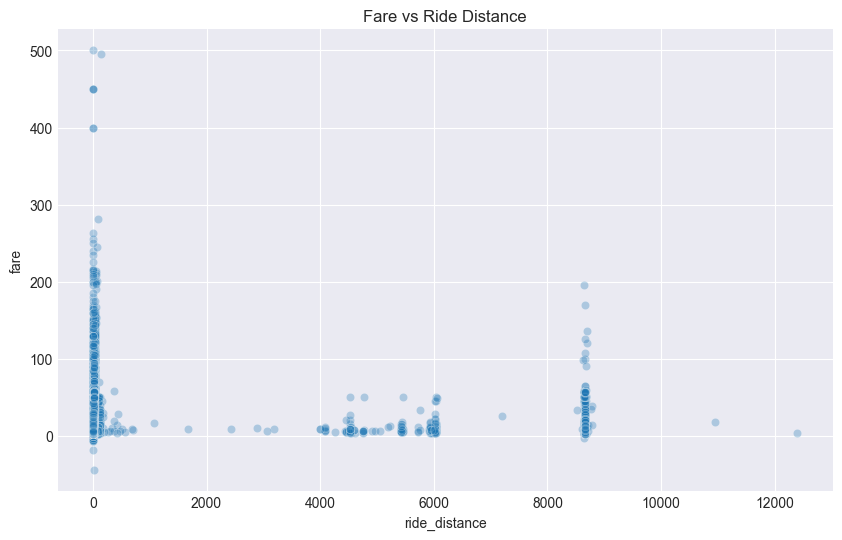

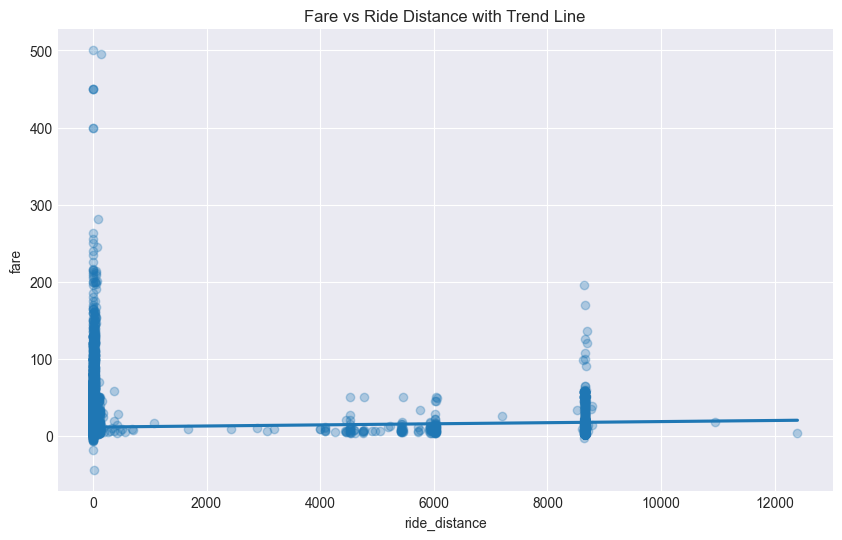

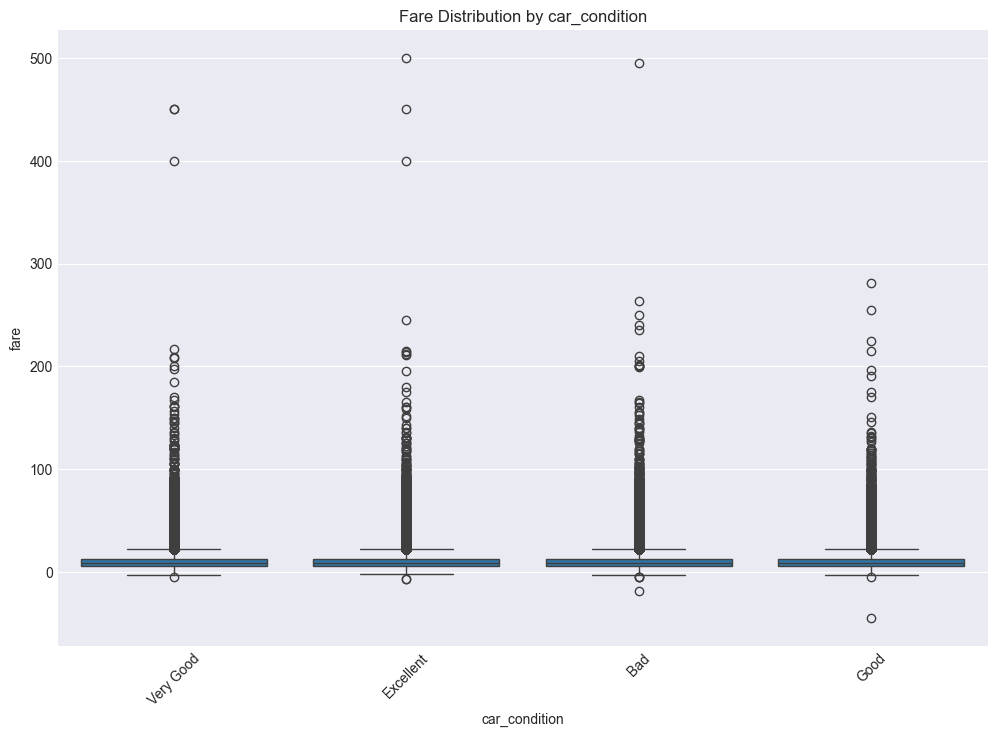


Mean fare by car_condition:
Very Good: $11.42
Excellent: $11.36
Good: $11.34
Bad: $11.33


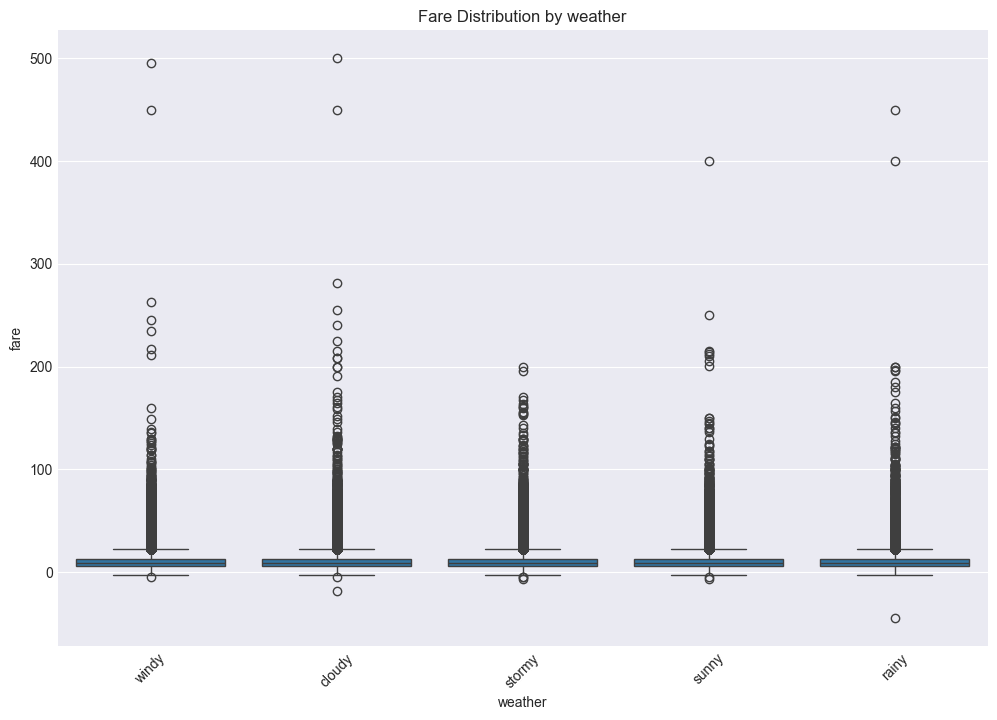


Mean fare by weather:
cloudy: $11.38
sunny: $11.36
rainy: $11.36
windy: $11.35
stormy: $11.35


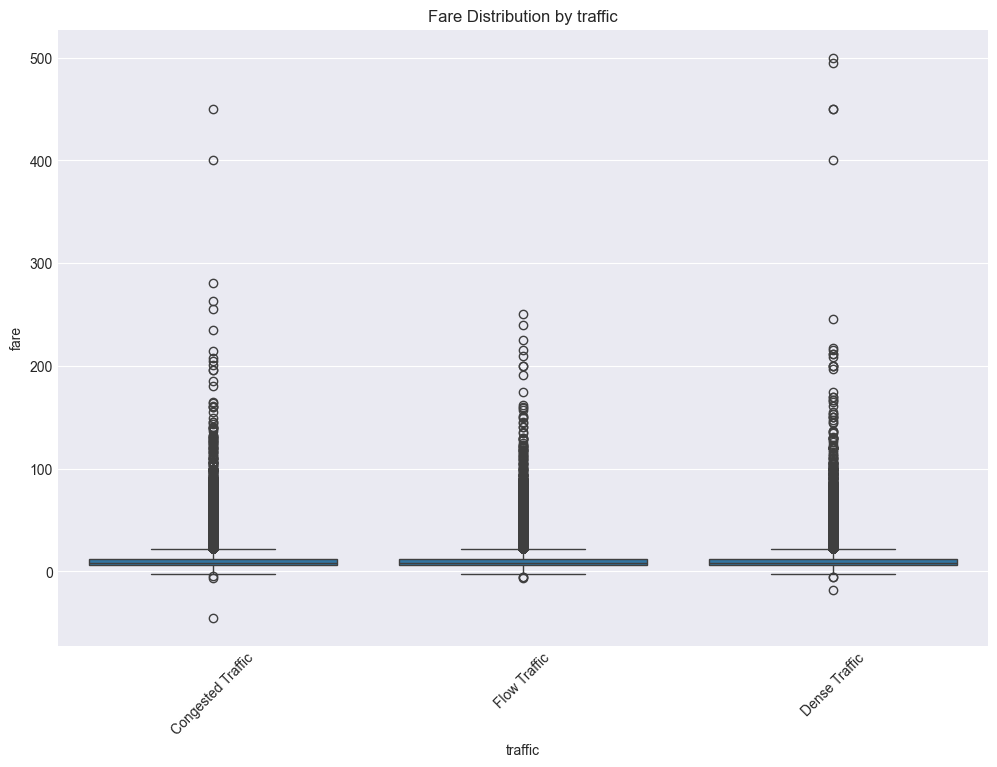


Mean fare by traffic:
Congested Traffic: $11.39
Dense Traffic: $11.37
Flow Traffic: $11.32


In [27]:
# Correlation matrix for numerical features
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
correlation_matrix = df[numerical_columns].corr()

plt.figure(figsize=(16, 12))
mask = np.triu(correlation_matrix)
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5, mask=mask)
plt.title('Correlation Matrix of Numerical Features')
plt.show()

# Top correlations with fare (assuming fare is the target variable)
fare_correlations = correlation_matrix['fare'].sort_values(ascending=False)
print("Top correlations with fare:")
display(fare_correlations)

# Scatter plots for key relationships
plt.figure(figsize=(10, 6))
sns.scatterplot(x='ride_distance', y='fare', data=df, alpha=0.3)
plt.title('Fare vs Ride Distance')
plt.show()

# Add regression line to see trend
plt.figure(figsize=(10, 6))
sns.regplot(x='ride_distance', y='fare', data=df, scatter_kws={'alpha':0.3})
plt.title('Fare vs Ride Distance with Trend Line')
plt.show()

# Key categorical variable effects on fare
for cat_var in ['car_condition', 'weather', 'traffic']:
    plt.figure(figsize=(12, 8))
    sns.boxplot(x=cat_var, y='fare', data=df)
    plt.title(f'Fare Distribution by {cat_var}')
    plt.xticks(rotation=45)
    plt.show()
    
    # Calculate mean fare by category
    category_means = df.groupby(cat_var)['fare'].mean().sort_values(ascending=False)
    print(f"\nMean fare by {cat_var}:")
    for category, mean_fare in category_means.items():
        print(f"{category}: ${mean_fare:.2f}")

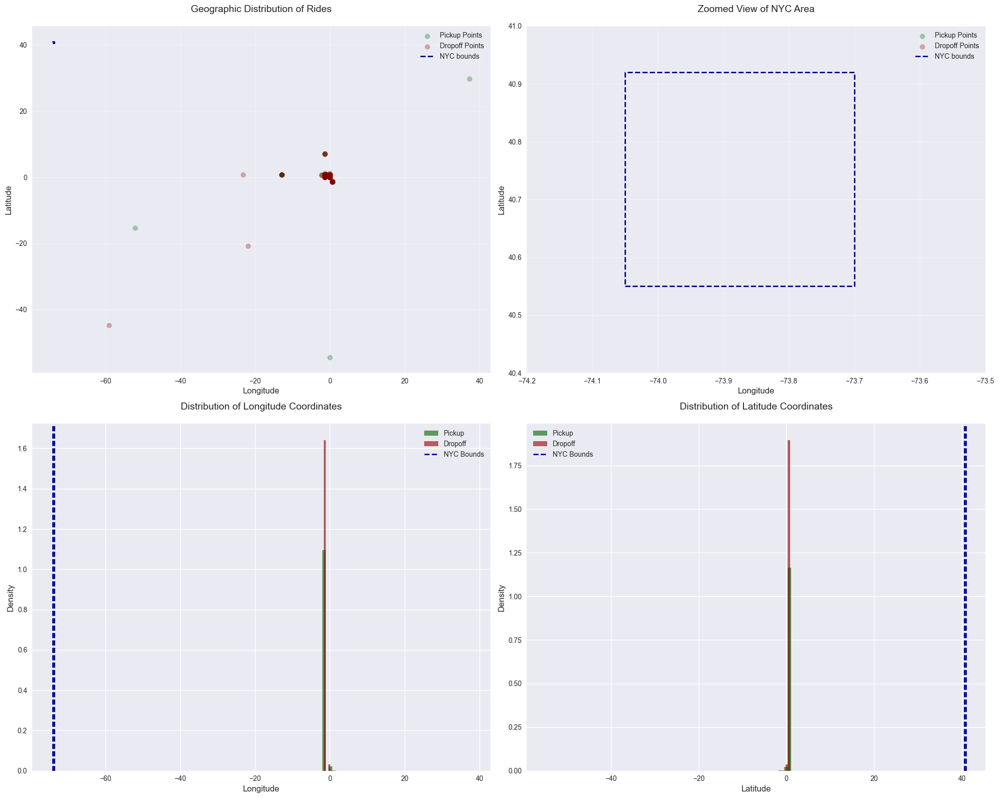


=== Geographic Distribution Analysis ===

Total rides analyzed: 499,995
Rides outside NYC bounds: 499,995 (100.0%)

Coordinate Ranges:

Pickup Points:
Longitude: [-52.1198 to 37.3605]
Latitude: [-54.3894 to 29.7246]

Dropoff Points:
Longitude: [-59.0497 to 0.7130]
Latitude: [-44.6760 to 7.0619]


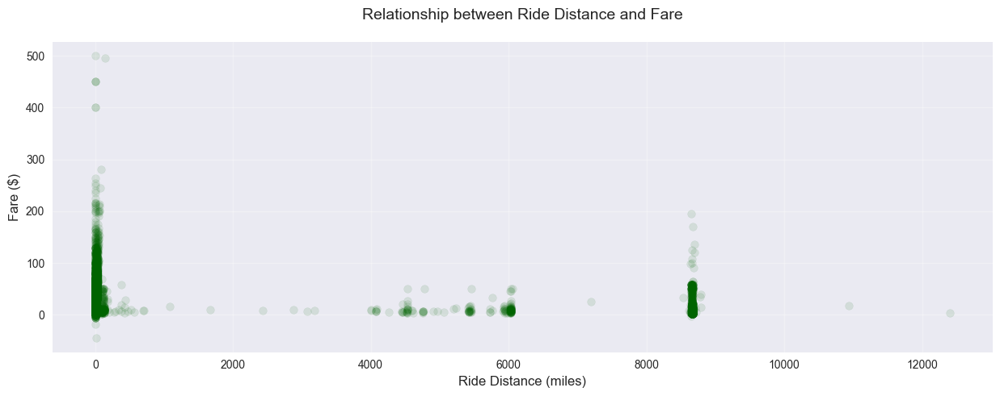

In [28]:
# Create a figure with 2x2 subplots
plt.style.use('seaborn-v0_8')
fig, axes = plt.subplots(2, 2, figsize=(20, 16))

# Define a darker color palette
colors = {
    'pickup': '#006400',    # dark green
    'dropoff': '#8B0000',   # dark red
    'bounds': '#00008B',    # dark blue
    'background': '#ffffff'  # white
}

# 1. Overall Distribution (Top Left)
scatter1 = axes[0,0].scatter(df['pickup_lon'], df['pickup_lat'], 
                            alpha=0.3, c=colors['pickup'], label='Pickup Points')
scatter2 = axes[0,0].scatter(df['dropoff_lon'], df['dropoff_lat'], 
                            alpha=0.3, c=colors['dropoff'], label='Dropoff Points')
axes[0,0].plot([-74.05, -73.70, -73.70, -74.05, -74.05],
               [40.55, 40.55, 40.92, 40.92, 40.55],
               c=colors['bounds'], linestyle='--', linewidth=2, label='NYC bounds')
axes[0,0].set_title('Geographic Distribution of Rides', fontsize=14, pad=20)
axes[0,0].set_xlabel('Longitude', fontsize=12)
axes[0,0].set_ylabel('Latitude', fontsize=12)
axes[0,0].legend(fontsize=10)
axes[0,0].grid(True, alpha=0.3)

# 2. Zoomed Distribution (Top Right)
scatter3 = axes[0,1].scatter(df['pickup_lon'], df['pickup_lat'], 
                            alpha=0.3, c=colors['pickup'], label='Pickup Points')
scatter4 = axes[0,1].scatter(df['dropoff_lon'], df['dropoff_lat'], 
                            alpha=0.3, c=colors['dropoff'], label='Dropoff Points')
axes[0,1].plot([-74.05, -73.70, -73.70, -74.05, -74.05],
               [40.55, 40.55, 40.92, 40.92, 40.55],
               c=colors['bounds'], linestyle='--', linewidth=2, label='NYC bounds')
axes[0,1].set_title('Zoomed View of NYC Area', fontsize=14, pad=20)
axes[0,1].set_xlabel('Longitude', fontsize=12)
axes[0,1].set_ylabel('Latitude', fontsize=12)
axes[0,1].set_xlim(-74.2, -73.5)
axes[0,1].set_ylim(40.4, 41.0)
axes[0,1].legend(fontsize=10)
axes[0,1].grid(True, alpha=0.3)

# 3. Longitude Distribution (Bottom Left)
axes[1,0].hist(df['pickup_lon'], bins=100, alpha=0.6, color=colors['pickup'], 
               label='Pickup', density=True)
axes[1,0].hist(df['dropoff_lon'], bins=100, alpha=0.6, color=colors['dropoff'], 
               label='Dropoff', density=True)
axes[1,0].axvline(-74.05, color=colors['bounds'], linestyle='--', 
                  linewidth=2, label='NYC Bounds')
axes[1,0].axvline(-73.70, color=colors['bounds'], linestyle='--', linewidth=2)
axes[1,0].set_title('Distribution of Longitude Coordinates', fontsize=14, pad=20)
axes[1,0].set_xlabel('Longitude', fontsize=12)
axes[1,0].set_ylabel('Density', fontsize=12)
axes[1,0].legend(fontsize=10)

# 4. Latitude Distribution (Bottom Right)
axes[1,1].hist(df['pickup_lat'], bins=100, alpha=0.6, color=colors['pickup'], 
               label='Pickup', density=True)
axes[1,1].hist(df['dropoff_lat'], bins=100, alpha=0.6, color=colors['dropoff'], 
               label='Dropoff', density=True)
axes[1,1].axvline(40.55, color=colors['bounds'], linestyle='--', 
                  linewidth=2, label='NYC Bounds')
axes[1,1].axvline(40.92, color=colors['bounds'], linestyle='--', linewidth=2)
axes[1,1].set_title('Distribution of Latitude Coordinates', fontsize=14, pad=20)
axes[1,1].set_xlabel('Latitude', fontsize=12)
axes[1,1].set_ylabel('Density', fontsize=12)
axes[1,1].legend(fontsize=10)

# Adjust layout and display
plt.tight_layout()
plt.show()

# Print statistics about points outside bounds
nyc_bounds = {
    'lon_min': -74.05, 'lon_max': -73.70,
    'lat_min': 40.55, 'lat_max': 40.92
}

outside_bounds = df[
    (df['pickup_lon'] < nyc_bounds['lon_min']) | (df['pickup_lon'] > nyc_bounds['lon_max']) |
    (df['pickup_lat'] < nyc_bounds['lat_min']) | (df['pickup_lat'] > nyc_bounds['lat_max']) |
    (df['dropoff_lon'] < nyc_bounds['lon_min']) | (df['dropoff_lon'] > nyc_bounds['lon_max']) |
    (df['dropoff_lat'] < nyc_bounds['lat_min']) | (df['dropoff_lat'] > nyc_bounds['lat_max'])
]

# Print detailed analysis
print("\n=== Geographic Distribution Analysis ===")
print(f"\nTotal rides analyzed: {len(df):,}")
print(f"Rides outside NYC bounds: {len(outside_bounds):,} ({len(outside_bounds)/len(df)*100:.1f}%)")

print("\nCoordinate Ranges:")
print("\nPickup Points:")
print(f"Longitude: [{df['pickup_lon'].min():.4f} to {df['pickup_lon'].max():.4f}]")
print(f"Latitude: [{df['pickup_lat'].min():.4f} to {df['pickup_lat'].max():.4f}]")

print("\nDropoff Points:")
print(f"Longitude: [{df['dropoff_lon'].min():.4f} to {df['dropoff_lon'].max():.4f}]")
print(f"Latitude: [{df['dropoff_lat'].min():.4f} to {df['dropoff_lat'].max():.4f}]")

# Additional visualizations
plt.figure(figsize=(15, 5))
plt.scatter(df['ride_distance'], df['fare'], alpha=0.1, c='#006400')  # Using darker green
plt.title('Relationship between Ride Distance and Fare', fontsize=14, pad=20)
plt.xlabel('Ride Distance (miles)', fontsize=12)
plt.ylabel('Fare ($)', fontsize=12)
plt.grid(True, alpha=0.3)
plt.show()

---


#### Split before processing to prevent leakage

To prevent data leakage during model development and validation, it's important to split the data into training and test sets before any preprocessing. This ensures that:

1. Test data remains completely unseen during preprocessing steps
2. Scaling and normalization parameters are learned only from training data
3. Outlier detection and removal strategies are developed using training data only
4. Any feature engineering is done independently on train and test sets
5. Model selection and hyperparameter tuning can be performed without test data influence
This approach maintains the integrity of the final model evaluation on truly unseen data.

> NOTE 
>
>⚠️The modeling tasks are currently pending. We need to complete the Exploratory Data Analysis (EDA) phase first to gain comprehensive insights from the complete dataset before proceeding with any data splitting or model development.

*Status: Data splitting implementation is not active yet since we're conducting Exploratory Data Analysis (EDA) which requires the full dataset for comprehensive insights* 📊 🔍

In [29]:
# Split the data into training and testing sets to avoid data leakage
# Ration for 500k rows: 85% training, 15% testing

# Define features and target variable
# Target variable (label): 'fare'
# Features: All columns except 'fare'

X = df.drop(columns=['fare'])
y = df['fare']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)

# Check the shapes of the resulting datasets
X_train.shape, X_test.shape, y_train.shape, y_test.shape


((424995, 26), (75000, 26), (424995,), (75000,))

In [30]:
# Merge the training features and target variable
train_data = pd.concat([X_train, y_train], axis=1)
train_data.head()

,user_id,user_name,driver_name,car_condition,weather,traffic,ride_id,pickup_time,pickup_lon,pickup_lat,...,request_year,distance_jfk,distance_ewr,distance_lga,distance_sol,distance_nyc,ride_distance,ride_bearing,distance_category,fare
277824,GBNDLz5j,Lance Clark,Nicole Edwards,Bad,cloudy,Congested Traffic,2009-10-27 18:31:00.000000138,2009-10-27 18:31:00,-1.291702,0.710692,...,2009,42.215878,31.407198,22.224380,13.732536,5.745925,4.709353,-0.642199,Short (2-5miles),14.1
331985,fvUwdu59,Thomas Barker,Paul Chandler,Bad,rainy,Dense Traffic,2015-01-19 12:55:45.0000003,2015-01-19 12:55:45,-1.291262,0.711489,...,2015,45.400157,35.440644,19.100641,20.682024,13.059696,1.222237,0.223132,Very Short (<2miles),5.5
152744,kxkCUl7t,Tracy Jimenez,Tammy Ruiz,Very Good,sunny,Congested Traffic,2015-04-21 20:14:36.00000011,2015-04-21 20:14:36,-1.291661,0.710852,...,2015,43.280201,27.424541,26.316899,9.316600,2.405804,1.580179,2.668377,Very Short (<2miles),6.5
260253,nbZCnkMA,Terri Mcgrath,Norman Mayer,Bad,rainy,Dense Traffic,2009-01-17 03:04:00.00000094,2009-01-17 03:04:00,-1.291272,0.710926,...,2009,35.081435,35.150507,22.223180,15.544722,8.854023,6.096014,-2.540644,Medium (5-10miles),15.3
484522,5bC7JDla,Robin Hart,Paul Cardenas,Bad,stormy,Congested Traffic,2013-05-19 12:25:00.000000208,2013-05-19 12:25:00,-1.290829,0.711660,...,2013,44.196215,38.668537,16.114556,23.445701,15.485430,1.618969,1.288594,Very Short (<2miles),7.0


---

### Feature Engineering
#### Step 1: Handling Outliers

In [31]:
# Make a copy of the original dataframe before any modifications
df_clean = train_data.copy()
print(f"Original dataset shape: {df_clean.shape}")

Original dataset shape: (424995, 27)


##### Remove invalid columns

In [32]:
# 1. Drop cloumns: pickup_lon,pickup_lat,dropoff_lon,dropoff_lat
df_clean.drop(columns=['pickup_lon', 'pickup_lat', 'dropoff_lon', 'dropoff_lat'], inplace=True)

# ! for X_test
X_test.drop(columns=['pickup_lon', 'pickup_lat', 'dropoff_lon', 'dropoff_lat'], inplace=True)

print(f"New dataset shape: {df_clean.shape}")

New dataset shape: (424995, 23)


In [33]:
df_clean.dtypes

user_id                object
user_name              object
driver_name            object
car_condition          object
weather                object
traffic                object
ride_id                object
pickup_time            object
passengers              int64
request_hour            int64
request_day             int64
request_month           int64
request_weekday         int64
request_year            int64
distance_jfk          float64
distance_ewr          float64
distance_lga          float64
distance_sol          float64
distance_nyc          float64
ride_distance         float64
ride_bearing          float64
distance_category    category
fare                  float64
dtype: object

In [34]:
# define usa limits and location of airports 
usa_bounds = {
    'lon_min': -125.0, 'lon_max': -67.0,
    'lat_min': 24.6, 'lat_max': 49.384358
}

airport_locations = {
    'jfk': {'name': 'JFK Airport', 'coordinates': (40.6413, -73.7781)},
    'ewr': {'name': 'Newark Airport', 'coordinates': (40.6895, -74.1745)},
    'lga': {'name': 'LaGuardia Airport', 'coordinates': (40.7769, -73.8740)},
    'sol': {'name': 'Statue of Liberty', 'coordinates': (40.6892, -74.0445)},
    'nyc': {'name': 'New York City Center', 'coordinates': (40.7128, -74.0060)}
}


max_distance_miles = 3000
min_distance_miles = 0.1

##### Remove extreme values for locations and airports distances

##### The dataset contains distance measurements to various key locations:
- Distances to airports (JFK, EWR, LGA)
- Distance to landmarks (Statue of Liberty) 
- Distance to city center (NYC)

##### Criteria for removal:
- Distances exceeding reasonable US continental limits (3000 miles)
- Zero or negative distances


In [35]:
def detect_distance_anomalies(df, max_distance_miles=3000):
    """
    Detect anomalous distance measurements in the dataset.
    
    Args:
        df: DataFrame containing distance measurements
        max_distance_miles: Maximum reasonable distance in miles
        
    Returns:
        DataFrame containing rows with anomalous distance measurements
    """
    # Define distance columns to check
    distance_columns = ['distance_jfk', 'distance_ewr', 'distance_lga', 
                       'distance_sol', 'distance_nyc']
    
    # Create mask for each distance column
    anomaly_masks = [(df[col] > max_distance_miles) for col in distance_columns]
    
    # Combine masks with OR operation
    combined_mask = anomaly_masks[0]
    for mask in anomaly_masks[1:]:
        combined_mask = combined_mask | mask
    
    # Get rows with anomalous distances
    anomalous_rows = df[combined_mask]
    
    # Print summary
    print("Distance Anomaly Detection Summary:")
    print("-" * 40)
    print(f"Total records analyzed: {len(df):,}")
    for col in distance_columns:
        anomaly_count = len(df[df[col] > max_distance_miles])
        print(f"{col}: {anomaly_count:,} anomalies "
              f"({anomaly_count/len(df)*100:.2f}%)")
    print(f"\nTotal unique anomalous rows: {len(anomalous_rows):,} "
          f"({len(anomalous_rows)/len(df)*100:.2f}%)")
    
    return anomalous_rows

# Example usage:
# Assuming df_clean is your DataFrame and 'ride_distance' is the column with ride distances in miles
anomalous_rows = detect_distance_anomalies(df_clean)
df_clean = df_clean.drop(index=anomalous_rows.index)

# Verify results
print("\nDataset sizes:")
print(f"Original: {len(df):,} rows")
print(f"Cleaned: {len(df_clean):,} rows")
print(f"Removed: {len(df) - len(df_clean):,} rows")

Distance Anomaly Detection Summary:
----------------------------------------
Total records analyzed: 424,995
distance_jfk: 8,723 anomalies (2.05%)
distance_ewr: 8,723 anomalies (2.05%)
distance_lga: 8,723 anomalies (2.05%)
distance_sol: 8,723 anomalies (2.05%)
distance_nyc: 8,723 anomalies (2.05%)

Total unique anomalous rows: 8,723 (2.05%)

Dataset sizes:
Original: 499,995 rows
Cleaned: 416,272 rows
Removed: 83,723 rows


In [36]:
df_clean.dtypes

user_id                object
user_name              object
driver_name            object
car_condition          object
weather                object
traffic                object
ride_id                object
pickup_time            object
passengers              int64
request_hour            int64
request_day             int64
request_month           int64
request_weekday         int64
request_year            int64
distance_jfk          float64
distance_ewr          float64
distance_lga          float64
distance_sol          float64
distance_nyc          float64
ride_distance         float64
ride_bearing          float64
distance_category    category
fare                  float64
dtype: object

C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_24732\1201141560.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0,0].set_xticklabels(distance_names, rotation=45)
C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_24732\1201141560.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0,1].set_xticklabels(distance_names, rotation=45)


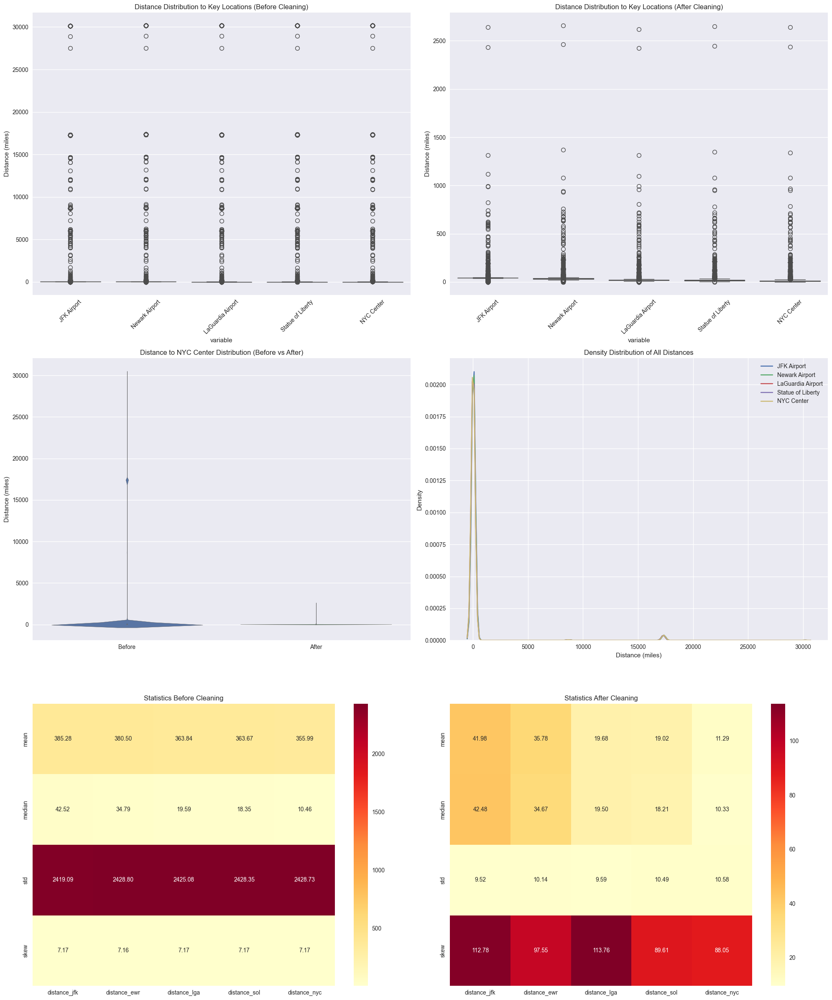


Summary of Changes in Dataset:
Records before cleaning: 499,995
Records after cleaning: 416,272
Records removed: 83,723


In [37]:
# Set style and create figure
plt.style.use('seaborn-v0_8')
fig, axes = plt.subplots(3, 2, figsize=(20, 24))

# Prepare data for all distances at once
distance_cols = ['distance_jfk', 'distance_ewr', 'distance_lga', 'distance_sol', 'distance_nyc']
distance_names = ['JFK Airport', 'Newark Airport', 'LaGuardia Airport', 'Statue of Liberty', 'NYC Center']

# Create a single boxplot for all distances
boxplot_data = pd.melt(df[distance_cols])
sns.boxplot(data=boxplot_data, x='variable', y='value', ax=axes[0,0])
axes[0,0].set_title('Distance Distribution to Key Locations (Before Cleaning)')
axes[0,0].set_xticklabels(distance_names, rotation=45)
axes[0,0].set_ylabel('Distance (miles)')

# Same boxplot for cleaned data
boxplot_df_clean = pd.melt(df_clean[distance_cols])
sns.boxplot(data=boxplot_df_clean, x='variable', y='value', ax=axes[0,1])
axes[0,1].set_title('Distance Distribution to Key Locations (After Cleaning)')
axes[0,1].set_xticklabels(distance_names, rotation=45)
axes[0,1].set_ylabel('Distance (miles)')

# Create violin plots for before/after comparison
combined_data = pd.DataFrame({
    'Before': df['distance_nyc'],
    'After': df_clean['distance_nyc']
})
sns.violinplot(data=combined_data, ax=axes[1,0])
axes[1,0].set_title('Distance to NYC Center Distribution (Before vs After)')
axes[1,0].set_ylabel('Distance (miles)')

# Create density plot for all distances
for col, name in zip(distance_cols, distance_names):
    sns.kdeplot(data=df[col], ax=axes[1,1], label=name)
axes[1,1].set_title('Density Distribution of All Distances')
axes[1,1].set_xlabel('Distance (miles)')
axes[1,1].legend()

# Summary statistics
summary_before = df[distance_cols].agg(['mean', 'median', 'std', 'skew']).round(2)
summary_after = df_clean[distance_cols].agg(['mean', 'median', 'std', 'skew']).round(2)

# Plot statistics as heatmaps
sns.heatmap(summary_before, annot=True, fmt='.2f', cmap='YlOrRd', ax=axes[2,0])
axes[2,0].set_title('Statistics Before Cleaning')

sns.heatmap(summary_after, annot=True, fmt='.2f', cmap='YlOrRd', ax=axes[2,1])
axes[2,1].set_title('Statistics After Cleaning')

plt.tight_layout()
plt.show()

# Print summary of changes
print("\nSummary of Changes in Dataset:")
print(f"Records before cleaning: {len(df):,}")
print(f"Records after cleaning: {len(df_clean):,}")
print(f"Records removed: {len(df) - len(df_clean):,}")


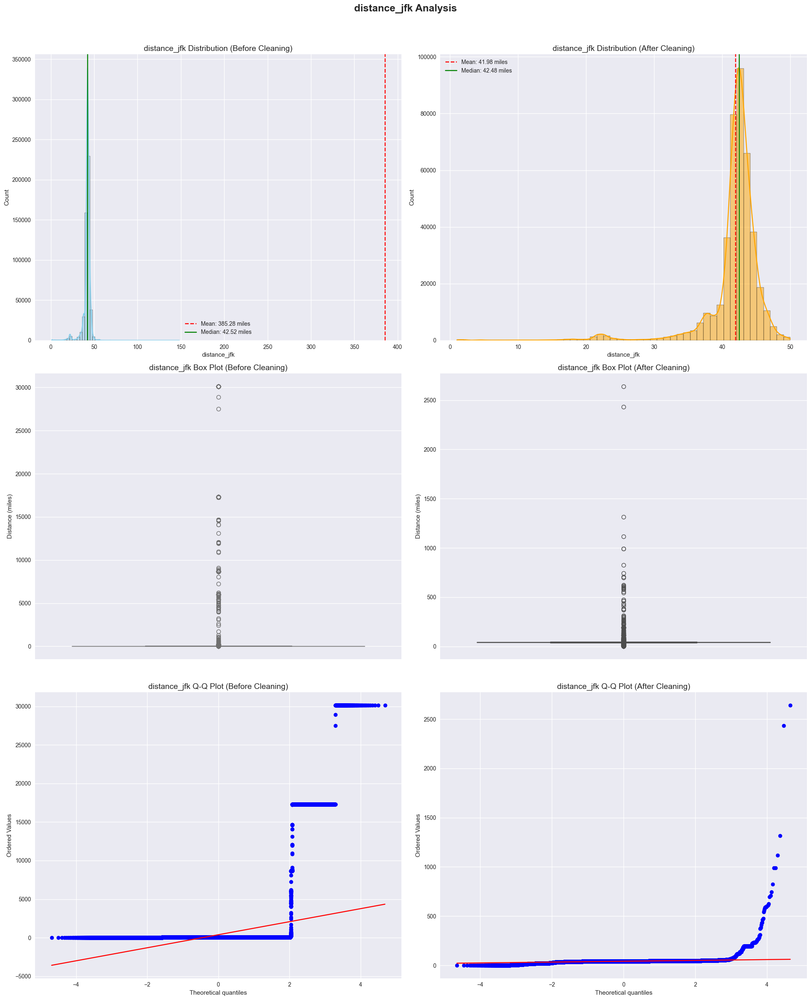

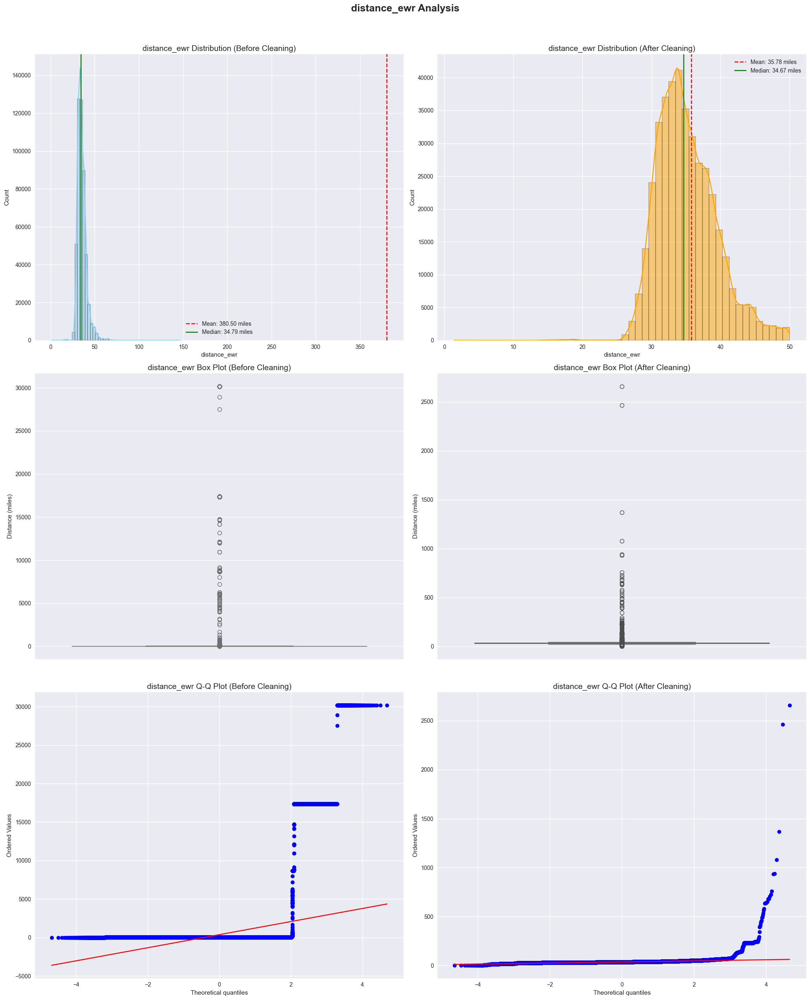

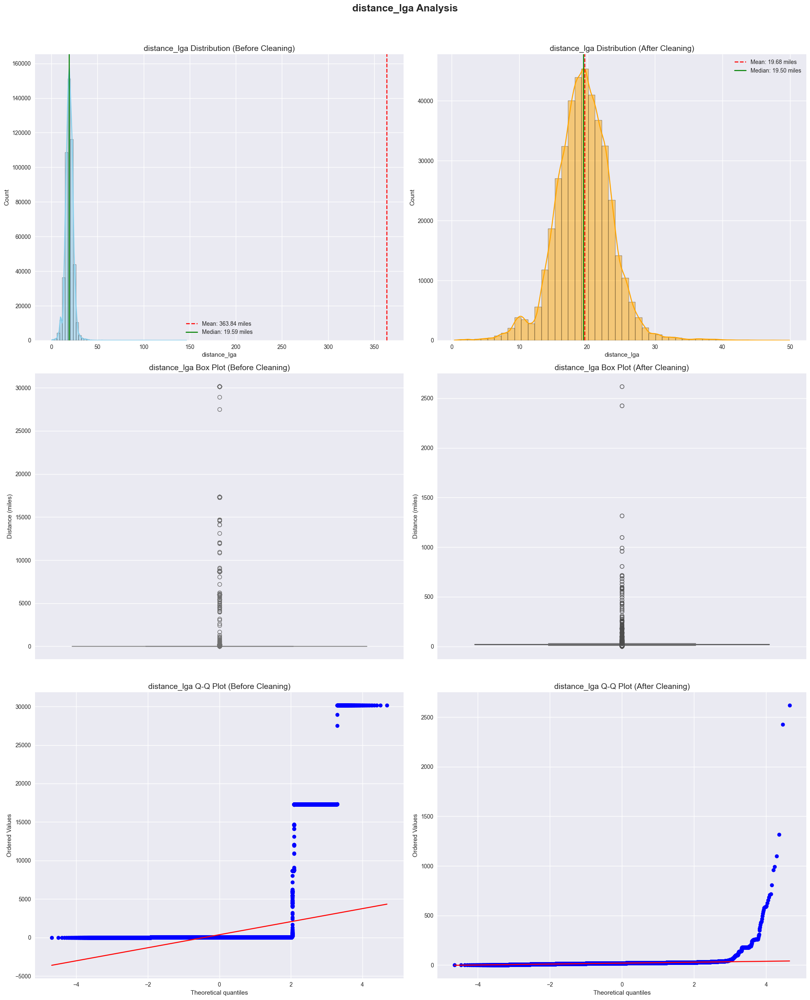

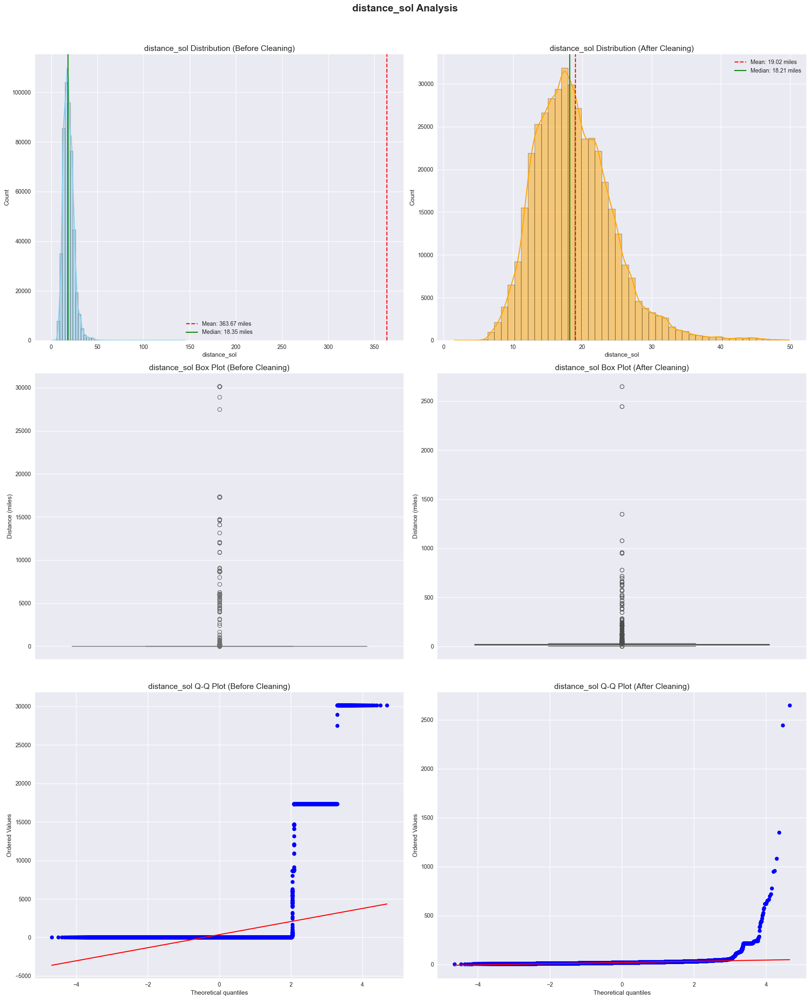

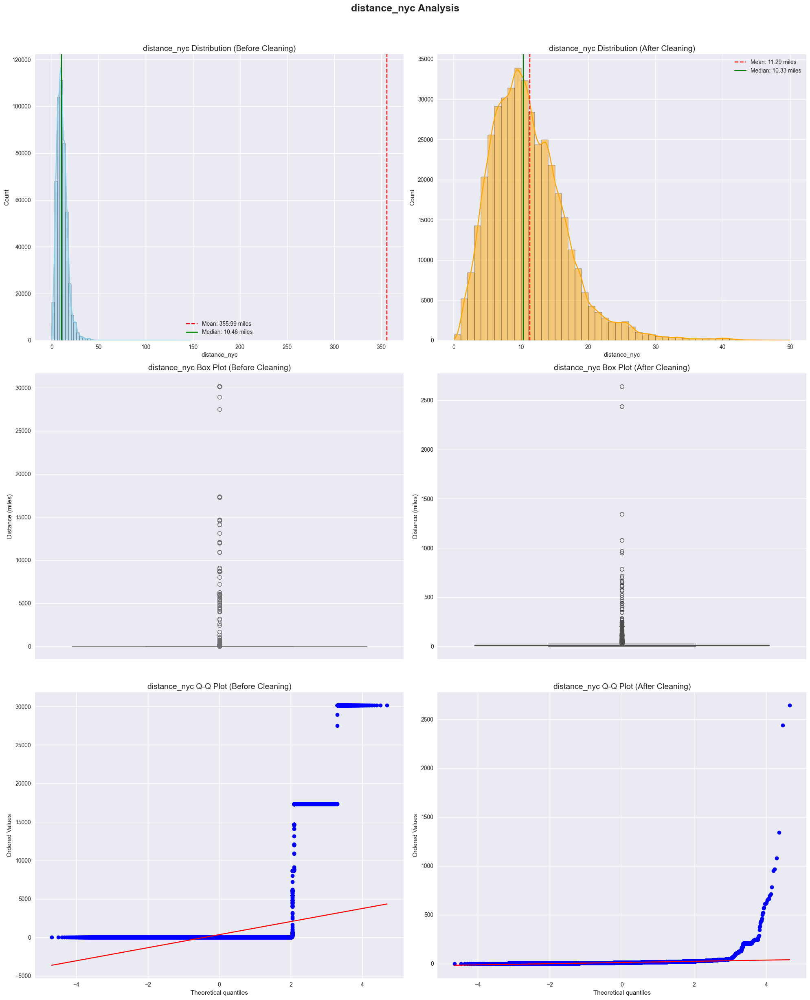


Summary Statistics:

distance_jfk Before Cleaning:
count    499995.000000
mean        385.279367
std        2419.087483
min           1.017646
25%          41.341514
50%          42.523163
75%          43.785649
max       30133.067880
Name: distance_jfk, dtype: float64

distance_jfk After Cleaning:
count    416272.000000
mean         41.976430
std           9.523569
min           1.017646
25%          41.305479
50%          42.478969
75%          43.681721
max        2640.972812
Name: distance_jfk, dtype: float64

distance_ewr Before Cleaning:
count    499995.000000
mean        380.503657
std        2428.804740
min           1.460945
25%          32.173712
50%          34.787507
75%          38.304502
max       30167.595967
Name: distance_ewr, dtype: float64

distance_ewr After Cleaning:
count    416272.000000
mean         35.784622
std          10.141499
min           1.460945
25%          32.121238
50%          34.669232
75%          38.052767
max        2658.006331
Name: distance_e

In [38]:
plt.style.use('seaborn-v0_8')
columns = ['distance_jfk', 'distance_ewr', 'distance_lga', 'distance_sol', 'distance_nyc']

for col in columns:
    # Create a 3x2 subplot layout
    fig, axes = plt.subplots(3, 2, figsize=(20, 24))
    fig.suptitle(f'{col} Analysis', fontsize=18, fontweight='bold', y=1.02)

    # Histogram before cleaning
    sns.histplot(df[df[col] <= 150], x=col, bins=50, kde=True, ax=axes[0, 0], color='skyblue')
    axes[0, 0].set_title(f'{col} Distribution (Before Cleaning)', fontsize=14)
    axes[0, 0].axvline(df[col].mean(), color='red', linestyle='--', label=f'Mean: {df[col].mean():.2f} miles')
    axes[0, 0].axvline(df[col].median(), color='green', linestyle='-', label=f'Median: {df[col].median():.2f} miles')
    axes[0, 0].legend()

    # Histogram after cleaning
    sns.histplot(df_clean[df_clean[col] <= 50], x=col, bins=50, kde=True, ax=axes[0, 1], color='orange')
    axes[0, 1].set_title(f'{col} Distribution (After Cleaning)', fontsize=14)
    axes[0, 1].axvline(df_clean[col].mean(), color='red', linestyle='--', label=f'Mean: {df_clean[col].mean():.2f} miles')
    axes[0, 1].axvline(df_clean[col].median(), color='green', linestyle='-', label=f'Median: {df_clean[col].median():.2f} miles')
    axes[0, 1].legend()

    # Box plot before cleaning
    sns.boxplot(y=df[col], ax=axes[1, 0], color='skyblue')
    axes[1, 0].set_title(f'{col} Box Plot (Before Cleaning)', fontsize=14)
    axes[1, 0].set_ylabel('Distance (miles)')

    # Box plot after cleaning
    sns.boxplot(y=df_clean[col], ax=axes[1, 1], color='orange')
    axes[1, 1].set_title(f'{col} Box Plot (After Cleaning)', fontsize=14)
    axes[1, 1].set_ylabel('Distance (miles)')

    # Q-Q plot before cleaning
    stats.probplot(df[col], dist="norm", plot=axes[2, 0])
    axes[2, 0].set_title(f'{col} Q-Q Plot (Before Cleaning)', fontsize=14)
    axes[2, 0].grid(True)

    # Q-Q plot after cleaning
    stats.probplot(df_clean[col], dist="norm", plot=axes[2, 1])
    axes[2, 1].set_title(f'{col} Q-Q Plot (After Cleaning)', fontsize=14)
    axes[2, 1].grid(True)

    plt.tight_layout()
    plt.show()

# Summary Statistics
print("\nSummary Statistics:")
for col in columns:
    print(f"\n{col} Before Cleaning:")
    print(df[col].describe())
    print(f"\n{col} After Cleaning:")
    print(df_clean[col].describe())

# Rows Removed
removed = len(df) - len(df_clean)
percentage_removed = (removed / len(df)) * 100
print(f"\nRows removed: {removed} ({percentage_removed:.2f}%)")

##### Remove extreme values for the ride distance

Criteria for removal:
- Rides with zero or negative distances
- Distances exceeding reasonable NYC taxi trip limits
- Distances inconsistent with pickup/dropoff coordinates

In [39]:
def drop_out_of_range(df, column_name, min_value=0.1, max_value = 200):
    """
    Drops rows from the df where the values in the specified column are less than min_value or more than max_value.

    Parameters:
    df (pd.DataFrame): The input df.
    column_name (str): The name of the column to check.
    min_value (float): The minimum value threshold.
    max_value (float): The maximum value threshold.

    Returns:
    pd.DataFrame: The df with rows dropped where column values are out of the specified range.
    """
    # Drop rows where the column value is less than min_value or more than max_value
    filtered_df = df[(df[column_name] >= min_value) & (df[column_name] <= max_value)]
    return filtered_df

# Print summary of changes
print("\nSummary of Changes in Dataset:")
print(f"Records before cleaning: {len(df_clean):,}")

# Drop rows where column 'A' values are less than 3 or more than 7
df_clean = drop_out_of_range(df_clean, 'ride_distance')

print(f"Records after cleaning: {len(df_clean):,}")
print(f"Records removed: {len(df_clean) - len(df_clean):,}")


Summary of Changes in Dataset:
Records before cleaning: 416,272
Records after cleaning: 409,249
Records removed: 0


In [40]:
df_clean.describe()

,passengers,request_hour,request_day,request_month,request_weekday,request_year,distance_jfk,distance_ewr,distance_lga,distance_sol,distance_nyc,ride_distance,ride_bearing,fare
count,409249.000000,409249.000000,409249.000000,409249.000000,409249.000000,409249.000000,409249.000000,409249.000000,409249.000000,409249.000000,409249.000000,409249.000000,409249.000000,409249.000000
mean,1.684784,13.509993,15.674900,6.267834,3.041283,2011.741368,41.932115,35.660601,19.590489,18.894884,11.150119,3.408725,0.307376,11.298978
std,1.307642,6.515582,8.678207,3.441146,1.949190,1.864610,7.175659,7.791533,7.198114,8.184657,8.255585,4.064720,1.829734,9.483141
min,0.000000,0.000000,1.000000,1.000000,0.000000,2009.000000,1.017646,2.039860,0.382119,1.950813,0.211811,0.100018,-3.141550,-44.900000
25%,1.000000,9.000000,8.000000,3.000000,1.000000,2010.000000,41.319120,32.121201,17.053709,14.804426,7.068538,1.293882,-0.891412,6.000000
50%,1.000000,14.000000,16.000000,6.000000,3.000000,2012.000000,42.481747,34.654964,19.498528,18.186201,10.305175,2.192970,-0.126323,8.500000
75%,2.000000,19.000000,23.000000,9.000000,5.000000,2013.000000,43.676569,38.016690,22.008393,22.100468,14.130474,3.978320,2.257221,12.500000
max,6.000000,23.000000,31.000000,12.000000,6.000000,2015.000000,2640.972812,2658.006331,2619.751359,2649.728342,2641.976900,174.808107,3.141593,495.000000


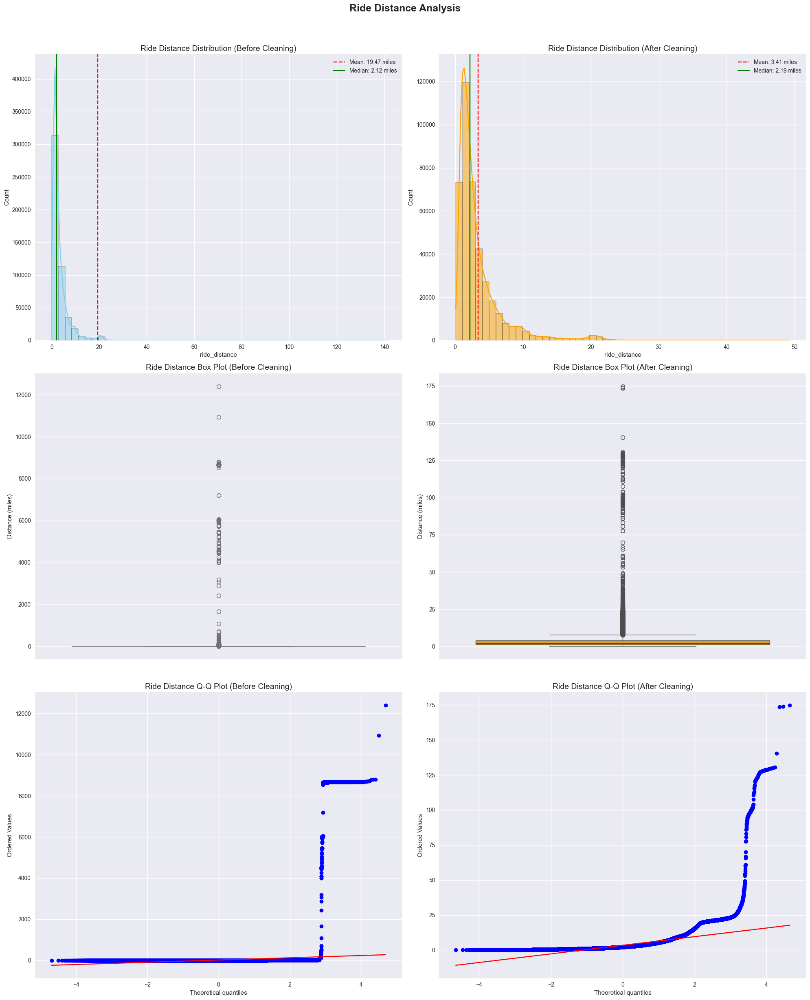


Summary Statistics:

Ride Distance Before Cleaning:
count    499995.000000
mean         19.468775
std         367.299601
min           0.000000
25%           1.214550
50%           2.116970
75%           3.890070
max       12399.956433
Name: ride_distance, dtype: float64

Ride Distance After Cleaning:
count    409249.000000
mean          3.408725
std           4.064720
min           0.100018
25%           1.293882
50%           2.192970
75%           3.978320
max         174.808107
Name: ride_distance, dtype: float64

Rows removed: 90746 (18.15%)


In [41]:
# Create figure with 3x2 subplots
plt.style.use('seaborn-v0_8')
fig, axes = plt.subplots(3, 2, figsize=(20, 24))
fig.suptitle('Ride Distance Analysis', fontsize=18, fontweight='bold', y=1.02)

# Histogram before cleaning
sns.histplot(df[df['ride_distance'] <= 150], x='ride_distance', bins=50, kde=True, 
             ax=axes[0, 0], color='skyblue')
axes[0, 0].set_title('Ride Distance Distribution (Before Cleaning)', fontsize=14)
axes[0, 0].axvline(df['ride_distance'].mean(), color='red', linestyle='--', 
                   label=f'Mean: {df["ride_distance"].mean():.2f} miles')
axes[0, 0].axvline(df['ride_distance'].median(), color='green', linestyle='-', 
                   label=f'Median: {df["ride_distance"].median():.2f} miles')
axes[0, 0].legend()

# Histogram after cleaning
sns.histplot(df_clean[df_clean['ride_distance'] <= 50], x='ride_distance', bins=50, 
             kde=True, ax=axes[0, 1], color='orange')
axes[0, 1].set_title('Ride Distance Distribution (After Cleaning)', fontsize=14)
axes[0, 1].axvline(df_clean['ride_distance'].mean(), color='red', linestyle='--', 
                   label=f'Mean: {df_clean["ride_distance"].mean():.2f} miles')
axes[0, 1].axvline(df_clean['ride_distance'].median(), color='green', linestyle='-', 
                   label=f'Median: {df_clean["ride_distance"].median():.2f} miles')
axes[0, 1].legend()

# Box plot before cleaning
sns.boxplot(y=df['ride_distance'], ax=axes[1, 0], color='skyblue')
axes[1, 0].set_title('Ride Distance Box Plot (Before Cleaning)', fontsize=14)
axes[1, 0].set_ylabel('Distance (miles)')

# Box plot after cleaning
sns.boxplot(y=df_clean['ride_distance'], ax=axes[1, 1], color='orange')
axes[1, 1].set_title('Ride Distance Box Plot (After Cleaning)', fontsize=14)
axes[1, 1].set_ylabel('Distance (miles)')

# Q-Q plot before cleaning
stats.probplot(df['ride_distance'], dist="norm", plot=axes[2, 0])
axes[2, 0].set_title('Ride Distance Q-Q Plot (Before Cleaning)', fontsize=14)
axes[2, 0].grid(True)

# Q-Q plot after cleaning
stats.probplot(df_clean['ride_distance'], dist="norm", plot=axes[2, 1])
axes[2, 1].set_title('Ride Distance Q-Q Plot (After Cleaning)', fontsize=14)
axes[2, 1].grid(True)

plt.tight_layout()
plt.show()

# Print summary statistics
print("\nSummary Statistics:")
print("\nRide Distance Before Cleaning:")
print(df['ride_distance'].describe())
print("\nRide Distance After Cleaning:")
print(df_clean['ride_distance'].describe())

# Print removed rows
removed = len(df) - len(df_clean)
percentage_removed = (removed / len(df)) * 100
print(f"\nRows removed: {removed} ({percentage_removed:.2f}%)")

In [42]:
# List of distance columns to handle
distance_cols = ['distance_jfk', 'distance_ewr', 'distance_lga', 'distance_sol', 'distance_nyc', 'ride_distance']

# Function to fill distance outliers with more sophisticated handling
def fill_distance_outliers(df, distance_cols):
    # Define realistic caps for distances from pickup points to landmarks (in miles)
    # Based on actual geographic distances in the tri-state area
    distance_caps = {
        'distance_jfk': 120,    # Pickups can be from upstate NY, CT, NJ
        'distance_ewr': 150,    # Newark can serve wider NJ area and beyond
        'distance_lga': 150,    # Similar to JFK
        'distance_sol': 150,    # Statue of Liberty/Liberty Island
        'distance_nyc': 150,    # Distance to NYC center from surrounding areas
        'ride_distance': 120    # Long rides can occur between states
    }
    
    # Define minimum reasonable distances
    min_distance = 0
    
    for col in distance_cols:
        # Calculate IQR
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = max(min_distance, Q1 - 1.5 * IQR)  # Don't go below minimum distance
        upper_bound = min(distance_caps.get(col, 150), Q3 + 1.5 * IQR)  # Don't go above cap
        
        # Identify outliers
        outliers = (df[col] < lower_bound) | (df[col] > upper_bound)
        
        # Add meaningful grouping conditions
        group_cols = [
            'request_hour',          # Time of day affects distance patterns
            'request_weekday',       # Day of week
            'request_weekday',         # Seasonal variations
            'distance_category',    # Your existing category
            'weather',              # Weather affects ride patterns
            'traffic',              # Traffic conditions
            'passengers'            # Number of passengers might correlate with distance
        ]
        
        # Only use groups that exist in the dataframe
        valid_group_cols = [col for col in group_cols if col in df.columns]
        
        # Fill outliers with median based on grouping conditions
        if outliers.sum() > 0:
            try:
                median_values = df.groupby(valid_group_cols)[col].transform('median')
                df.loc[outliers, col] = median_values[outliers]
                
                # Handle any remaining NaNs after group median (could happen with rare combinations)
                still_na = outliers & df[col].isna()
                if still_na.sum() > 0:
                    # Try with fewer grouping variables for rare combinations
                    simpler_groups = valid_group_cols[:min(3, len(valid_group_cols))]
                    if simpler_groups:
                        simpler_medians = df.groupby(simpler_groups)[col].transform('median')
                        df.loc[still_na, col] = simpler_medians[still_na]
            except:
                # Fallback if groupby fails
                df.loc[outliers, col] = df[col].median()
        
        # Fill any remaining NaNs with global median
        df[col] = df[col].fillna(df[col].median())
        
        # Apply final cap to ensure no unrealistic values remain
        df[col] = df[col].clip(lower=min_distance, upper=distance_caps.get(col, 150))
        
        # Print summary of changes
        print(f"Fixed {outliers.sum()} outliers in {col}")
    
    return df

# Apply the function
df_clean = fill_distance_outliers(df_clean, distance_cols)

C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_24732\1240876796.py:48: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_values = df.groupby(valid_group_cols)[col].transform('median')


Fixed 41984 outliers in distance_jfk


C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_24732\1240876796.py:48: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_values = df.groupby(valid_group_cols)[col].transform('median')


Fixed 15585 outliers in distance_ewr
Fixed 10481 outliers in distance_lga


C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_24732\1240876796.py:48: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_values = df.groupby(valid_group_cols)[col].transform('median')
C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_24732\1240876796.py:48: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_values = df.groupby(valid_group_cols)[col].transform('median')


Fixed 7007 outliers in distance_sol


C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_24732\1240876796.py:48: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_values = df.groupby(valid_group_cols)[col].transform('median')


Fixed 10361 outliers in distance_nyc


C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_24732\1240876796.py:48: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_values = df.groupby(valid_group_cols)[col].transform('median')


Fixed 34129 outliers in ride_distance


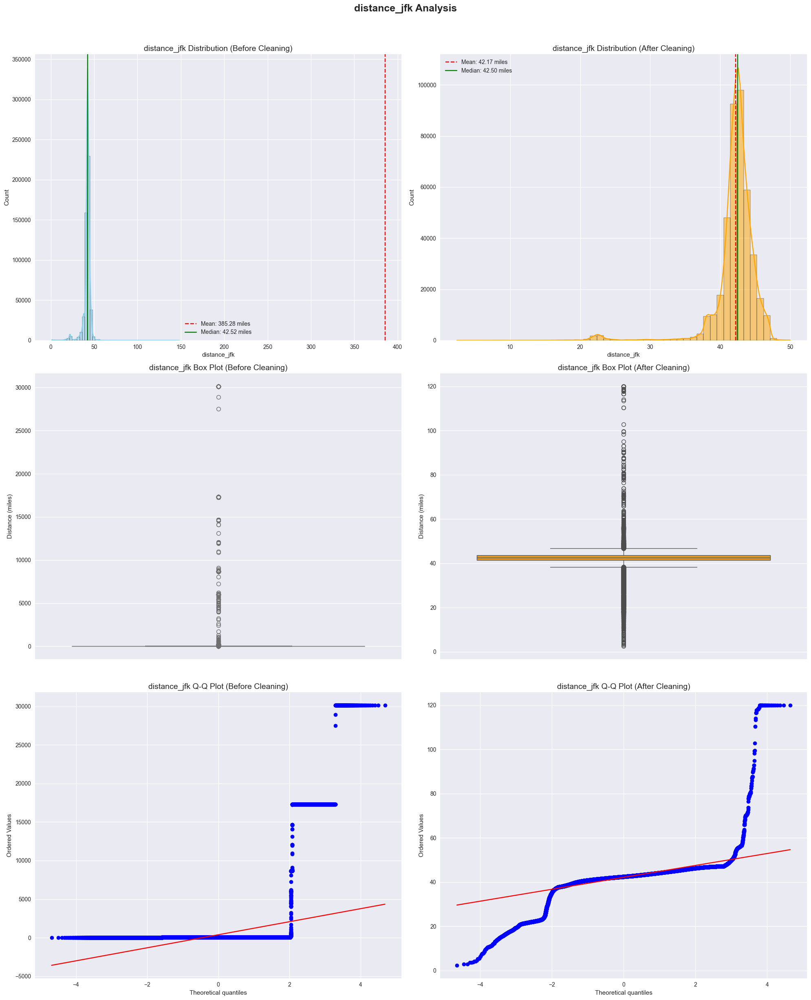

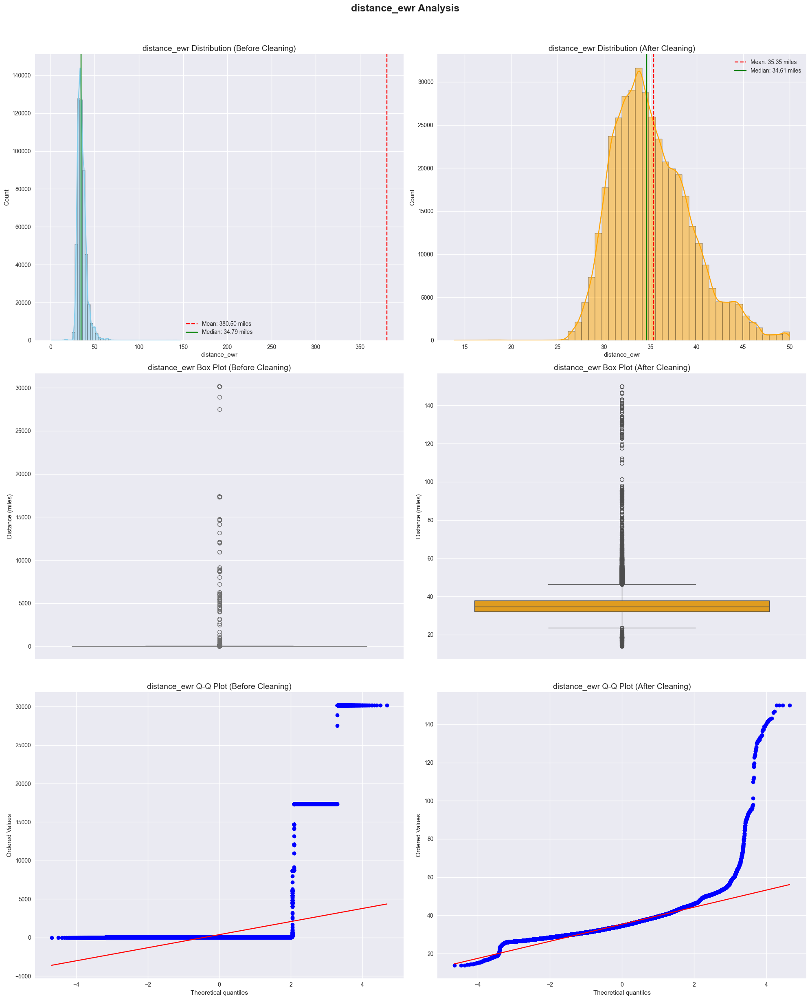

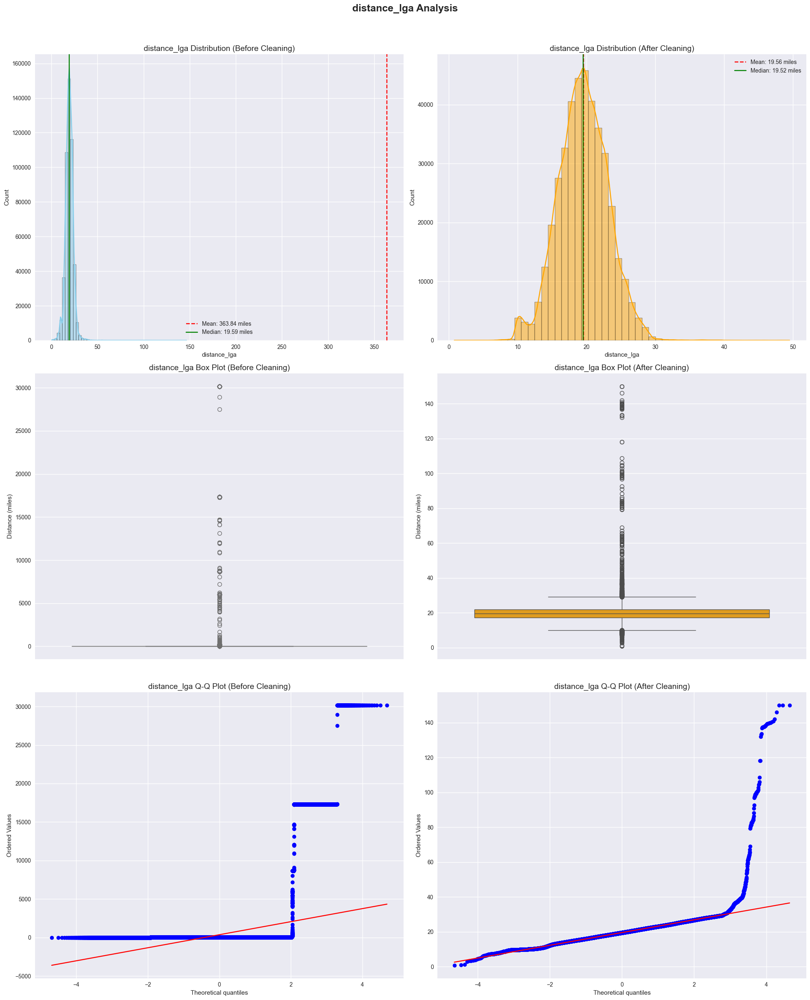

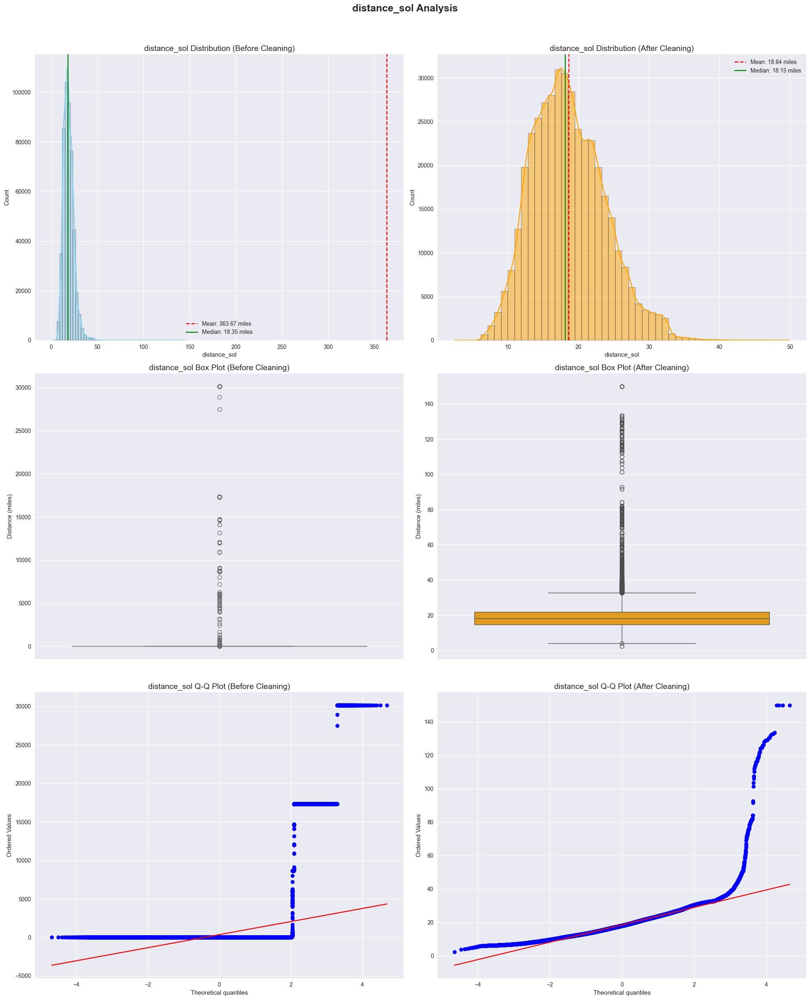

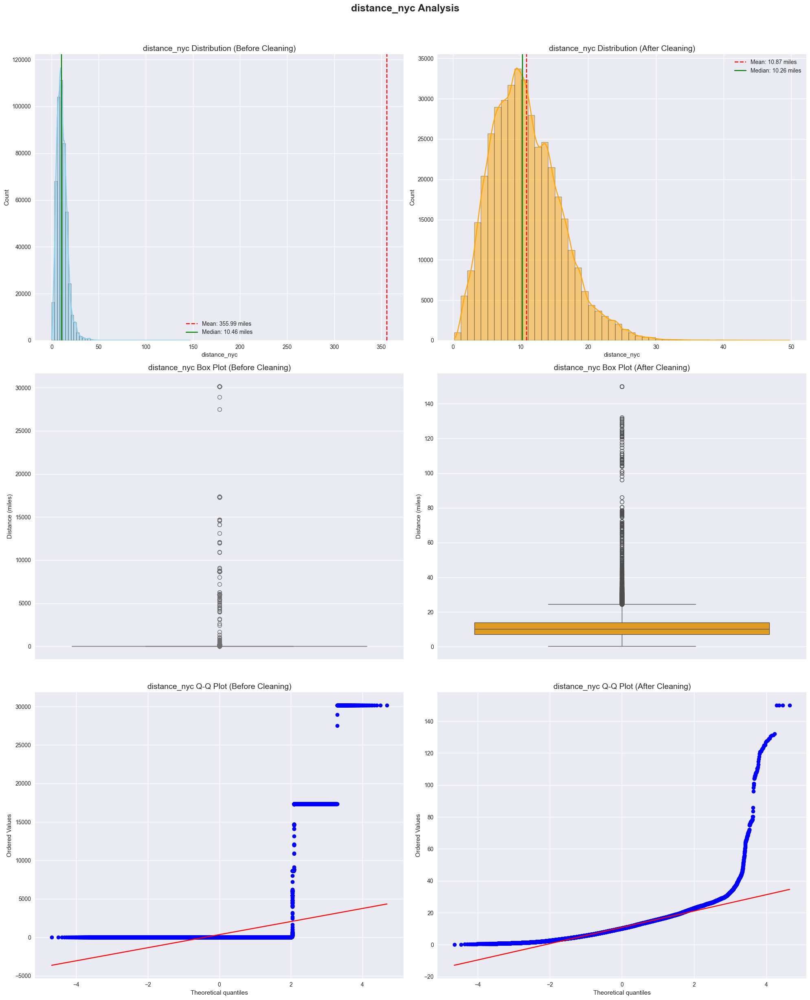

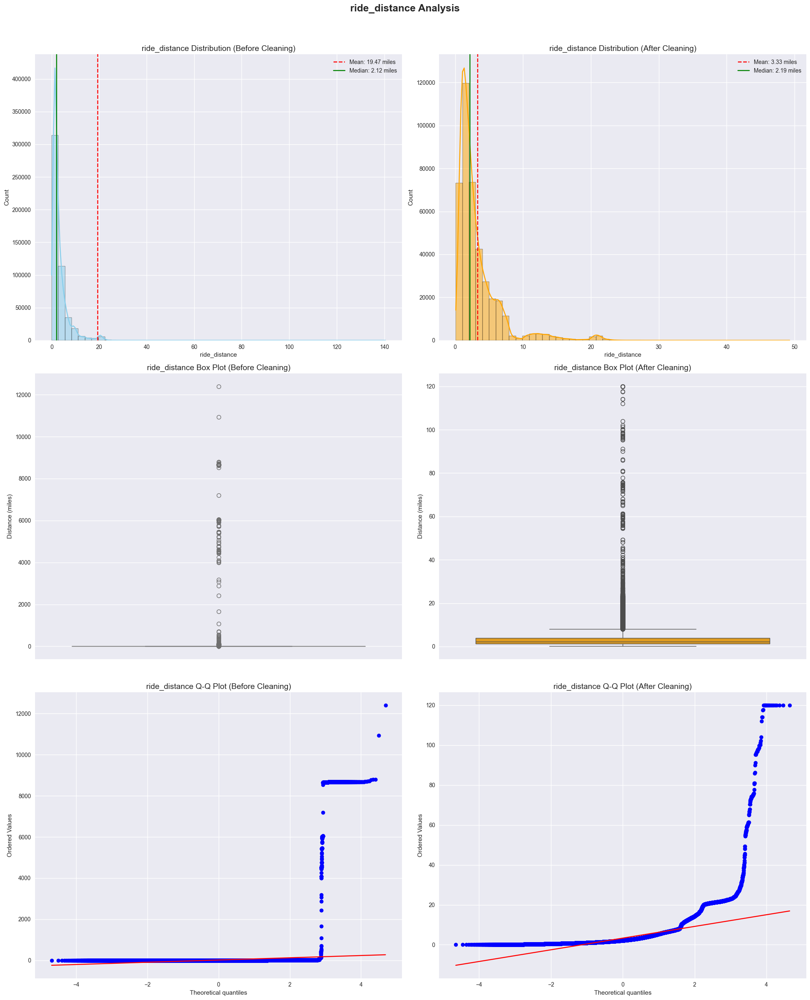


Rows removed: 90746 (18.15%)


In [43]:
plt.style.use('seaborn-v0_8')
columns = ['distance_jfk', 'distance_ewr', 'distance_lga', 'distance_sol', 'distance_nyc', 'ride_distance']

for col in columns:
    # Create a 3x2 subplot layout
    fig, axes = plt.subplots(3, 2, figsize=(20, 24))
    fig.suptitle(f'{col} Analysis', fontsize=18, fontweight='bold', y=1.02)

    # Histogram before cleaning
    sns.histplot(df[df[col] <= 150], x=col, bins=50, kde=True, ax=axes[0, 0], color='skyblue')
    axes[0, 0].set_title(f'{col} Distribution (Before Cleaning)', fontsize=14)
    axes[0, 0].axvline(df[col].mean(), color='red', linestyle='--', label=f'Mean: {df[col].mean():.2f} miles')
    axes[0, 0].axvline(df[col].median(), color='green', linestyle='-', label=f'Median: {df[col].median():.2f} miles')
    axes[0, 0].legend()

    # Histogram after cleaning
    sns.histplot(df_clean[df_clean[col] <= 50], x=col, bins=50, kde=True, ax=axes[0, 1], color='orange')
    axes[0, 1].set_title(f'{col} Distribution (After Cleaning)', fontsize=14)
    axes[0, 1].axvline(df_clean[col].mean(), color='red', linestyle='--', label=f'Mean: {df_clean[col].mean():.2f} miles')
    axes[0, 1].axvline(df_clean[col].median(), color='green', linestyle='-', label=f'Median: {df_clean[col].median():.2f} miles')
    axes[0, 1].legend()

    # Box plot before cleaning
    sns.boxplot(y=df[col], ax=axes[1, 0], color='skyblue')
    axes[1, 0].set_title(f'{col} Box Plot (Before Cleaning)', fontsize=14)
    axes[1, 0].set_ylabel('Distance (miles)')

    # Box plot after cleaning
    sns.boxplot(y=df_clean[col], ax=axes[1, 1], color='orange')
    axes[1, 1].set_title(f'{col} Box Plot (After Cleaning)', fontsize=14)
    axes[1, 1].set_ylabel('Distance (miles)')

    # Q-Q plot before cleaning
    stats.probplot(df[col], dist="norm", plot=axes[2, 0])
    axes[2, 0].set_title(f'{col} Q-Q Plot (Before Cleaning)', fontsize=14)
    axes[2, 0].grid(True)

    # Q-Q plot after cleaning
    stats.probplot(df_clean[col], dist="norm", plot=axes[2, 1])
    axes[2, 1].set_title(f'{col} Q-Q Plot (After Cleaning)', fontsize=14)
    axes[2, 1].grid(True)

    plt.tight_layout()
    plt.show()

# Rows Removed
removed = len(df) - len(df_clean)
percentage_removed = (removed / len(df)) * 100
print(f"\nRows removed: {removed} ({percentage_removed:.2f}%)")

In [44]:
df_clean.describe()

,passengers,request_hour,request_day,request_month,request_weekday,request_year,distance_jfk,distance_ewr,distance_lga,distance_sol,distance_nyc,ride_distance,ride_bearing,fare
count,409249.000000,409249.000000,409249.000000,409249.000000,409249.000000,409249.000000,409249.000000,409249.000000,409249.000000,409249.000000,409249.000000,409249.000000,409249.000000,409249.000000
mean,1.684784,13.509993,15.674900,6.267834,3.041283,2011.741368,42.174892,35.354290,19.562542,18.641110,10.866975,3.328397,0.307376,11.298978
std,1.307642,6.515582,8.678207,3.441146,1.949190,1.864610,3.402656,4.732523,3.827873,5.375405,5.332856,3.740307,1.829734,9.483141
min,0.000000,0.000000,1.000000,1.000000,0.000000,2009.000000,2.410163,13.879314,0.785890,2.380477,0.211811,0.100018,-3.141550,-44.900000
25%,1.000000,9.000000,8.000000,3.000000,1.000000,2010.000000,41.479685,32.128841,17.169760,14.802174,7.065736,1.293882,-0.891412,6.000000
50%,1.000000,14.000000,16.000000,6.000000,3.000000,2012.000000,42.499529,34.613560,19.515928,18.147296,10.262248,2.192970,-0.126323,8.500000
75%,2.000000,19.000000,23.000000,9.000000,5.000000,2013.000000,43.576972,37.869775,21.946056,21.987712,14.008697,3.978320,2.257221,12.500000
max,6.000000,23.000000,31.000000,12.000000,6.000000,2015.000000,120.000000,150.000000,150.000000,150.000000,150.000000,120.000000,3.141593,495.000000


##### Handle Fare outliers

In [45]:
# Function to get distance bin
def get_distance_bin(distance):
    if distance <= 2: return '0-2'
    elif distance <= 5: return '2-5'
    elif distance <= 10: return '5-10'
    elif distance <= 20: return '10-20'
    elif distance <= 40: return '20-40'
    elif distance <= 80: return '40-80'
    else: return '80+'

In [46]:
 # Function to get time of day
def get_time_of_day(hour):
    if hour < 6: return 'night'
    elif hour < 12: return 'morning'
    elif hour < 18: return 'afternoon'
    else: return 'evening'

In [47]:
# Function to check if weekend
def is_weekend(weekday):
    return 1 if weekday in [6, 7] else 0

In [48]:
def improved_fare_outlier_handling(df_clean):
    # Calculate initial outlier boundaries
    Q1 = df_clean['fare'].quantile(0.25)
    Q3 = df_clean['fare'].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Identify outliers
    outlier_mask = (df_clean['fare'] < lower_bound) | (df_clean['fare'] > upper_bound)
    outlier_indices = df_clean[outlier_mask].index
    
    # Create a dictionary to store median fares for each condition group
    group_medians = {}
    
    # Calculate medians for non-outlier trips
    non_outlier_df = df_clean[~outlier_mask]
    
    for row in non_outlier_df.itertuples():
        dist_bin = get_distance_bin(row.ride_distance)
        tod = get_time_of_day(row.request_hour)
        weekend = is_weekend(row.request_weekday)
        
        key = (dist_bin, tod, weekend)
        if key not in group_medians:
            group_medians[key] = {'fares': [], 'distances': []}
        
        group_medians[key]['fares'].append(row.fare)
        group_medians[key]['distances'].append(row.ride_distance)
    
    # Calculate median for each group
    for key in group_medians:
        fares = group_medians[key]['fares']
        distances = group_medians[key]['distances']
        group_medians[key] = {
            'median_fare': np.median(fares),
            'median_distance': np.median(distances)
        }
    
    # Calculate global fare per mile (fallback)
    total_fare = non_outlier_df['fare'].sum()
    total_distance = non_outlier_df['ride_distance'].sum()
    global_fare_per_mile = total_fare / total_distance if total_distance > 0 else 0
    
    # Apply corrections for outliers
    for idx in outlier_indices:
        row = df_clean.loc[idx]
        dist_bin = get_distance_bin(row['ride_distance'])
        tod = get_time_of_day(row['request_hour'])
        weekend = is_weekend(row['request_weekday'])
        
        key = (dist_bin, tod, weekend)
        
        if key in group_medians and group_medians[key]['median_distance'] > 0:
            # Calculate fare per mile for this group
            group_fare_per_mile = group_medians[key]['median_fare'] / group_medians[key]['median_distance']
            # Apply to this trip's distance
            df_clean.loc[idx, 'fare'] = group_fare_per_mile * row['ride_distance']
        else:
            # Fallback to global fare per mile
            df_clean.loc[idx, 'fare'] = global_fare_per_mile * row['ride_distance']
    
    print(f"Handled {len(outlier_indices)} fare outliers using similar trip conditions.")
    return df_clean

# Apply the improved function
df_clean = improved_fare_outlier_handling(df_clean)

Handled 34966 fare outliers using similar trip conditions.


In [49]:
# show the rows for fare above 200
df_clean[df_clean['fare'] > 200]

,user_id,user_name,driver_name,car_condition,weather,traffic,ride_id,pickup_time,passengers,request_hour,...,request_year,distance_jfk,distance_ewr,distance_lga,distance_sol,distance_nyc,ride_distance,ride_bearing,distance_category,fare
321529,2YdAr1Ci,Kristine Jones,Robert Garza,Good,sunny,Congested Traffic,2011-02-27 16:49:45.0000001,2011-02-27 16:49:45,1,16,...,2011,120.000000,112.160073,137.860291,112.797759,112.845140,112.096933,-1.502184,Very Long (>20miles),393.670039
104419,erTnkb6M,Monica Mills,Sharon Hood,Excellent,windy,Dense Traffic,2009-09-20 10:11:36.0000001,2009-09-20 10:11:36,1,10,...,2009,98.295779,146.714757,106.045818,128.968910,122.495682,97.016475,2.537408,Very Long (>20miles),340.709405


In [50]:
# show the rows for fare less than 2.5$ (min fare)
df_clean[df_clean['fare'] < 2.5]

,user_id,user_name,driver_name,car_condition,weather,traffic,ride_id,pickup_time,passengers,request_hour,...,request_year,distance_jfk,distance_ewr,distance_lga,distance_sol,distance_nyc,ride_distance,ride_bearing,distance_category,fare
117238,jgthefwo,Matthew Hernandez,Lori White,Bad,rainy,Congested Traffic,2014-09-23 18:07:19.0000001,2014-09-23 18:07:19,1,18,...,2014,40.183543,34.873344,18.481846,17.140615,8.705866,0.102199,2.138238,Very Short (<2miles),0.492492
2432,El2fH2YN,Cynthia Herrera,Anita Brown,Very Good,sunny,Congested Traffic,2012-11-02 01:08:00.00000070,2012-11-02 01:08:00,1,1,...,2012,42.155648,32.966461,17.418374,15.408286,7.159702,0.257050,-2.131830,Very Short (<2miles),1.153923
198592,MehDtegC,William Navarro,Cindy Cervantes,Good,windy,Congested Traffic,2011-02-09 08:27:00.00000086,2011-02-09 08:27:00,1,8,...,2011,41.217612,30.919975,22.675356,12.714598,4.326235,0.103828,0.778190,Very Short (<2miles),0.514447
418465,eUJGG1Y4,Jordan Cole,Michelle Hill,Excellent,cloudy,Dense Traffic,2012-08-09 06:07:00.00000045,2012-08-09 06:07:00,6,6,...,2012,40.810583,33.791136,19.563882,16.171784,7.791339,0.208680,-2.488057,Very Short (<2miles),1.033966
311006,fYk3LNPn,Ronald Smith,Amanda Taylor,Excellent,rainy,Flow Traffic,2010-09-13 12:13:00.000000166,2010-09-13 12:13:00,1,12,...,2010,41.333914,41.241385,12.831405,24.800325,16.453279,0.477722,1.415589,Very Short (<2miles),2.397765
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
398425,ifwy84DP,David Barrett,Lance White,Bad,cloudy,Flow Traffic,2013-12-18 18:42:00.000000215,2013-12-18 18:42:00,1,18,...,2013,41.744849,31.442315,21.966459,13.785345,5.537686,0.382049,-1.377477,Very Short (<2miles),1.841066
80206,LWKy8ncV,Patrick Bates,Linda Scott,Very Good,sunny,Congested Traffic,2013-05-23 13:37:00.00000086,2013-05-23 13:37:00,2,13,...,2013,41.254335,36.391351,17.008899,19.491299,11.178376,0.420471,1.242260,Very Short (<2miles),2.110416
123770,tRn1Wm3g,Steven Frey,Julia Boyd,Bad,windy,Flow Traffic,2013-10-06 18:53:10.0000004,2013-10-06 18:53:10,1,18,...,2013,45.105328,40.760984,15.213130,25.954255,17.991019,0.385142,1.204954,Very Short (<2miles),1.777090
499970,j3OeEpAx,Christina Moreno,Jeremy Smith,Very Good,windy,Dense Traffic,2011-12-13 17:35:00.00000017,2011-12-13 17:35:00,2,17,...,2011,44.583710,34.293214,19.622987,18.988772,11.288498,0.262638,-2.303559,Very Short (<2miles),1.318226


##### Drop Invalid Data

Dropping data points where:
- Fares are negative or unreasonably high (> $200)

This step ensures data quality by removing:
1. Logically impossible values (negative fares/distances)
2. Extreme outliers that likely represent data entry errors
3. Invalid measurements that could skew analysis

In [51]:
df_clean.drop(df_clean[((df_clean['fare'] > 200) | (df_clean['fare'] < 2.5))].index, inplace=True)

In [52]:
# make log transformation for fare
df_clean['log_fare'] = np.log1p(df_clean['fare'])

In [53]:
# ! for y_test

print(f"NaN values: {y_test.isna().sum()}")
print(f"Negative values: {(y_test < 0).sum()}")

NaN values: 0
Negative values: 1


In [54]:
print(f"X_test shape: {X_test.shape}")
print(f"y_test shape: {y_test.shape}")


X_test shape: (75000, 22)
y_test shape: (75000,)


In [55]:
# ! for the test data
y_test = np.log1p(y_test).rename('log_fare')

c:\InstallationSources\Programs\Miniconda\envs\ML_env\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [56]:
# Check if there are any null values in y_test and get their indices
null_indices = y_test[y_test.isna()].index

# Print information about the nulls
print(f"Number of null values in y_test: {len(null_indices)}")

# Drop the null values from both y_test and X_test
if len(null_indices) > 0:
    X_test = X_test.drop(index=null_indices)
    y_test = y_test.dropna()
    
    print(f"Dropped {len(null_indices)} rows with null values")

# Check for any null values in X_test that might affect modeling
X_test_nulls = X_test.isnull().sum()
print("\nRemaining null values in X_test:")
print(X_test_nulls[X_test_nulls > 0])

# Fill any remaining nulls in X_test with appropriate values
# For example, fill numerical nulls with median values
for col in X_test.columns:
    if X_test[col].isnull().sum() > 0:
        if X_test[col].dtype in ['float64', 'int64']:
            X_test[col] = X_test[col].fillna(X_test[col].median())
        else:
            # For categorical columns, use the mode (most frequent value)
            X_test[col] = X_test[col].fillna(X_test[col].mode()[0])

# Print the final shapes to confirm they match
print(f"\nFinal X_test shape: {X_test.shape}")
print(f"Final y_test shape: {y_test.shape}")

Number of null values in y_test: 1
Dropped 1 rows with null values

Remaining null values in X_test:
distance_category    2118
dtype: int64

Final X_test shape: (74999, 22)
Final y_test shape: (74999,)


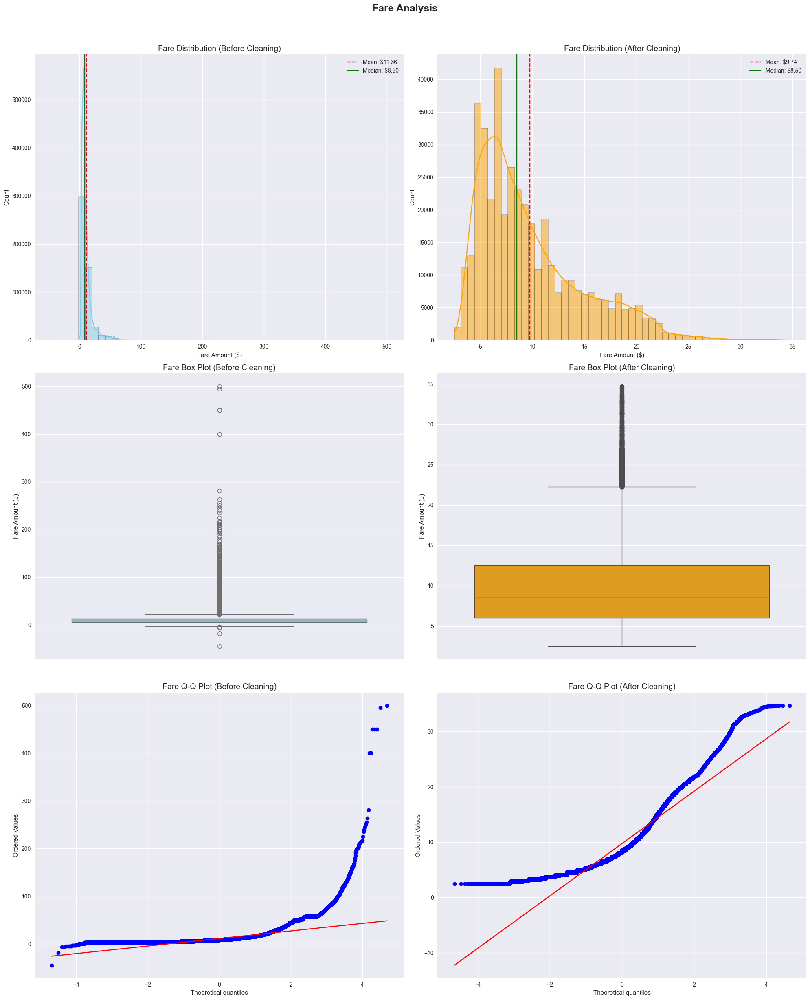


Rows removed: 90928 (18.19%)


In [57]:
plt.style.use('seaborn-v0_8')
# Create a 3x2 subplot layout
fig, axes = plt.subplots(3, 2, figsize=(20, 24))
fig.suptitle('Fare Analysis', fontsize=18, fontweight='bold', y=1.02)

# Histogram before cleaning
sns.histplot(df[df['fare'] <= 500], x='fare', bins=50, kde=True, ax=axes[0, 0], color='skyblue')
axes[0, 0].set_title('Fare Distribution (Before Cleaning)', fontsize=14)
axes[0, 0].axvline(df['fare'].mean(), color='red', linestyle='--', label=f'Mean: ${df["fare"].mean():.2f}')
axes[0, 0].axvline(df['fare'].median(), color='green', linestyle='-', label=f'Median: ${df["fare"].median():.2f}')
axes[0, 0].legend()
axes[0, 0].set_xlabel('Fare Amount ($)')

# Histogram after cleaning
sns.histplot(df_clean[df_clean['fare'] <= 200], x='fare', bins=50, kde=True, ax=axes[0, 1], color='orange')
axes[0, 1].set_title('Fare Distribution (After Cleaning)', fontsize=14)
axes[0, 1].axvline(df_clean['fare'].mean(), color='red', linestyle='--', label=f'Mean: ${df_clean["fare"].mean():.2f}')
axes[0, 1].axvline(df_clean['fare'].median(), color='green', linestyle='-', label=f'Median: ${df_clean["fare"].median():.2f}')
axes[0, 1].legend()
axes[0, 1].set_xlabel('Fare Amount ($)')

# Box plot before cleaning
sns.boxplot(y=df['fare'], ax=axes[1, 0], color='skyblue')
axes[1, 0].set_title('Fare Box Plot (Before Cleaning)', fontsize=14)
axes[1, 0].set_ylabel('Fare Amount ($)')

# Box plot after cleaning
sns.boxplot(y=df_clean['fare'], ax=axes[1, 1], color='orange')
axes[1, 1].set_title('Fare Box Plot (After Cleaning)', fontsize=14)
axes[1, 1].set_ylabel('Fare Amount ($)')

# Q-Q plot before cleaning
stats.probplot(df['fare'], dist="norm", plot=axes[2, 0])
axes[2, 0].set_title('Fare Q-Q Plot (Before Cleaning)', fontsize=14)
axes[2, 0].grid(True)

# Q-Q plot after cleaning
stats.probplot(df_clean['fare'], dist="norm", plot=axes[2, 1])
axes[2, 1].set_title('Fare Q-Q Plot (After Cleaning)', fontsize=14)
axes[2, 1].grid(True)

plt.tight_layout()
plt.show()

# Print removed rows
removed = len(df) - len(df_clean)
percentage_removed = (removed / len(df)) * 100
print(f"\nRows removed: {removed} ({percentage_removed:.2f}%)")


In [58]:
df_clean.columns

Index(['user_id', 'user_name', 'driver_name', 'car_condition', 'weather',
       'traffic', 'ride_id', 'pickup_time', 'passengers', 'request_hour',
       'request_day', 'request_month', 'request_weekday', 'request_year',
       'distance_jfk', 'distance_ewr', 'distance_lga', 'distance_sol',
       'distance_nyc', 'ride_distance', 'ride_bearing', 'distance_category',
       'fare', 'log_fare'],
      dtype='object')

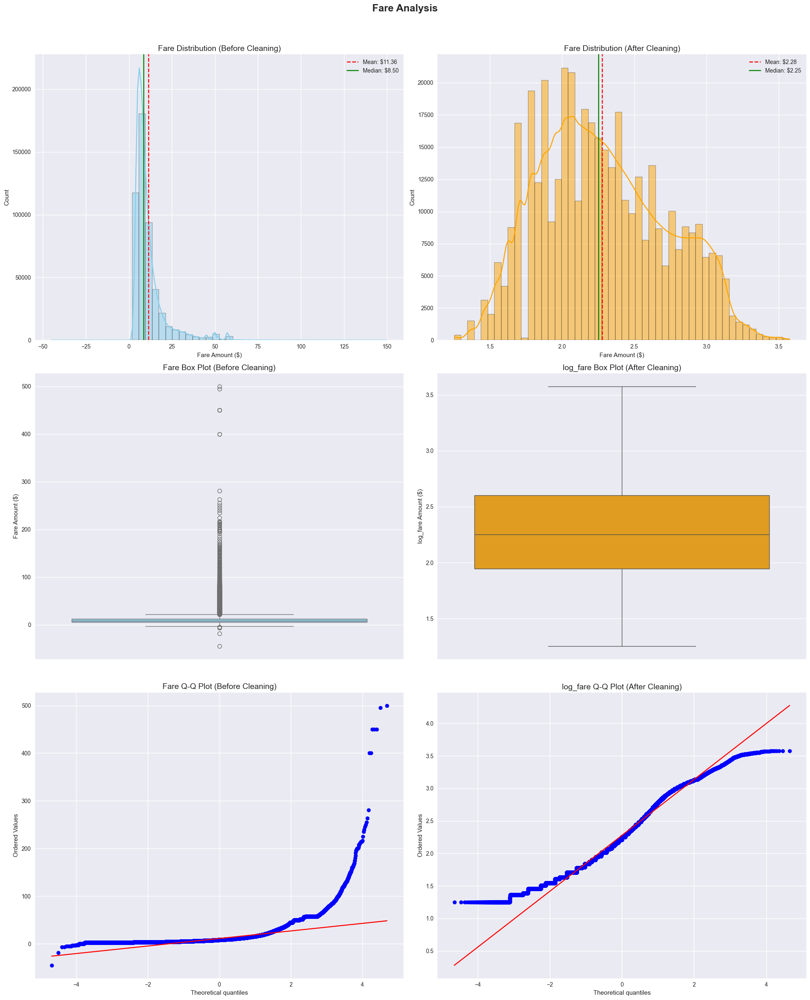


Rows removed: 90928 (18.19%)


In [59]:
plt.style.use('seaborn-v0_8')
# Create a 3x2 subplot layout
fig, axes = plt.subplots(3, 2, figsize=(20, 24))
fig.suptitle('Fare Analysis', fontsize=18, fontweight='bold', y=1.02)

# Histogram before cleaning
sns.histplot(df[df['fare'] <= 150], x='fare', bins=50, kde=True, ax=axes[0, 0], color='skyblue')
axes[0, 0].set_title('Fare Distribution (Before Cleaning)', fontsize=14)
axes[0, 0].axvline(df['fare'].mean(), color='red', linestyle='--', label=f'Mean: ${df["fare"].mean():.2f}')
axes[0, 0].axvline(df['fare'].median(), color='green', linestyle='-', label=f'Median: ${df["fare"].median():.2f}')
axes[0, 0].legend()
axes[0, 0].set_xlabel('Fare Amount ($)')

# Histogram after cleaning
sns.histplot(df_clean[df_clean['log_fare'] <= 50], x='log_fare', bins=50, kde=True, ax=axes[0, 1], color='orange')
axes[0, 1].set_title('Fare Distribution (After Cleaning)', fontsize=14)
axes[0, 1].axvline(df_clean['log_fare'].mean(), color='red', linestyle='--', label=f'Mean: ${df_clean["log_fare"].mean():.2f}')
axes[0, 1].axvline(df_clean['log_fare'].median(), color='green', linestyle='-', label=f'Median: ${df_clean["log_fare"].median():.2f}')
axes[0, 1].legend()
axes[0, 1].set_xlabel('Fare Amount ($)')

# Box plot before cleaning
sns.boxplot(y=df['fare'], ax=axes[1, 0], color='skyblue')
axes[1, 0].set_title('Fare Box Plot (Before Cleaning)', fontsize=14)
axes[1, 0].set_ylabel('Fare Amount ($)')

# Box plot after cleaning
sns.boxplot(y=df_clean['log_fare'], ax=axes[1, 1], color='orange')
axes[1, 1].set_title('log_fare Box Plot (After Cleaning)', fontsize=14)
axes[1, 1].set_ylabel('log_fare Amount ($)')

# Q-Q plot before cleaning
stats.probplot(df['fare'], dist="norm", plot=axes[2, 0])
axes[2, 0].set_title('Fare Q-Q Plot (Before Cleaning)', fontsize=14)
axes[2, 0].grid(True)

# Q-Q plot after cleaning
stats.probplot(df_clean['log_fare'], dist="norm", plot=axes[2, 1])
axes[2, 1].set_title('log_fare Q-Q Plot (After Cleaning)', fontsize=14)
axes[2, 1].grid(True)

plt.tight_layout()
plt.show()

# Print removed rows
removed = len(df) - len(df_clean)
percentage_removed = (removed / len(df)) * 100
print(f"\nRows removed: {removed} ({percentage_removed:.2f}%)")


##### Drop Costing feature 

In [60]:
df_clean.nunique()

user_id              409067
user_name            195528
driver_name          195386
car_condition             4
weather                   5
traffic                   3
ride_id              409067
pickup_time          382503
passengers                7
request_hour             24
request_day              31
request_month            12
request_weekday           7
request_year              7
distance_jfk         382214
distance_ewr         401606
distance_lga         403312
distance_sol         405997
distance_nyc         404555
ride_distance        388041
ride_bearing         409045
distance_category         5
fare                  20296
log_fare              20294
dtype: int64

In [61]:
# Drop Costly Columns user_id and user_name , driver_name , ride_id
df_clean.drop(columns=['user_id', 'user_name', 'driver_name', 'ride_id'], inplace=True)

# ! for X_test
X_test.drop(columns=['user_id', 'user_name', 'driver_name', 'ride_id'], inplace=True)


In [62]:
df_clean.columns

Index(['car_condition', 'weather', 'traffic', 'pickup_time', 'passengers',
       'request_hour', 'request_day', 'request_month', 'request_weekday',
       'request_year', 'distance_jfk', 'distance_ewr', 'distance_lga',
       'distance_sol', 'distance_nyc', 'ride_distance', 'ride_bearing',
       'distance_category', 'fare', 'log_fare'],
      dtype='object')

In [63]:
df_clean.head()

,car_condition,weather,traffic,pickup_time,passengers,request_hour,request_day,request_month,request_weekday,request_year,distance_jfk,distance_ewr,distance_lga,distance_sol,distance_nyc,ride_distance,ride_bearing,distance_category,fare,log_fare
277824,Bad,cloudy,Congested Traffic,2009-10-27 18:31:00,1,18,27,10,1,2009,42.215878,31.407198,22.224380,13.732536,5.745925,4.709353,-0.642199,Short (2-5miles),14.1,2.714695
331985,Bad,rainy,Dense Traffic,2015-01-19 12:55:45,1,12,19,1,0,2015,45.400157,35.440644,19.100641,20.682024,13.059696,1.222237,0.223132,Very Short (<2miles),5.5,1.871802
152744,Very Good,sunny,Congested Traffic,2015-04-21 20:14:36,5,20,21,4,1,2015,43.280201,27.424541,26.316899,9.316600,2.405804,1.580179,2.668377,Very Short (<2miles),6.5,2.014903
260253,Bad,rainy,Dense Traffic,2009-01-17 03:04:00,1,3,17,1,5,2009,39.424124,35.150507,22.223180,15.544722,8.854023,6.096014,-2.540644,Medium (5-10miles),15.3,2.791165
484522,Bad,stormy,Congested Traffic,2013-05-19 12:25:00,1,12,19,5,6,2013,44.196215,38.668537,16.114556,23.445701,15.485430,1.618969,1.288594,Very Short (<2miles),7.0,2.079442


In [64]:
# First, create helper columns
def create_helper_columns(df_clean):
    df_with_helpers = df_clean.copy()
    
    # Convert pickup_time to datetime if not already
    df_with_helpers['pickup_time'] = pd.to_datetime(df_with_helpers['pickup_time'], format='%Y-%m-%d %H:%M:%S')
    
    # Time-related helper columns from pickup_time
    df_with_helpers['pickup_hour'] = df_with_helpers['pickup_time'].dt.hour
    df_with_helpers['pickup_minute'] = df_with_helpers['pickup_time'].dt.minute
    df_with_helpers['pickup_dayofweek'] = df_with_helpers['pickup_time'].dt.dayofweek + 1  # Making it 1-7 instead of 0-6
    df_with_helpers['pickup_month'] = df_with_helpers['pickup_time'].dt.month
    df_with_helpers['pickup_year'] = df_with_helpers['pickup_time'].dt.year
    df_with_helpers['pickup_dayofyear'] = df_with_helpers['pickup_time'].dt.dayofyear
    df_with_helpers['pickup_quarter'] = df_with_helpers['pickup_time'].dt.quarter
    
    # Convert pickup_week to standard int64
    df_with_helpers['pickup_week'] = df_with_helpers['pickup_time'].dt.isocalendar().week.astype('int64')

    
    # Time of day (categorical)
    df_with_helpers['time_of_day'] = pd.cut(
        df_with_helpers['request_hour'], 
        bins=[0, 6, 12, 18, 24], 
        labels=['night', 'morning', 'afternoon', 'evening'],
        include_lowest=True
    )
    
    # Is weekend flag
    df_with_helpers['is_weekend'] = df_with_helpers['request_weekday'].isin([6, 7]).astype(int)
    
    # Is rush hour flag (7-10 AM or 4-7 PM)
    df_with_helpers['is_rush_hour'] = (
        ((df_with_helpers['pickup_hour'] >= 7) & (df_with_helpers['pickup_hour'] <= 10)) |
        ((df_with_helpers['pickup_hour'] >= 16) & (df_with_helpers['pickup_hour'] <= 19))
    ).astype(int)
    
    # Distance bins
    if 'ride_distance' in df_with_helpers.columns:
        df_with_helpers['distance_bin'] = pd.cut(
            df_with_helpers['ride_distance'], 
            bins=[0, 2, 5, 10, 20, 40, 80, 150], 
            labels=['0-2', '2-5', '5-10', '10-20', '20-40', '40-80', '80+'],
            include_lowest=True
        )
        
        # Price per mile
        if 'fare' in df_with_helpers.columns:
            df_with_helpers['price_per_mile'] = df_with_helpers['fare'] / df_with_helpers['ride_distance'].replace(0, 0.1)
    
    # Direction categorical (N, NE, E, SE, S, SW, W, NW)
    if 'ride_bearing' in df_with_helpers.columns:
        directions = ['N', 'NE', 'E', 'SE', 'S', 'SW', 'W', 'NW']
        df_with_helpers['direction'] = pd.cut(
            df_with_helpers['ride_bearing'] % (2 * np.pi), 
            bins=np.linspace(0, 2 * np.pi, 9), 
            labels=directions,
            include_lowest=True
        )
    
    return df_with_helpers

# Apply function to create helper columns
print("Creating helper columns...")
df_clean = create_helper_columns(df_clean)
print("\nNew columns added:")
print(df_clean.columns.difference(df.columns).tolist())

Creating helper columns...

New columns added:
['direction', 'distance_bin', 'is_rush_hour', 'is_weekend', 'log_fare', 'pickup_dayofweek', 'pickup_dayofyear', 'pickup_hour', 'pickup_minute', 'pickup_month', 'pickup_quarter', 'pickup_week', 'pickup_year', 'price_per_mile', 'time_of_day']


In [65]:
# ! for X_test
# First, create helper columns for X_test
def create_helper_columns(X_test , y_test):
    X_test_with_helpers = X_test.copy()
    y_test_with_helpers = y_test.copy()

    # Ensure 'fare' column is present in y_test_with_helpers
    y_test_with_helpers = y_test_with_helpers.rename('fare')
    X_test_with_helpers = pd.concat([X_test_with_helpers, y_test_with_helpers], axis=1)

    # Convert pickup_time to datetime if not already
    X_test_with_helpers['pickup_time'] = pd.to_datetime(X_test_with_helpers['pickup_time'], format='%Y-%m-%d %H:%M:%S')
    
    # Time-related helper columns from pickup_time
    X_test_with_helpers['pickup_hour'] = X_test_with_helpers['pickup_time'].dt.hour
    X_test_with_helpers['pickup_minute'] = X_test_with_helpers['pickup_time'].dt.minute
    X_test_with_helpers['pickup_dayofweek'] = X_test_with_helpers['pickup_time'].dt.dayofweek + 1  # Making it 1-7 instead of 0-6
    X_test_with_helpers['pickup_month'] = X_test_with_helpers['pickup_time'].dt.month
    X_test_with_helpers['pickup_year'] = X_test_with_helpers['pickup_time'].dt.year
    X_test_with_helpers['pickup_dayofyear'] = X_test_with_helpers['pickup_time'].dt.dayofyear
    X_test_with_helpers['pickup_quarter'] = X_test_with_helpers['pickup_time'].dt.quarter
    X_test_with_helpers['pickup_week'] = X_test_with_helpers['pickup_time'].dt.isocalendar().week.astype('int64')
    
    # Time of day (categorical)
    X_test_with_helpers['time_of_day'] = pd.cut(
        X_test_with_helpers['request_hour'], 
        bins=[0, 6, 12, 18, 24], 
        labels=['night', 'morning', 'afternoon', 'evening'],
        include_lowest=True
    )
    
    # Is weekend flag
    X_test_with_helpers['is_weekend'] = X_test_with_helpers['request_weekday'].isin([6, 7]).astype(int)
    
    # Is rush hour flag (7-10 AM or 4-7 PM)
    X_test_with_helpers['is_rush_hour'] = (
        ((X_test_with_helpers['pickup_hour'] >= 7) & (X_test_with_helpers['pickup_hour'] <= 10)) |
        ((X_test_with_helpers['pickup_hour'] >= 16) & (X_test_with_helpers['pickup_hour'] <= 19))
    ).astype(int)
    
    # Distance bins
    if 'ride_distance' in X_test_with_helpers.columns:
        X_test_with_helpers['distance_bin'] = pd.cut(
            X_test_with_helpers['ride_distance'], 
            bins=[0, 2, 5, 10, 20, 40, 80, 150], 
            labels=['0-2', '2-5', '5-10', '10-20', '20-40', '40-80', '80+'],
            include_lowest=True
        )
        
        # Price per mile
        if 'fare' in X_test_with_helpers.columns:
            X_test_with_helpers['price_per_mile'] = X_test_with_helpers['fare'] / X_test_with_helpers['ride_distance'].replace(0, 0.1)
    
    # Direction categorical (N, NE, E, SE, S, SW, W, NW)
    if 'ride_bearing' in X_test_with_helpers.columns:
        directions = ['N', 'NE', 'E', 'SE', 'S', 'SW', 'W', 'NW']
        X_test_with_helpers['direction'] = pd.cut(
            X_test_with_helpers['ride_bearing'] % (2 * np.pi), 
            bins=np.linspace(0, 2 * np.pi, 9), 
            labels=directions,
            include_lowest=True
        )
    
    return X_test_with_helpers

# Apply function to create helper columns for X_test
print("Creating helper columns for X_test...")
helpers_test = create_helper_columns(X_test, y_test)
X_test = helpers_test.drop(columns=['fare'])
print("\nNew columns added:")
print(X_test.columns.difference(df.columns).tolist())

Creating helper columns for X_test...

New columns added:
['direction', 'distance_bin', 'is_rush_hour', 'is_weekend', 'pickup_dayofweek', 'pickup_dayofyear', 'pickup_hour', 'pickup_minute', 'pickup_month', 'pickup_quarter', 'pickup_week', 'pickup_year', 'price_per_mile', 'time_of_day']


---

#### Feature Engineering - Categorical Encoding

##### Types of Encoding

1. **Ordinal Encoding**
    - For categories with clear order
    - Examples: car_condition, traffic, distance_bin
    ```python
    df['car_condition_encoded'] = df['car_condition'].map({
         'Bad': 0, 'Good': 1, 'Very Good': 2, 'Excellent': 3
    })
    ```

2. **One-Hot Encoding**
    - For nominal categories with no inherent order
    - Example: weather
    ```python
    pd.get_dummies(df['weather'], prefix='weather')
    ```

3. **Cyclical Encoding**
    - For features with circular relationships 
    - Examples: time_of_day, direction, request_weekday
    ```python
    # Convert to sin/cos components to preserve circular nature
    df['time_sin'] = np.sin(2 * np.pi * time_value / period)
    df['time_cos'] = np.cos(2 * np.pi * time_value / period)
    ```

##### Implementation Summary
- car_condition: Ordinal (Bad→Excellent)
- weather: One-hot (each type affects rides differently)
- traffic: Ordinal (Flow→Dense→Congested)
- distance_bin: Ordinal (shortest→longest) 
- time_of_day: Cyclical (morning→afternoon→evening→night→morning)
- direction: Cyclical (compass directions are circular)
- request_weekday: Cyclical (weekly pattern)

*Note: Always use .astype(float) before mathematical operations on encoded categories*

In [66]:
# Get unique values for each categorical column
categorical_cols = df_clean.select_dtypes(include=['object', 'category']).columns

# Print the unique values in a readable format
for col in categorical_cols:
    unique_vals = df_clean[col].unique()
    
    print(f"\nUnique {col} values ({len(unique_vals)} total):")
    
    # If there aren't too many values, print them all
    if len(unique_vals) <= 15:
        if isinstance(unique_vals[0], str):
            print(", ".join(sorted(unique_vals)))
        else:
            print(", ".join(sorted(str(val) for val in unique_vals)))
    else:
        print(f"Too many values to display ({len(unique_vals)} unique values)")


Unique car_condition values (4 total):
Bad, Excellent, Good, Very Good

Unique weather values (5 total):
cloudy, rainy, stormy, sunny, windy

Unique traffic values (3 total):
Congested Traffic, Dense Traffic, Flow Traffic

Unique distance_category values (5 total):
Long (10-20miles), Medium (5-10miles), Short (2-5miles), Very Long (>20miles), Very Short (<2miles)

Unique time_of_day values (4 total):
afternoon, evening, morning, night

Unique distance_bin values (7 total):
0-2, 10-20, 2-5, 20-40, 40-80, 5-10, 80+

Unique direction values (8 total):
E, N, NE, NW, S, SE, SW, W


#### Direction Cyclic Encoding Explained

##### The Problem
When encoding compass directions (N, NE, E, SE, S, SW, W, NW), standard encoding methods create artificial discontinuities:

* Ordinal encoding (N=0, NE=1, E=2, etc.) suggests N and NW are far apart
* In reality, they're adjacent directions on a compass
* The circular nature of directions needs to be preserved

##### The Solution: Cyclic Encoding
We convert each direction to two components using sine and cosine:

1. First convert direction to angle:
    * N = 0°
    * NE = 45°
    * E = 90°
    * SE = 135°
    * S = 180°
    * SW = 225°
    * W = 270°
    * NW = 315°

2. Then transform to coordinates:
    * direction_sin = sin(angle)
    * direction_cos = cos(angle)

##### Why It Works

* Similar directions have similar encoded values
* N (0°) and NW (315°) are now show in the feature space
* Values wrap smoothly around the circle
* Each direction becomes a point on the unit circle
* Preserves the cyclic relationship between directions

##### Example Values
```python
N:  (sin=0.00,  cos=1.00)
NE: (sin=0.71,  cos=0.71)
E:  (sin=1.00,  cos=0.00)
SE: (sin=0.71,  cos=-0.71)
S:  (sin=0.00,  cos=-1.00)
SW: (sin=-0.71, cos=-0.71)
W:  (sin=-1.00, cos=0.00)
NW: (sin=-0.71, cos=0.71)
```

This encoding preserves the circular relationship between directions and is essential for machine learning models to correctly interpret directional features.


In [67]:
# Create copies of original columns before encoding
df_encoded = df_clean.copy()

In [68]:
# 1. car_condition - Ordinal encoding
car_condition_order = ['Bad', 'Good', 'Very Good', 'Excellent']
df_encoded['car_condition_encoded'] = df_encoded['car_condition'].map(
    {val: idx for idx, val in enumerate(car_condition_order)}
).astype(float)  # Convert to numeric explicitly

# ! for X_test 
# 1. car_condition - Ordinal encoding
car_condition_order = ['Bad', 'Good', 'Very Good', 'Excellent']
X_test['car_condition_encoded'] = X_test['car_condition'].map(
    {val: idx for idx, val in enumerate(car_condition_order)}
).astype(float)  # Convert to numeric explicitly

# 2. weather - One-hot encoding
weather_dummies = pd.get_dummies(df_encoded['weather'], prefix='weather', drop_first=True).astype(int)
df_encoded = pd.concat([df_encoded, weather_dummies], axis=1)

# ! for X_test
# 2. weather - One-hot encoding
weather_dummies = pd.get_dummies(X_test['weather'], prefix='weather', drop_first=True)
X_test = pd.concat([X_test, weather_dummies], axis=1)

# 3. traffic - Ordinal encoding
traffic_order = ['Flow Traffic', 'Dense Traffic', 'Congested Traffic']
df_encoded['traffic_encoded'] = df_encoded['traffic'].map(
    {val: idx for idx, val in enumerate(traffic_order)}
).astype(float)  # Convert to numeric explicitly

# ! for X_test
# 3. traffic - Ordinal encoding
traffic_order = ['Flow Traffic', 'Dense Traffic', 'Congested Traffic']
X_test['traffic_encoded'] = X_test['traffic'].map(
    {val: idx for idx, val in enumerate(traffic_order)}
).astype(float)  # Convert to numeric explicitly

# 4. distance_bin - Ordinal encoding
# Encoding dictionary
distance_bin_order = ['0-2', '2-5', '5-10', '10-20', '20-40', '40-80', '80+']
distance_bin_dict = {val: idx for idx, val in enumerate(distance_bin_order)}

# Encoding Train Data
df_encoded['distance_bin_encoded'] = df_encoded['distance_bin'].apply(lambda x: distance_bin_dict.get(x, np.nan)).astype(float)

# ! for X_test
# Encoding Test Data (Prevent NaNs by replacing unseen values with the median)
X_test['distance_bin_encoded'] = X_test['distance_bin'].apply(lambda x: distance_bin_dict.get(x, np.nan)).astype(float)

# Replace any remaining NaNs (just in case)
median_value = df_encoded['distance_bin_encoded'].median()
df_encoded['distance_bin_encoded'].fillna(median_value, inplace=True)
X_test['distance_bin_encoded'].fillna(median_value, inplace=True)

# 5. time_of_day - Cyclical encoding
time_mapping = {'morning': 0, 'afternoon': 1, 'evening': 2, 'night': 3}
# Convert to numeric type explicitly before math operations
df_encoded['time_of_day_encoded'] = df_encoded['time_of_day'].map(time_mapping).astype(float)

# ! for X_test
# 5. time_of_day - Cyclical encoding
time_mapping = {'morning': 0, 'afternoon': 1, 'evening': 2, 'night': 3}
# Convert to numeric type explicitly before math operations
X_test['time_of_day_encoded'] = X_test['time_of_day'].map(time_mapping).astype(float)

# Now apply trigonometric transformations
df_encoded['time_of_day_sin'] = np.sin(2 * np.pi * df_encoded['time_of_day_encoded'] / 4)
df_encoded['time_of_day_cos'] = np.cos(2 * np.pi * df_encoded['time_of_day_encoded'] / 4)

# ! for X_test
# Now apply trigonometric transformations
X_test['time_of_day_sin'] = np.sin(2 * np.pi * X_test['time_of_day_encoded'] / 4)
X_test['time_of_day_cos'] = np.cos(2 * np.pi * X_test['time_of_day_encoded'] / 4)

# 6. direction - Cyclical encoding
direction_to_angle = {'N': 0, 'NE': 45, 'E': 90, 'SE': 135, 'S': 180, 'SW': 225, 'W': 270, 'NW': 315}
df_encoded['direction_angle'] = df_encoded['direction'].map(direction_to_angle).astype(float)
df_encoded['direction_sin'] = np.sin(np.radians(df_encoded['direction_angle']))
df_encoded['direction_cos'] = np.cos(np.radians(df_encoded['direction_angle']))

# ! for X_test
# 6. direction - Cyclical encoding
direction_to_angle = {'N': 0, 'NE': 45, 'E': 90, 'SE': 135, 'S': 180, 'SW': 225, 'W': 270, 'NW': 315}
X_test['direction_angle'] = X_test['direction'].map(direction_to_angle).astype(float)
X_test['direction_sin'] = np.sin(np.radians(X_test['direction_angle']))
X_test['direction_cos'] = np.cos(np.radians(X_test['direction_angle']))

# 7. Weekday - Cyclical encoding
# The request_weekday column exists as seen from the error trace
df_encoded['weekday_sin'] = np.sin(2 * np.pi * df_encoded['request_weekday'].astype(float) / 7)
df_encoded['weekday_cos'] = np.cos(2 * np.pi * df_encoded['request_weekday'].astype(float) / 7)

# ! for X_test
# 7. Weekday - Cyclical encoding
# The request_weekday column exists as seen from the error trace
X_test['weekday_sin'] = np.sin(2 * np.pi * X_test['request_weekday'].astype(float) / 7)
X_test['weekday_cos'] = np.cos(2 * np.pi * X_test['request_weekday'].astype(float) / 7)

# 8. Create weekend flag
df_encoded['is_weekend'] = df_encoded['request_weekday'].isin([5, 6]).astype(int)

# ! for X_test
# 8. Create weekend flag
X_test['is_weekend'] = X_test['request_weekday'].isin([5, 6]).astype(int)


C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_24732\3856545198.py:50: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_encoded['distance_bin_encoded'].fillna(median_value, inplace=True)
C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_24732\3856545198.py:51: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values alw

---

#### Drop Costing features 

In [69]:
columns_to_drop = [
    # Categorical columns after encoding
    'car_condition', 'weather', 'traffic', 
    'distance_bin', 'time_of_day', 'direction',
        
    # Original columns replaced by encoded versions
    'request_weekday',

    # datetime columns
    'pickup_time', 'distance_category'
]

# Drop the specified columns
df_encoded = df_encoded.drop(columns=columns_to_drop + ['fare'])

# ! For X_test
# Drop the specified columns
X_test = X_test.drop(columns=columns_to_drop)

### Features Selection 

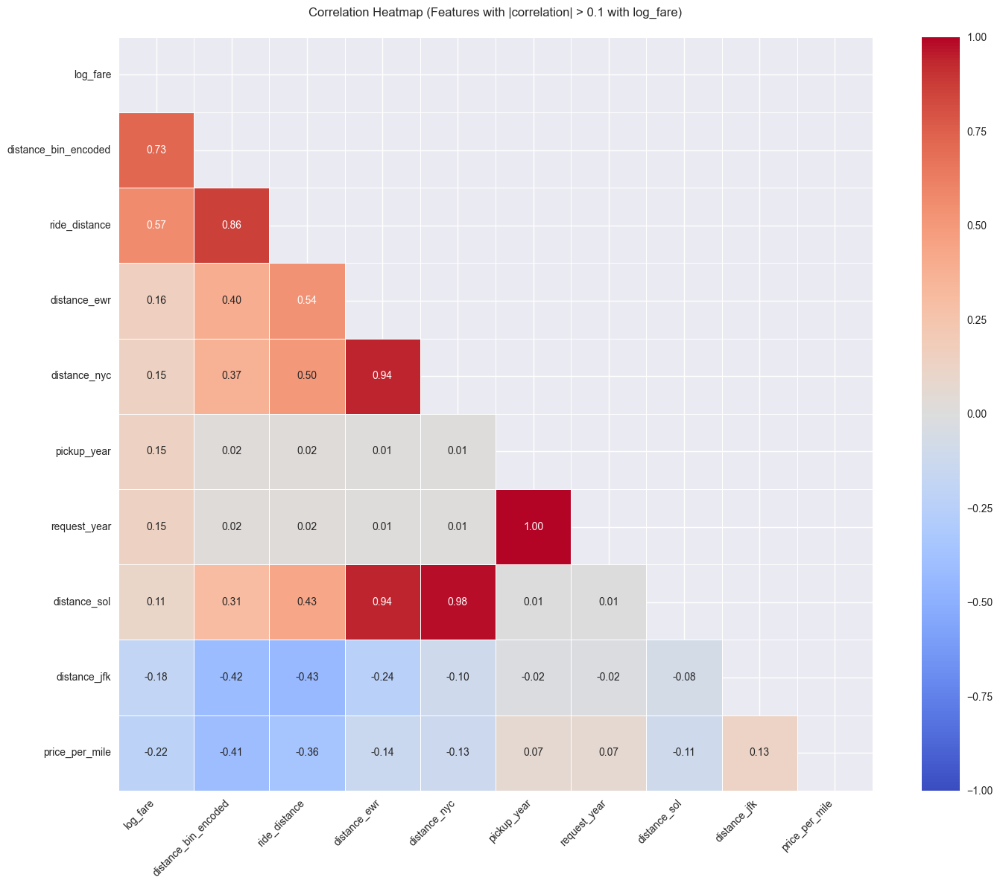


Top correlations with log_fare:
log_fare                1.000000
distance_bin_encoded    0.725514
ride_distance           0.566762
distance_ewr            0.158164
distance_nyc            0.147496
pickup_year             0.146262
request_year            0.146262
distance_sol            0.107695
distance_jfk           -0.182993
price_per_mile         -0.222341
Name: log_fare, dtype: float64


In [70]:
# Create correlation matrix
corr_matrix = df_encoded.corr()

# Get correlations with log_fare
log_fare_corr = corr_matrix['log_fare'].sort_values(ascending=False)

# Select features with absolute correlation > 0.1 with log_fare
important_features = log_fare_corr[abs(log_fare_corr) > 0.1].index

# Create correlation matrix with only important features
important_corr = corr_matrix.loc[important_features, important_features]

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(important_corr))

# Create the heatmap with better formatting
plt.figure(figsize=(15, 12))
sns.heatmap(important_corr, 
            mask=mask,
            annot=True,
            fmt='.2f',
            cmap='coolwarm',
            center=0,
            vmin=-1, 
            vmax=1,
            square=True,
            linewidths=0.5)

plt.title('Correlation Heatmap (Features with |correlation| > 0.1 with log_fare)', 
          pad=20)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Print top correlations with log_fare
print("\nTop correlations with log_fare:")
print(log_fare_corr[abs(log_fare_corr) > 0.1])

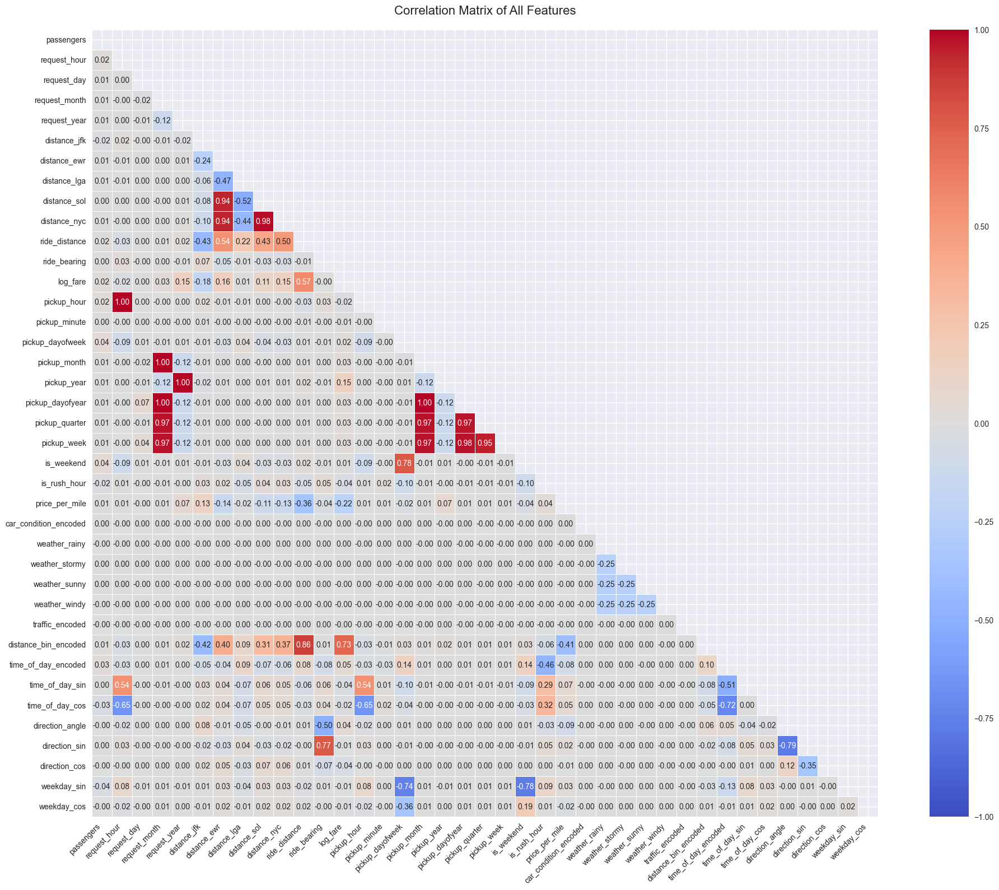


Strong Correlations (|correlation| > 0.5):
request_hour vs time_of_day_sin: 0.538
request_hour vs time_of_day_cos: -0.650
distance_ewr vs distance_sol: 0.945
distance_ewr vs distance_nyc: 0.940
distance_ewr vs ride_distance: 0.536
distance_lga vs distance_sol: -0.523
distance_nyc vs distance_sol: 0.979
distance_nyc vs ride_distance: 0.503
log_fare vs ride_distance: 0.567
pickup_hour vs request_hour: 1.000
pickup_hour vs time_of_day_sin: 0.538
pickup_hour vs time_of_day_cos: -0.650
pickup_dayofweek vs weekday_sin: -0.744
pickup_month vs request_month: 1.000
pickup_month vs pickup_quarter: 0.971
pickup_month vs pickup_week: 0.975
pickup_year vs request_year: 1.000
pickup_dayofyear vs request_month: 0.997
pickup_dayofyear vs pickup_month: 0.997
pickup_dayofyear vs pickup_quarter: 0.968
pickup_dayofyear vs pickup_week: 0.976
pickup_quarter vs request_month: 0.971
pickup_quarter vs pickup_week: 0.950
pickup_week vs request_month: 0.975
is_weekend vs pickup_dayofweek: 0.780
is_weekend vs we

In [71]:
# Create correlation matrix for all numeric columns
plt.figure(figsize=(20, 16))

# Calculate correlations
corr_matrix = df_encoded.corr()

# Create mask for upper triangle
mask = np.triu(np.ones_like(corr_matrix))

# Create heatmap with better formatting
sns.heatmap(corr_matrix, 
            mask=mask,
            annot=True, 
            fmt='.2f',
            cmap='coolwarm',
            center=0,
            vmin=-1, 
            vmax=1,
            square=True,
            linewidths=0.5)

plt.title('Correlation Matrix of All Features', pad=20, fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Print strongest correlations (absolute value > 0.5)
print("\nStrong Correlations (|correlation| > 0.5):")
for col1 in corr_matrix.columns:
    for col2 in corr_matrix.columns:
        if col1 < col2:  # Only print each pair once
            corr = corr_matrix.loc[col1, col2]
            if abs(corr) > 0.5:
                print(f"{col1} vs {col2}: {corr:.3f}")

In [72]:
# Vif calculation
# Calculate VIF for each feature
def calculate_vif(df, features):
    vif_data = pd.DataFrame()
    vif_data["Feature"] = features
    vif_data["VIF"] = [variance_inflation_factor(df[features].values, i) 
                       for i in range(len(features))]
    return vif_data.sort_values("VIF", ascending=False)

# Get features excluding the target variable
features = [col for col in df_encoded.columns if col != 'log_fare']

# Calculate VIF scores
vif_scores = calculate_vif(df_encoded[features], features)

# Print VIF scores in a formatted table
print("\nVariance Inflation Factors (VIF):")
print("-" * 50)
print(vif_scores.to_string(index=False))
print("\nInterpretation:")
print("VIF > 10: High multicollinearity")
print("5 < VIF < 10: Moderate multicollinearity")
print("VIF < 5: Low multicollinearity")

# Identify features with high multicollinearity
high_vif = vif_scores[vif_scores["VIF"] > 10]["Feature"].tolist()
if high_vif:
    print("\nFeatures with high multicollinearity:")
    print(", ".join(high_vif))

c:\InstallationSources\Programs\Miniconda\envs\ML_env\Lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)
c:\InstallationSources\Programs\Miniconda\envs\ML_env\Lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)
c:\InstallationSources\Programs\Miniconda\envs\ML_env\Lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)
c:\InstallationSources\Programs\Miniconda\envs\ML_env\Lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)



Variance Inflation Factors (VIF):
--------------------------------------------------
              Feature          VIF
         request_year          inf
          pickup_hour          inf
         pickup_month          inf
          pickup_year          inf
        request_month 1.797772e+11
         request_hour 9.469473e+08
     pickup_dayofyear 7.490929e+04
         distance_ewr 8.881148e+02
          request_day 5.777558e+02
         distance_sol 5.201759e+02
         distance_jfk 2.483261e+02
         distance_nyc 1.682961e+02
       pickup_quarter 1.010915e+02
          pickup_week 8.461466e+01
         distance_lga 8.074410e+01
  time_of_day_encoded 5.217894e+01
     pickup_dayofweek 4.388759e+01
      time_of_day_cos 3.092011e+01
        ride_distance 1.682983e+01
      direction_angle 1.438988e+01
           is_weekend 1.080313e+01
 distance_bin_encoded 9.718936e+00
        direction_sin 7.596446e+00
        pickup_minute 3.913510e+00
         ride_bearing 3.340808e+00
    

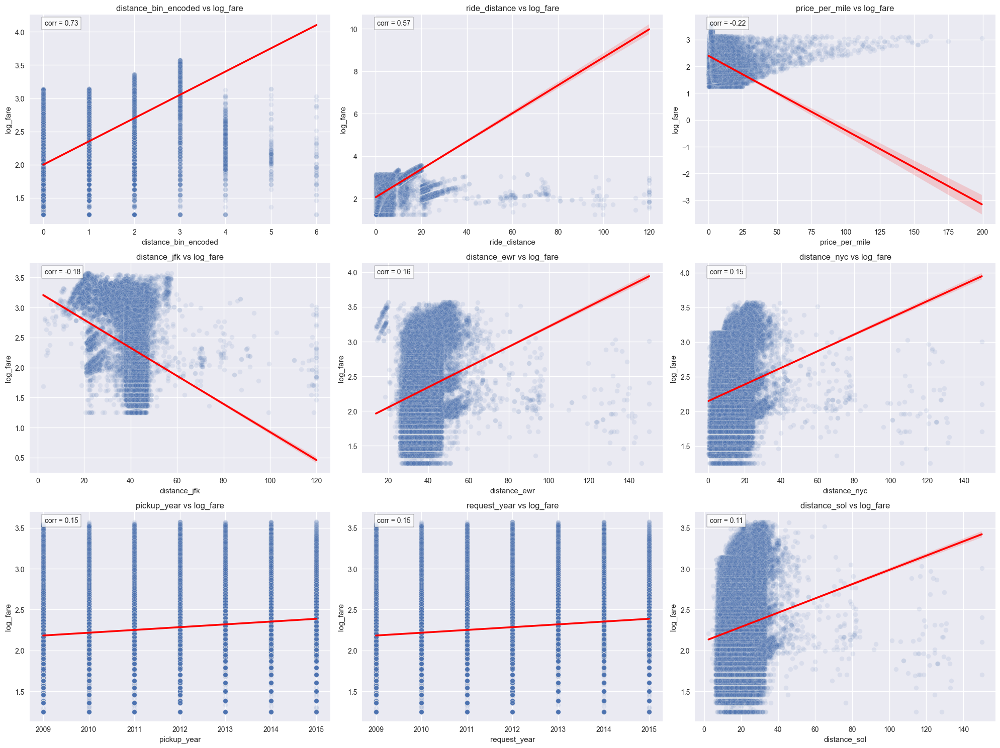


Feature Correlations with log_fare:
distance_bin_encoded: 0.726
ride_distance: 0.567
price_per_mile: -0.222
distance_jfk: -0.183
distance_ewr: 0.158
distance_nyc: 0.147
pickup_year: 0.146
request_year: 0.146
distance_sol: 0.108


In [73]:
# Select important features based on correlation with log_fare
corr_matrix = df_encoded.corr()
log_fare_corr = abs(corr_matrix['log_fare']).sort_values(ascending=False)
important_features = log_fare_corr[log_fare_corr > 0.1].index.tolist()

# Remove log_fare from features list if we want to plot only predictors
if 'log_fare' in important_features:
    important_features.remove('log_fare')

# Create multiple subplots for groups of features
n_features = len(important_features)
n_cols = 3
n_rows = (n_features + n_cols - 1) // n_cols

plt.style.use('seaborn-v0_8')
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5*n_rows))
axes = axes.ravel()

# Plot each feature against log_fare
for idx, feature in enumerate(important_features):
    if idx < len(axes):
        sns.scatterplot(data=df_encoded, 
                       x=feature, 
                       y='log_fare',
                       alpha=0.1,
                       ax=axes[idx])
        axes[idx].set_title(f'{feature} vs log_fare')
        
        # Add trend line
        sns.regplot(data=df_encoded,
                   x=feature,
                   y='log_fare',
                   scatter=False,
                   color='red',
                   ax=axes[idx])
        
        # Calculate and display correlation
        corr = df_encoded[feature].corr(df_encoded['log_fare'])
        axes[idx].text(0.05, 0.95, f'corr = {corr:.2f}', 
                      transform=axes[idx].transAxes,
                      bbox=dict(facecolor='white', alpha=0.8))

# Remove empty subplots if any
for idx in range(len(important_features), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

# Print correlations
print("\nFeature Correlations with log_fare:")
for feature in important_features:
    corr = df_encoded[feature].corr(df_encoded['log_fare'])
    print(f"{feature}: {corr:.3f}")

In [74]:
df_encoded.shape

(409067, 39)

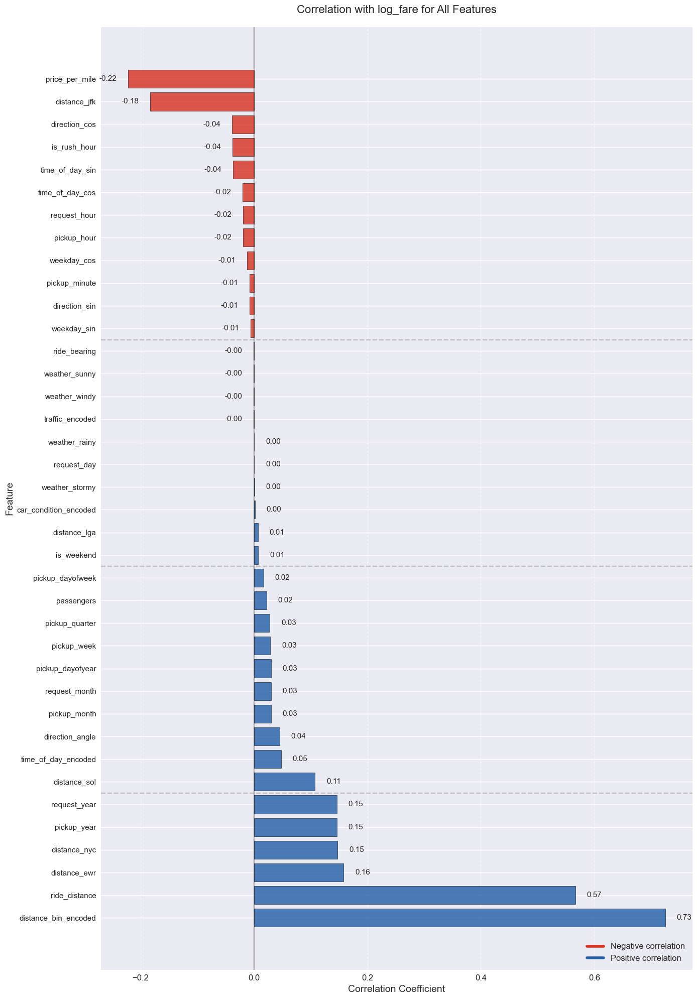

In [75]:
# Extract correlation values with log_fare
corr_with_log_fare = df_encoded.corr()['log_fare'].sort_values(ascending=False).drop('log_fare')

# Create a figure with horizontal orientation to fit all features
plt.figure(figsize=(14, 20))

# Create color map based on correlation value (positive=blue, negative=red)
colors = ['#d7301f' if c < 0 else '#225ea8' for c in corr_with_log_fare]

# Create horizontal bar chart with improved styling
bars = plt.barh(corr_with_log_fare.index, corr_with_log_fare, color=colors, alpha=0.8, 
    edgecolor='black', linewidth=0.5)

# Add vertical grid lines
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Add title and labels with better formatting
plt.title('Correlation with log_fare for All Features', fontsize=16, pad=20)
plt.xlabel('Correlation Coefficient', fontsize=14)
plt.ylabel('Feature', fontsize=14)

# Add value labels beside each bar
for bar in bars:
    width = bar.get_width()
    plt.text(width + 0.02 * (1 if width > 0 else -1), 
          bar.get_y() + bar.get_height()/2,
          f'{width:.2f}',
          ha='left' if width > 0 else 'right', va='center', 
          fontsize=11)

# Improve y-axis readability
plt.yticks(fontsize=11)
plt.xticks(fontsize=12)

# Add a vertical line at x=0
plt.axvline(x=0, color='black', linestyle='-', alpha=0.3)

# Add a legend explaining the colors
custom_lines = [plt.Line2D([0], [0], color='#d7301f', lw=4),
                plt.Line2D([0], [0], color='#225ea8', lw=4)]
plt.legend(custom_lines, ['Negative correlation', 'Positive correlation'], 
        loc='lower right', fontsize=12)

# Group features that are highly correlated with clear separators
plt.axhline(y=5.5, color='gray', linestyle='--', alpha=0.4)
plt.axhline(y=15.5, color='gray', linestyle='--', alpha=0.4)
plt.axhline(y=25.5, color='gray', linestyle='--', alpha=0.4)

# Adjust layout to make room for labels
plt.tight_layout()

plt.show()

C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_24732\4126363885.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=normal_vif, y='Feature', x='VIF', ax=ax1, palette='Blues_d', orient='h')
C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_24732\4126363885.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=high_vif, y='Feature', x='VIF', ax=ax2, palette='Reds_d', orient='h')


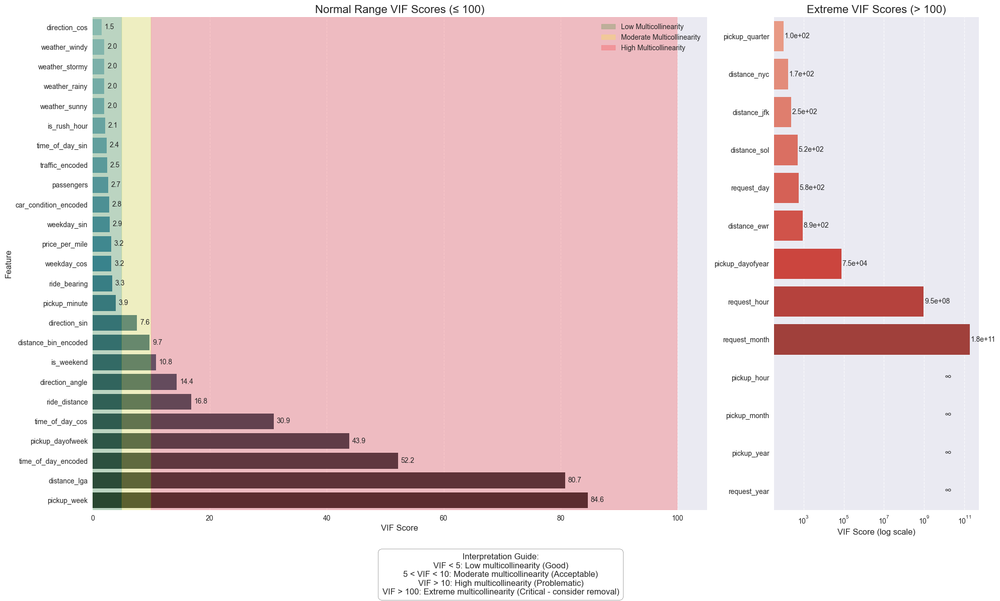

In [76]:
# Create a copy of VIF data and sort by VIF value
vif_data = vif_scores.copy()

# Create two separate dataframes: one for regular VIF scores, one for extremely high VIF scores
high_vif = vif_data[vif_data['VIF'] > 100].sort_values('VIF')
normal_vif = vif_data[vif_data['VIF'] <= 100].sort_values('VIF')

# Create figure with two subplots - one for normal VIF, one for high VIF
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 12), gridspec_kw={'width_ratios': [3, 1]})

# Plot normal VIF values
sns.barplot(data=normal_vif, y='Feature', x='VIF', ax=ax1, palette='Blues_d', orient='h')
ax1.set_title('Normal Range VIF Scores (≤ 100)', fontsize=16)
ax1.set_xlabel('VIF Score', fontsize=12)
ax1.set_ylabel('Feature', fontsize=12)

# Add colored background to indicate VIF levels
ax1.axvspan(0, 5, alpha=0.2, color='green', label='Low Multicollinearity')
ax1.axvspan(5, 10, alpha=0.2, color='yellow', label='Moderate Multicollinearity')
ax1.axvspan(10, 100, alpha=0.2, color='red', label='High Multicollinearity')
ax1.legend(loc='upper right')

# Add value annotations to normal VIF bars
for i, v in enumerate(normal_vif['VIF']):
    if v > 0.1:  # Only label bars with meaningful values
        ax1.text(v + 0.5, i, f"{v:.1f}", va='center', fontsize=10)

# Plot high VIF values on log scale
if not high_vif.empty:
    sns.barplot(data=high_vif, y='Feature', x='VIF', ax=ax2, palette='Reds_d', orient='h')
    ax2.set_title('Extreme VIF Scores (> 100)', fontsize=16)
    ax2.set_xlabel('VIF Score (log scale)', fontsize=12)
    ax2.set_ylabel('')  # No need for duplicate y-axis label
    ax2.set_xscale('log')  # Log scale for extremely high values
    
    # Add value annotations to high VIF bars
    for i, v in enumerate(high_vif['VIF']):
        if not np.isinf(v):
            ax2.text(v * 1.1, i, f"{v:.1e}", va='center', fontsize=10)
        else:
            ax2.text(1e10, i, "∞", va='center', fontsize=14)

# Add grid lines
ax1.grid(axis='x', linestyle='--', alpha=0.7)
ax2.grid(axis='x', linestyle='--', alpha=0.7)

# Add guidance text
fig.text(0.5, 0.01, 
         "Interpretation Guide:\n"
         "VIF < 5: Low multicollinearity (Good)\n"
         "5 < VIF < 10: Moderate multicollinearity (Acceptable)\n"
         "VIF > 10: High multicollinearity (Problematic)\n"
         "VIF > 100: Extreme multicollinearity (Critical - consider removal)",
         ha='center', fontsize=12, bbox=dict(facecolor='white', alpha=0.8, boxstyle='round,pad=0.5'))

plt.tight_layout()
plt.subplots_adjust(bottom=0.15)
plt.show()

# Check point

In [77]:
temp_df = df_encoded.copy()
temp_x_test = X_test.copy()
temp_y_test = y_test.copy()

---

In [78]:
df_encoded = temp_df.copy()

In [79]:
# Define VIF function
def calculate_vif(X):
    vif = pd.DataFrame()
    vif['Feature'] = X.columns
    vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return vif.sort_values(by='VIF', ascending=False)

# Correlation threshold
corr_threshold = 0.11
vif_threshold = 10
extreme_vif_threshold = 100

# Calculate VIF for all features
vif_df = calculate_vif(df_encoded.drop(columns=['log_fare']))

# Correlation with target
corr_with_log_fare = df_encoded.corr()['log_fare'].sort_values(ascending=False).drop('log_fare')
correlation = pd.DataFrame(corr_with_log_fare).reset_index()
correlation.columns = ['Feature', 'Correlation']

# Merge VIF and Correlation
vif_corr = pd.merge(vif_df, correlation, on='Feature', how='left')

# Filtering Criteria
# Drop Extreme VIF Features
drop_extreme_vif = vif_corr[vif_corr['VIF'] > extreme_vif_threshold]['Feature'].tolist()
# Drop High VIF Features with Low Correlation
drop_high_vif_low_corr = vif_corr[(vif_corr['VIF'] > vif_threshold) & (vif_corr['Correlation'].abs() < corr_threshold)]['Feature'].tolist()

# Combine All Drop Features
drop_features = list(set(drop_extreme_vif + drop_high_vif_low_corr))

# Drop Features Automatically
df_encoded_filtered = df_encoded.drop(columns=drop_features)

print(f"Dropped Features: {drop_features}")
print(f"Remaining Features: {df_encoded_filtered.shape[1]}")


c:\InstallationSources\Programs\Miniconda\envs\ML_env\Lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


Dropped Features: ['pickup_month', 'request_year', 'distance_sol', 'distance_ewr', 'is_weekend', 'distance_lga', 'time_of_day_cos', 'distance_nyc', 'direction_angle', 'request_hour', 'request_day', 'time_of_day_encoded', 'pickup_dayofweek', 'pickup_dayofyear', 'distance_jfk', 'request_month', 'pickup_year', 'pickup_week', 'pickup_quarter', 'pickup_hour']
Remaining Features: 19


In [80]:
# # Show columns to be dropped 
# drop_features = [
#     # high VIF features
#     'request_year', 'request_month',
#     'request_hour','request_day', 'distance_ewr', 'distance_sol', 'distance_lga', 'pickup_quarter', 'pickup_month', 'pickup_dayofyear', 'pickup_year', 'pickup_week'
#     'distance_jfk', 'distance_nyc',
# ]

# # drop 
# df_encoded.drop(columns=drop_features, inplace=True )

C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_24732\3604449128.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=vif_data, y='Feature', x='VIF', ax=ax,


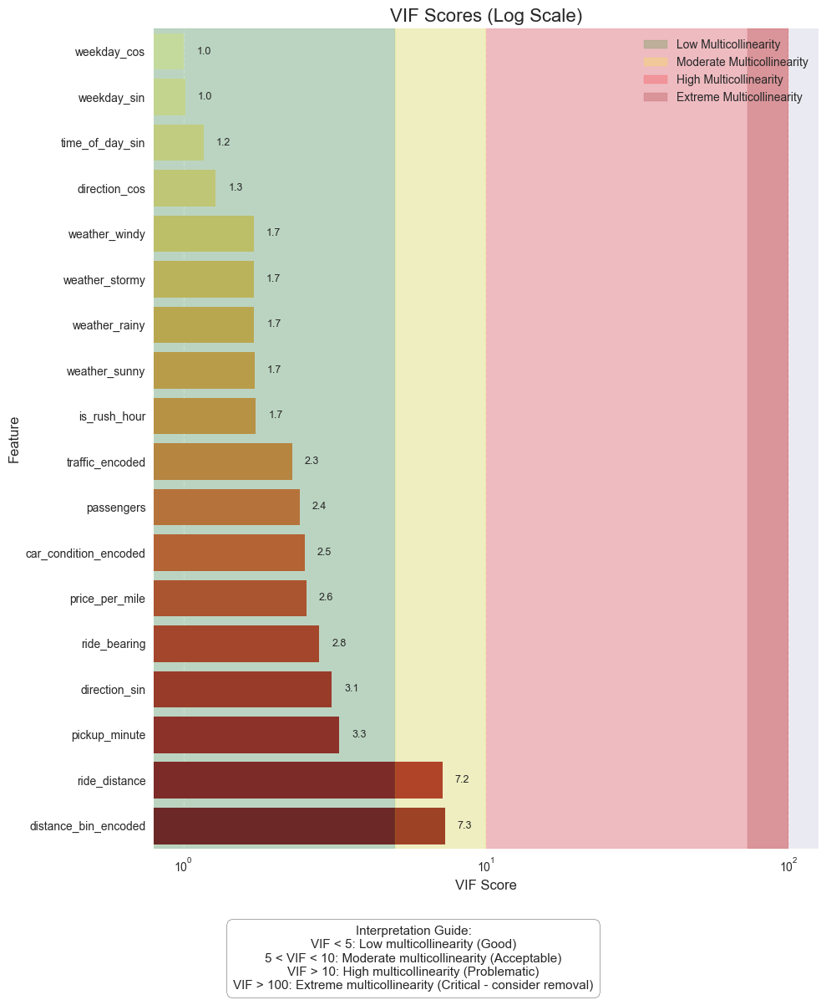

In [81]:
# Calculate VIF for each feature after dropping high VIF columns
def calculate_vif(df, features):
    vif_data = pd.DataFrame()
    vif_data["Feature"] = features
    vif_data["VIF"] = [variance_inflation_factor(df[features].values, i) 
                       for i in range(len(features))]
    return vif_data.sort_values("VIF", ascending=False)

# Get features excluding the target variable
features = [col for col in df_encoded_filtered.columns if col != 'log_fare']

# Calculate VIF scores
vif_scores_updated = calculate_vif(df_encoded_filtered[features], features)

# Create a copy of VIF data and sort by VIF value
vif_data = vif_scores_updated.copy()

# Create two separate dataframes: one for regular VIF scores, one for extremely high VIF scores
high_vif = vif_data[vif_data['VIF'] > 100].sort_values('VIF')
normal_vif = vif_data[vif_data['VIF'] <= 100].sort_values('VIF')

# Create a single plot with better size for 24 features
fig, ax = plt.subplots(figsize=(10, 12))

# Plot all VIF values with a logarithmic scale
sns.barplot(data=vif_data, y='Feature', x='VIF', ax=ax, 
            palette='YlOrRd', orient='h', order=vif_data.sort_values('VIF').Feature)

# Set logarithmic scale to better visualize both small and large VIFs
ax.set_xscale('log')
ax.set_title('VIF Scores (Log Scale)', fontsize=16)
ax.set_xlabel('VIF Score', fontsize=12)
ax.set_ylabel('Feature', fontsize=12)

# Add colored background to indicate VIF levels
ax.axvspan(0, 5, alpha=0.2, color='green', label='Low Multicollinearity')
ax.axvspan(5, 10, alpha=0.2, color='yellow', label='Moderate Multicollinearity')
ax.axvspan(10, 100, alpha=0.2, color='red', label='High Multicollinearity')
ax.axvspan(100, vif_data['VIF'].max()*10, alpha=0.2, color='darkred', label='Extreme Multicollinearity')
ax.legend(loc='upper right')

# Add grid lines
ax.grid(axis='x', linestyle='--', alpha=0.7)

# Add value annotations
for i, v in enumerate(vif_data.sort_values('VIF')['VIF']):
    if v > 0.1:  # Only label bars with meaningful values
        if v < 100:
            ax.text(v * 1.1, i, f"{v:.1f}", va='center', fontsize=9)
        else:
            ax.text(v * 1.1, i, f"{v:.1e}", va='center', fontsize=9)
            
# Add guidance text
fig.text(0.5, 0.01, 
         "Interpretation Guide:\n"
         "VIF < 5: Low multicollinearity (Good)\n"
         "5 < VIF < 10: Moderate multicollinearity (Acceptable)\n"
         "VIF > 10: High multicollinearity (Problematic)\n"
         "VIF > 100: Extreme multicollinearity (Critical - consider removal)",
         ha='center', fontsize=11, bbox=dict(facecolor='white', alpha=0.8, boxstyle='round,pad=0.5'))

plt.tight_layout()
plt.subplots_adjust(bottom=0.15)
plt.show()


In [82]:
# Define features and target
X_train = df_encoded.drop(columns=['log_fare'])  # Drop original fare columns
y_train = df_encoded['log_fare']  # Use log-transformed fare as target

In [83]:
temp_df_reduced = df_encoded.copy()

In [84]:
# from sklearn.preprocessing import RobustScaler

# # Apply Robust Scaler
# scaler = RobustScaler()
# X_train_scaled = scaler.fit_transform(X_train)
# X_test_scaled = scaler.transform(X_test)  # Use previously defined X_test

# # Convert back to DataFrame
# X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
# X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

In [85]:
# # Print the nulls in the training set
# print("Nulls in the training set:")
# print(X_train_scaled.isna().sum().sum())

# # Print the nulls in the test set
# print("\nNulls in the test set:")
# print(X_test_scaled.isna().sum().sum())

In [86]:
# # Convert to DataFrame
# X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
# X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

# # Reset Index
# X_train_scaled, y_train = X_train_scaled.reset_index(drop=True), y_train.reset_index(drop=True)
# X_test_scaled, y_test = X_test_scaled.reset_index(drop=True), y_test.reset_index(drop=True)

# # Drop NaNs from Train Set
# nan_rows_train = X_train_scaled.isna().any(axis=1)
# X_train_scaled = X_train_scaled[~nan_rows_train]
# y_train = y_train[~nan_rows_train]

# # Drop NaNs from Test Set
# nan_rows_test = X_test_scaled.isna().any(axis=1)
# X_test_scaled = X_test_scaled[~nan_rows_test]
# y_test = y_test[~nan_rows_test]

# # Final Check
# print("X_train Shape:", X_train_scaled.shape)
# print("y_train Shape:", y_train.shape)
# print("X_test Shape:", X_test_scaled.shape)
# print("y_test Shape:", y_test.shape)


In [87]:
# from sklearn.decomposition import PCA

# # Apply PCA to keep 95% variance
# pca = PCA(n_components=0.95, random_state=42)
# X_train_pca = pca.fit_transform(X_train_scaled)
# X_test_pca = pca.transform(X_test_scaled)

# print(f"Reduced from {X_train_scaled.shape[1]} to {X_train_pca.shape[1]} features with PCA")

# # Convert back to DataFrame
# X_train_pca = pd.DataFrame(X_train_pca)
# X_test_pca = pd.DataFrame(X_test_pca)

In [88]:
# # Convert to DataFrame
# X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
# X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

# # Reset Index
# X_train_scaled, y_train = X_train_scaled.reset_index(drop=True), y_train.reset_index(drop=True)
# X_test_scaled, y_test = X_test_scaled.reset_index(drop=True), y_test.reset_index(drop=True)

# # Drop NaNs from Train Set
# nan_rows_train = X_train_scaled.isna().any(axis=1)
# X_train_scaled = X_train_scaled[~nan_rows_train]
# y_train = y_train[~nan_rows_train]

# # Drop NaNs from Test Set
# nan_rows_test = X_test_scaled.isna().any(axis=1)
# X_test_scaled = X_test_scaled[~nan_rows_test]
# y_test = y_test[~nan_rows_test]

# # Final Check
# print("X_train Shape:", X_train_scaled.shape)
# print("y_train Shape:", y_train.shape)
# print("X_test Shape:", X_test_scaled.shape)
# print("y_test Shape:", y_test.shape)

In [89]:
# Check on nulls of both sets
print("Nulls in the training set:")
print(X_train.isna().sum().sum())

print("\nNulls in the test set:")
print(X_test.isna().sum().sum())

# print shape of test set and test target
print("X_train Shape:", X_train.shape)
print("y_train Shape:", y_train.shape)
print("X_test Shape:", X_test.shape)
print("y_test Shape:", y_test.shape)

Nulls in the training set:
0

Nulls in the test set:
0
X_train Shape: (409067, 38)
y_train Shape: (409067,)
X_test Shape: (74999, 38)
y_test Shape: (74999,)


In [90]:
# Test set has null values
# Identify rows with nulls
null_rows = X_test[X_test.isnull().any(axis=1)]

# Display the rows
print(f"Found {len(null_rows)} rows with null values")
print("\nColumns with null values:")
print(null_rows.isnull().sum()[null_rows.isnull().sum() > 0])

# If we have nulls, show the full rows and their fare values
if not null_rows.empty:
    # Extract indices
    null_indices = null_rows.index
    
    # Create a dataframe with the fare values - ensure index exists in y_test
    valid_indices = [idx for idx in null_indices if idx in y_test.index]
    
    if valid_indices:
        null_with_fare = pd.DataFrame({
            'Index': valid_indices,
            'log_fare': y_test.loc[valid_indices]
        })
        
        # Display the combined information
        print("\nNull rows with their fare values:")
        display(null_with_fare)
    else:
        print("\nNo matching indices found in y_test for null rows")
    
    # Show the actual problematic rows
    print("\nDetailed view of rows with nulls:")
    display(null_rows)


Found 0 rows with null values

Columns with null values:
Series([], dtype: int64)


In [91]:
StandardScaler = StandardScaler()
X_train_stdscaled = StandardScaler.fit_transform(X_train)
X_test_stdscaled = StandardScaler.transform(X_test)

X_train_stdscaled = pd.DataFrame(X_train_stdscaled, columns=X_train.columns)
X_test_stdscaled = pd.DataFrame(X_test_stdscaled, columns=X_test.columns)

# Reset Index
X_train_stdscaled, y_train = X_train_stdscaled.reset_index(drop=True), y_train.reset_index(drop=True)
X_test_stdscaled, y_test = X_test_stdscaled.reset_index(drop=True), y_test.reset_index(drop=True)

# Drop NaN
nan_rows_train = X_train_stdscaled.isna().any(axis=1)
X_train_stdscaled = X_train_stdscaled[~nan_rows_train]
y_train = y_train[~nan_rows_train]


In [92]:
# Check on nulls of both sets
print("Nulls in the training set:")
print(X_train_stdscaled.isna().sum().sum())

print("\nNulls in the test set:")
print(X_test_stdscaled.isna().sum().sum())

Nulls in the training set:
0

Nulls in the test set:
0


In [93]:
# drp the null in the test set and it's crossponding target
nan_rows_test = X_test_stdscaled.isna().any(axis=1)
X_test_stdscaled = X_test_stdscaled[~nan_rows_test]
y_test = y_test[~nan_rows_test]

# Final Check
print("X_train Shape:", X_train_stdscaled.shape)
print("y_train Shape:", y_train.shape)
print("X_test Shape:", X_test_stdscaled.shape)
print("y_test Shape:", y_test.shape)

X_train Shape: (409067, 38)
y_train Shape: (409067,)
X_test Shape: (74999, 38)
y_test Shape: (74999,)


In [94]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

In [95]:
# Initialize the model with tuned hyperparameters
rf_model = RandomForestRegressor(n_estimators=200, max_depth=20, min_samples_split=5, 
                              min_samples_leaf=1, random_state=42)

In [96]:
print("Training Random Forest model...")
rf_model.fit(X_train_stdscaled, y_train)

Training Random Forest model...


RandomForestRegressor(max_depth=20, min_samples_split=5, n_estimators=200,
                      random_state=42)

In [97]:
# Make predictions
y_pred = rf_model.predict(X_test_stdscaled)

In [98]:
X_test_stdscaled.shape

(74999, 38)

In [99]:
y_test.shape

(74999,)

In [100]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Calculate metrics
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Calculate Huber loss manually with delta=1.35
delta = 1.35
y_diff = y_test - y_pred
abs_diff = np.abs(y_diff)
idx = abs_diff <= delta
huber_loss_value = np.mean(
    0.5 * y_diff[idx] ** 2 + delta * (abs_diff[~idx] - 0.5 * delta)
)

# Print metrics with better formatting
print(f"\nModel: Random Forest Regressor")
print("-" * 50)
print(f"R² Score:      {r2:.4f}")
print(f"MSE:           {mse:.4f}")
print(f"RMSE:          {rmse:.4f}")
print(f"MAE:           {mae:.4f}")
print(f"Huber Loss:    {huber_loss_value:.4f}")


Model: Random Forest Regressor
--------------------------------------------------
R² Score:      -3.2158
MSE:           1.2734
RMSE:          1.1284
MAE:           1.0128
Huber Loss:    nan


In [101]:
# Calculate and print what percentage of predictions are within 10% of actual values
actual_fares = np.expm1(y_test)
predicted_fares = np.expm1(y_pred)
percentage_error = np.abs((actual_fares - predicted_fares) / actual_fares) * 100
within_10_percent = np.mean(percentage_error <= 10) * 100
within_20_percent = np.mean(percentage_error <= 20) * 100

print("\nPrediction Accuracy:")
print(f"Predictions within 10% of actual fare: {within_10_percent:.2f}%")
print(f"Predictions within 20% of actual fare: {within_20_percent:.2f}%")


Prediction Accuracy:
Predictions within 10% of actual fare: 0.27%
Predictions within 20% of actual fare: 0.95%


C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_24732\304384184.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='importance', y='feature', data=feature_importance.head(15), palette='viridis')


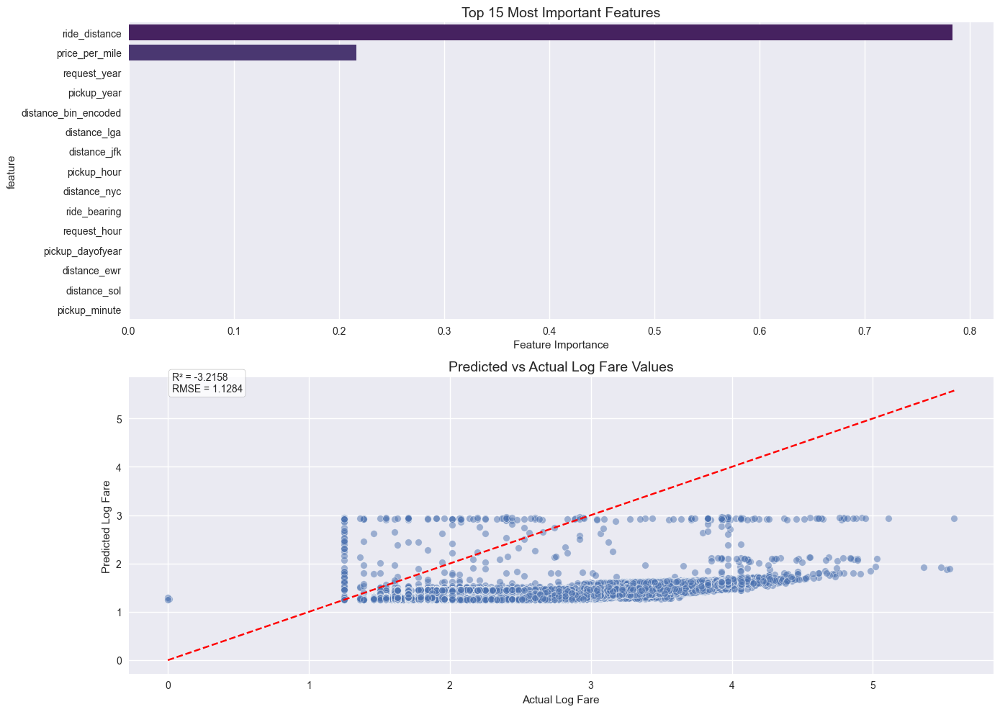

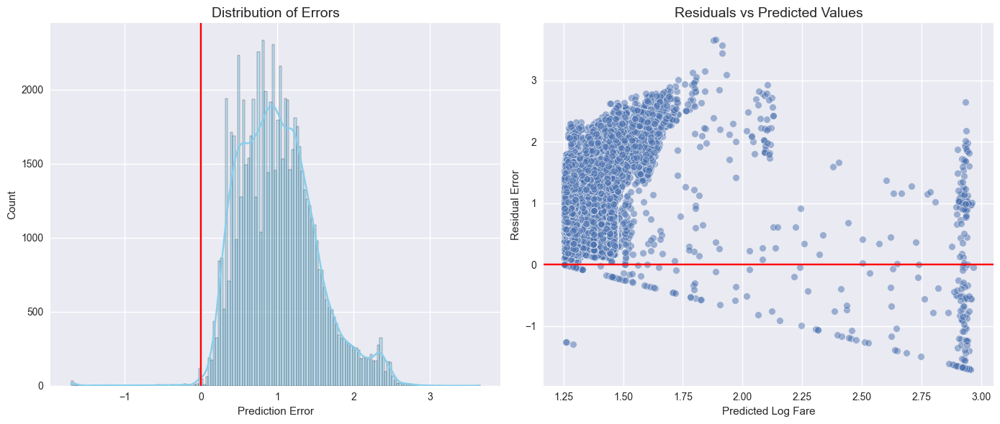

In [102]:
# Feature importance analysis
feature_importance = pd.DataFrame({
    'feature': X_train.columns,
    'importance': rf_model.feature_importances_
}).sort_values('importance', ascending=False)

# Visualize top features
plt.figure(figsize=(14, 10))
plt.subplot(2, 1, 1)
sns.barplot(x='importance', y='feature', data=feature_importance.head(15), palette='viridis')
plt.title('Top 15 Most Important Features', fontsize=14)
plt.xlabel('Feature Importance')
plt.tight_layout()

# Prediction vs Actual Plot
plt.subplot(2, 1, 2)

# Create a scatter plot of predicted vs actual
sns.scatterplot(x=y_test, y=y_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel('Actual Log Fare')
plt.ylabel('Predicted Log Fare')
plt.title('Predicted vs Actual Log Fare Values', fontsize=14)

# Add annotations for metrics
plt.annotate(f'R² = {r2:.4f}\nRMSE = {rmse:.4f}', 
             xy=(0.05, 0.95), xycoords='axes fraction',
             bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", alpha=0.8))

plt.tight_layout()
plt.show()

# Distribution of errors
errors = y_test - y_pred
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.histplot(errors, kde=True, color='skyblue')
plt.axvline(0, color='red', linestyle='-')
plt.title('Distribution of Errors', fontsize=14)
plt.xlabel('Prediction Error')

plt.subplot(1, 2, 2)
sns.scatterplot(x=y_pred, y=errors, alpha=0.5)
plt.axhline(0, color='red', linestyle='-')
plt.title('Residuals vs Predicted Values', fontsize=14)
plt.xlabel('Predicted Log Fare')
plt.ylabel('Residual Error')

plt.tight_layout()
plt.show()

In [103]:
# lightgbm
import lightgbm as lgb

# Initialize the model with tuned hyperparameters
lgb_model = lgb.LGBMRegressor(
    n_estimators=200,
    learning_rate=0.05,
    max_depth=5,
    num_leaves=50,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

In [104]:
print("Training LightGBM model...")
lgb_model.fit(X_train_stdscaled, y_train)

Training LightGBM model...
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011683 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2642
[LightGBM] [Info] Number of data points in the train set: 409067, number of used features: 38
[LightGBM] [Info] Start training from score 2.276752
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

LGBMRegressor(colsample_bytree=0.8, learning_rate=0.05, max_depth=5,
              n_estimators=200, num_leaves=50, random_state=42, subsample=0.8)

In [105]:
# Make predictions
y_pred_lightgbm = lgb_model.predict(X_test_stdscaled)

In [106]:
# Calculate metrics
mse_lightgbm = mean_squared_error(y_test, y_pred_lightgbm)
rmse_lightgbm = np.sqrt(mse_lightgbm)
mae_lightgbm = mean_absolute_error(y_test, y_pred_lightgbm)
r2_lightgbm = r2_score(y_test, y_pred_lightgbm)

# Calculate Huber loss manually with delta=1.35
y_diff_lightgbm = y_test - y_pred_lightgbm
abs_diff_lightgbm = np.abs(y_diff_lightgbm)
idx_lightgbm = abs_diff_lightgbm <= delta
huber_loss_value_lightgbm = np.mean(
    0.5 * y_diff_lightgbm[idx_lightgbm] ** 2 + delta * (abs_diff_lightgbm[~idx_lightgbm] - 0.5 * delta)
)

# Print metrics with better formatting
print(f"\nModel: LightGBM Regressor")
print("-" * 50)
print(f"R² Score:      {r2_lightgbm:.4f}")
print(f"MSE:           {mse_lightgbm:.4f}")
print(f"RMSE:          {rmse_lightgbm:.4f}")
print(f"MAE:           {mae_lightgbm:.4f}")
print(f"Huber Loss:    {huber_loss_value_lightgbm:.4f}")


Model: LightGBM Regressor
--------------------------------------------------
R² Score:      -2.3021
MSE:           0.9974
RMSE:          0.9987
MAE:           0.9201
Huber Loss:    nan


In [107]:
# Calculate and print what percentage of predictions are within 10% of actual values
actual_fares_lightgbm = np.expm1(y_test)
predicted_fares_lightgbm = np.expm1(y_pred_lightgbm)
percentage_error_lightgbm = np.abs((actual_fares_lightgbm - predicted_fares_lightgbm) / actual_fares_lightgbm) * 100
within_10_percent_lightgbm = np.mean(percentage_error_lightgbm <= 10) * 100
within_20_percent_lightgbm = np.mean(percentage_error_lightgbm <= 20) * 100

print("\nPrediction Accuracy:")
print(f"Predictions within 10% of actual fare: {within_10_percent_lightgbm:.2f}%")
print(f"Predictions within 20% of actual fare: {within_20_percent_lightgbm:.2f}%")


Prediction Accuracy:
Predictions within 10% of actual fare: 0.30%
Predictions within 20% of actual fare: 0.78%


C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_24732\194310408.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='importance', y='feature', data=feature_importance.head(15), palette='viridis')


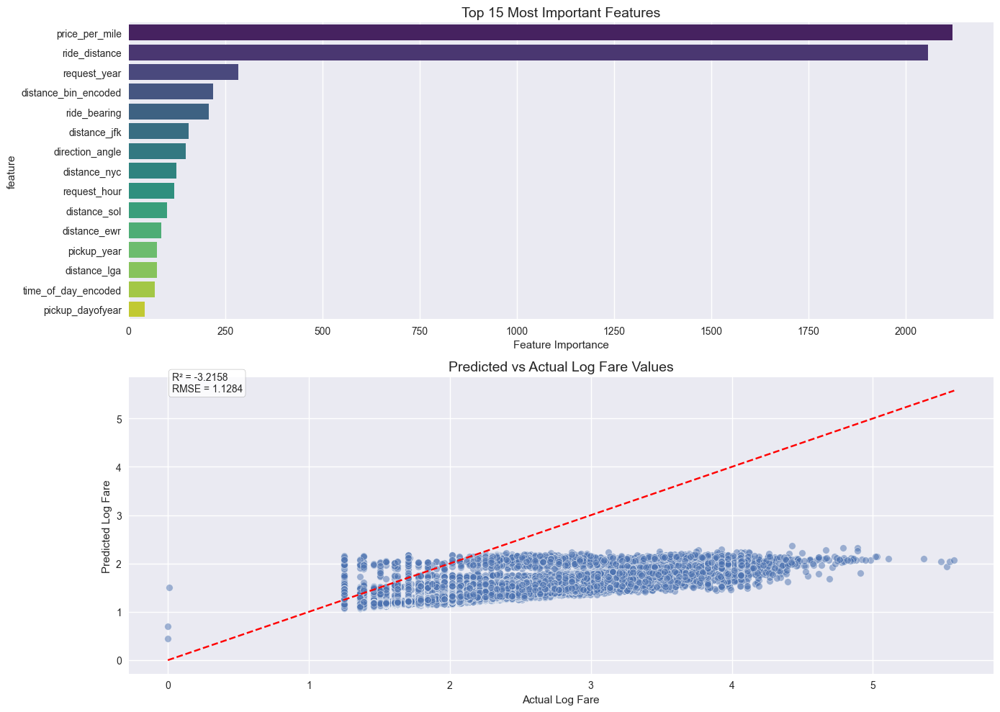

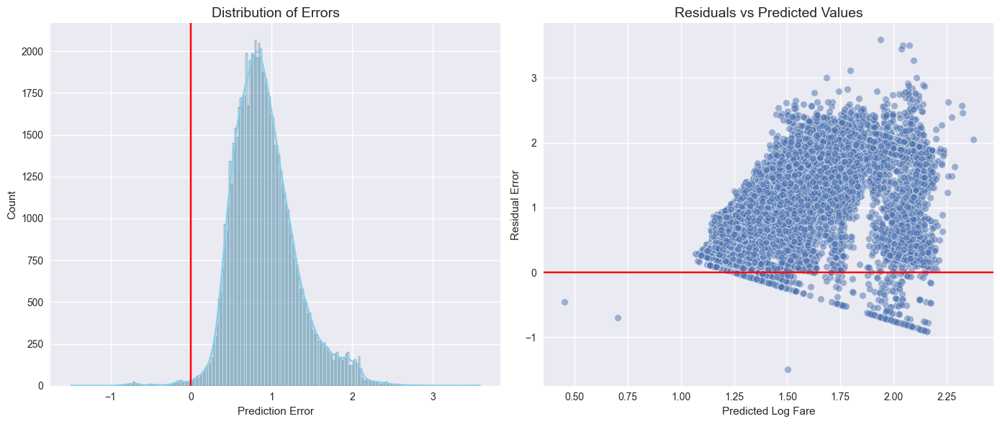

In [108]:
# Feature importance analysis
feature_importance = pd.DataFrame({
    'feature': X_train.columns,
    'importance': lgb_model.feature_importances_
}).sort_values('importance', ascending=False)

# Visualize top features
plt.figure(figsize=(14, 10))
plt.subplot(2, 1, 1)
sns.barplot(x='importance', y='feature', data=feature_importance.head(15), palette='viridis')
plt.title('Top 15 Most Important Features', fontsize=14)
plt.xlabel('Feature Importance')
plt.tight_layout()

# Prediction vs Actual Plot
plt.subplot(2, 1, 2)

# Create a scatter plot of predicted vs actual
sns.scatterplot(x=y_test, y=y_pred_lightgbm, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel('Actual Log Fare')
plt.ylabel('Predicted Log Fare')
plt.title('Predicted vs Actual Log Fare Values', fontsize=14)

# Add annotations for metrics
plt.annotate(f'R² = {r2:.4f}\nRMSE = {rmse:.4f}', 
             xy=(0.05, 0.95), xycoords='axes fraction',
             bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", alpha=0.8))

plt.tight_layout()
plt.show()

# Distribution of errors
errors = y_test - y_pred_lightgbm
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.histplot(errors, kde=True, color='skyblue')
plt.axvline(0, color='red', linestyle='-')
plt.title('Distribution of Errors', fontsize=14)
plt.xlabel('Prediction Error')

plt.subplot(1, 2, 2)
sns.scatterplot(x=y_pred_lightgbm, y=errors, alpha=0.5)
plt.axhline(0, color='red', linestyle='-')
plt.title('Residuals vs Predicted Values', fontsize=14)
plt.xlabel('Predicted Log Fare')
plt.ylabel('Residual Error')

plt.tight_layout()
plt.show()

In [109]:
# Xgboost
import xgboost as xgb

# Initialize the model with tuned hyperparameters
xgb_model = xgb.XGBRegressor(
    n_estimators=200,
    learning_rate=0.05,
    max_depth=5,
    subsample=0.8,
    colsample_bytree=0.8,
    reg_alpha=0.1,
    reg_lambda=0.1,
    objective='reg:squarederror',
    random_state=42
)

In [110]:
# Train the model
print("Training XGBoost model...")
xgb_model.fit(X_train_stdscaled, y_train)

Training XGBoost model...


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.05, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=200, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [111]:
# Make predictions
y_pred_xgb = xgb_model.predict(X_test_stdscaled)

In [112]:
# calculate metrics
mse_xgb = mean_squared_error(y_test, y_pred_xgb)
rmse_xgb = np.sqrt(mse_xgb)
mae_xgb = mean_absolute_error(y_test, y_pred_xgb)
r2_xgb = r2_score(y_test, y_pred_xgb)

# Calculate Huber loss manually with delta=1.35
y_diff_xgb = y_test - y_pred_xgb
abs_diff_xgb = np.abs(y_diff_xgb)
idx_xgb = abs_diff_xgb <= delta
huber_loss_value_xgb = np.mean(
    0.5 * y_diff_xgb[idx_xgb] ** 2 + delta * (abs_diff_xgb[~idx_xgb] - 0.5 * delta)
)

# Print metrics with better formatting
print(f"\nModel: XGBoost Regressor")
print("-" * 50)
print(f"R² Score:      {r2_xgb:.4f}")
print(f"MSE:           {mse_xgb:.4f}")
print(f"RMSE:          {rmse_xgb:.4f}")
print(f"MAE:           {mae_xgb:.4f}")
print(f"Huber Loss:    {huber_loss_value_xgb:.4f}")


Model: XGBoost Regressor
--------------------------------------------------
R² Score:      -2.1811
MSE:           0.9608
RMSE:          0.9802
MAE:           0.8884
Huber Loss:    nan


In [113]:
# Calculate and print what percentage of predictions are within 10% of actual values
actual_fares_xgb = np.expm1(y_test)
predicted_fares_xgb = np.expm1(y_pred_xgb)
percentage_error_xgb = np.abs((actual_fares_xgb - predicted_fares_xgb) / actual_fares_xgb) * 100
within_10_percent_xgb = np.mean(percentage_error_xgb <= 10) * 100
within_20_percent_xgb = np.mean(percentage_error_xgb <= 20) * 100

print("\nPrediction Accuracy:")
print(f"Predictions within 10% of actual fare: {within_10_percent_xgb:.2f}%")
print(f"Predictions within 20% of actual fare: {within_20_percent_xgb:.2f}%")


Prediction Accuracy:
Predictions within 10% of actual fare: 0.36%
Predictions within 20% of actual fare: 0.92%


C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_24732\801662969.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='importance', y='feature', data=feature_importance.head(15), palette='viridis')


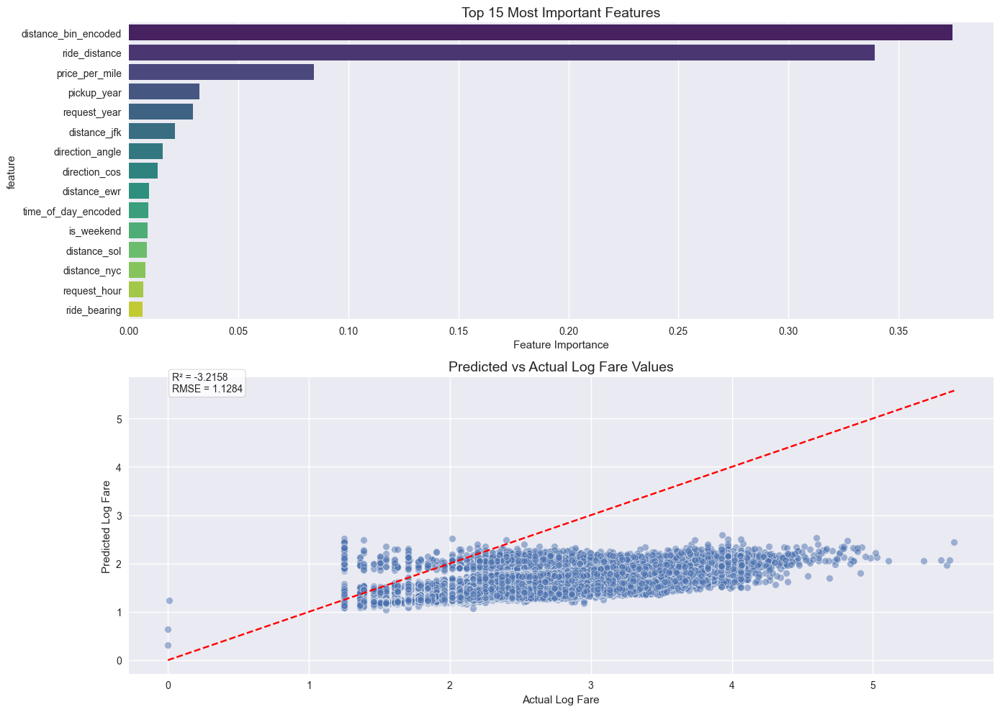

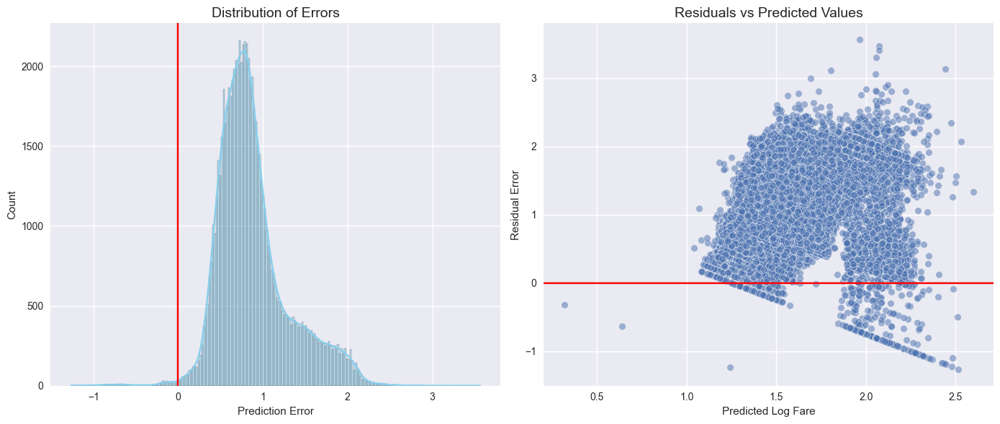

In [114]:
# Feature importance analysis
feature_importance = pd.DataFrame({
    'feature': X_train.columns,
    'importance': xgb_model.feature_importances_
}).sort_values('importance', ascending=False)

# Visualize top features
plt.figure(figsize=(14, 10))
plt.subplot(2, 1, 1)
sns.barplot(x='importance', y='feature', data=feature_importance.head(15), palette='viridis')
plt.title('Top 15 Most Important Features', fontsize=14)
plt.xlabel('Feature Importance')
plt.tight_layout()

# Prediction vs Actual Plot
plt.subplot(2, 1, 2)

# Create a scatter plot of predicted vs actual
sns.scatterplot(x=y_test, y=y_pred_xgb, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel('Actual Log Fare')
plt.ylabel('Predicted Log Fare')
plt.title('Predicted vs Actual Log Fare Values', fontsize=14)

# Add annotations for metrics
plt.annotate(f'R² = {r2:.4f}\nRMSE = {rmse:.4f}', 
             xy=(0.05, 0.95), xycoords='axes fraction',
             bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", alpha=0.8))

plt.tight_layout()
plt.show()

# Distribution of errors
errors = y_test - y_pred_xgb
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.histplot(errors, kde=True, color='skyblue')
plt.axvline(0, color='red', linestyle='-')
plt.title('Distribution of Errors', fontsize=14)
plt.xlabel('Prediction Error')

plt.subplot(1, 2, 2)
sns.scatterplot(x=y_pred_xgb, y=errors, alpha=0.5)
plt.axhline(0, color='red', linestyle='-')
plt.title('Residuals vs Predicted Values', fontsize=14)
plt.xlabel('Predicted Log Fare')
plt.ylabel('Residual Error')

plt.tight_layout()
plt.show()

In [115]:
# Ridge Regression
from sklearn.linear_model import Ridge

# Initialize the model with tuned hyperparameters
ridge_model = Ridge(alpha=10, random_state=42)

In [116]:
X_train_stdscaled.shape

(409067, 38)

In [117]:
# Train the model
print("Training Ridge Regression model...")
ridge_model.fit(X_train_stdscaled, y_train)

Training Ridge Regression model...


Ridge(alpha=10, random_state=42)

In [118]:
# Make predictions
y_pred_ridge = ridge_model.predict(X_test_stdscaled)

In [119]:
# Calculate metrics
mse_ridge = mean_squared_error(y_test, y_pred_ridge)
rmse_ridge = np.sqrt(mse_ridge)
mae_ridge = mean_absolute_error(y_test, y_pred_ridge)
r2_ridge = r2_score(y_test, y_pred_ridge)

# Calculate Huber loss manually with delta=1.35
y_diff_ridge = y_test - y_pred_ridge
abs_diff_ridge = np.abs(y_diff_ridge)
idx_ridge = abs_diff_ridge <= delta

huber_loss_value_ridge = np.mean(
    0.5 * y_diff_ridge[idx_ridge] ** 2 + delta * (abs_diff_ridge[~idx_ridge] - 0.5 * delta)
)

# Print metrics with better formatting
print(f"\nModel: Ridge Regression")
print("-" * 50)
print(f"R² Score:      {r2_ridge:.4f}")
print(f"MSE:           {mse_ridge:.4f}")
print(f"RMSE:          {rmse_ridge:.4f}")
print(f"MAE:           {mae_ridge:.4f}")
print(f"Huber Loss:    {huber_loss_value_ridge:.4f}")


Model: Ridge Regression
--------------------------------------------------
R² Score:      -36061.5966
MSE:           10892.6724
RMSE:          104.3680
MAE:           14.6738
Huber Loss:    nan


In [120]:
# Calculate and print what percentage of predictions are within 10% of actual values
actual_fares_ridge = np.expm1(y_test)
predicted_fares_ridge = np.expm1(y_pred_ridge)
percentage_error_ridge = np.abs((actual_fares_ridge - predicted_fares_ridge) / actual_fares_ridge) * 100
within_10_percent_ridge = np.mean(percentage_error_ridge <= 10) * 100
within_20_percent_ridge = np.mean(percentage_error_ridge <= 20) * 100

print("\nPrediction Accuracy:")
print(f"Predictions within 10% of actual fare: {within_10_percent_ridge:.2f}%")
print(f"Predictions within 20% of actual fare: {within_20_percent_ridge:.2f}%")


Prediction Accuracy:
Predictions within 10% of actual fare: 26.52%
Predictions within 20% of actual fare: 50.50%


C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_24732\3479176817.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='importance', y='feature', data=feature_importance.head(15), palette='viridis')


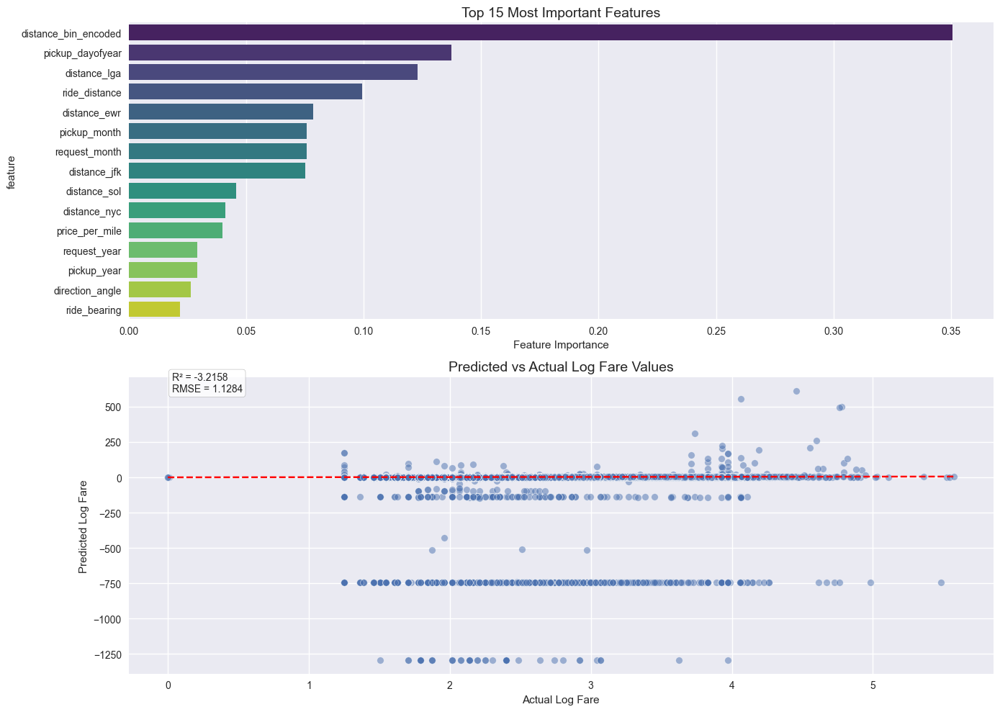

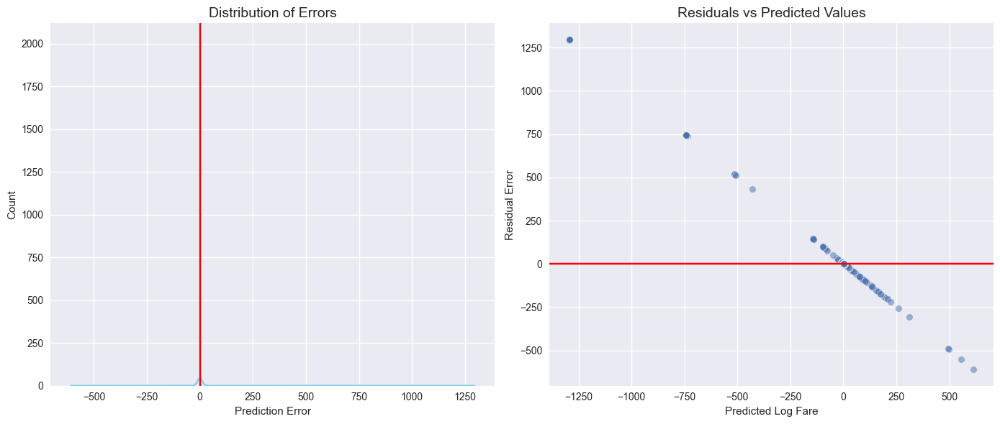

In [123]:
# Feature importance analysis
# Ridge regression uses coefficients instead of feature_importances_
feature_importance = pd.DataFrame({
    'feature': X_train.columns,
    'importance': np.abs(ridge_model.coef_)  # Use absolute values of coefficients
}).sort_values('importance', ascending=False)

# Visualize top features
plt.figure(figsize=(14, 10))
plt.subplot(2, 1, 1)
sns.barplot(x='importance', y='feature', data=feature_importance.head(15), palette='viridis')
plt.title('Top 15 Most Important Features', fontsize=14)
plt.xlabel('Feature Importance')
plt.tight_layout()

# Prediction vs Actual Plot
plt.subplot(2, 1, 2)

# Create a scatter plot of predicted vs actual
sns.scatterplot(x=y_test, y=y_pred_ridge, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel('Actual Log Fare')
plt.ylabel('Predicted Log Fare')
plt.title('Predicted vs Actual Log Fare Values', fontsize=14)

# Add annotations for metrics
plt.annotate(f'R² = {r2:.4f}\nRMSE = {rmse:.4f}', 
             xy=(0.05, 0.95), xycoords='axes fraction',
             bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", alpha=0.8))

plt.tight_layout()
plt.show()

# Distribution of errors
errors = y_test - y_pred_ridge
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.histplot(errors, kde=True, color='skyblue')
plt.axvline(0, color='red', linestyle='-')
plt.title('Distribution of Errors', fontsize=14)
plt.xlabel('Prediction Error')

plt.subplot(1, 2, 2)
sns.scatterplot(x=y_pred_ridge, y=errors, alpha=0.5)
plt.axhline(0, color='red', linestyle='-')
plt.title('Residuals vs Predicted Values', fontsize=14)
plt.xlabel('Predicted Log Fare')
plt.ylabel('Residual Error')

plt.tight_layout()
plt.show()

In [124]:
# lasso regression
from sklearn.linear_model import Lasso

# Initialize the model with tuned hyperparameters
lasso_model = Lasso(alpha=0.001, random_state=42)

In [125]:
# Train the model
print("Training Lasso Regression model...")
lasso_model.fit(X_train_stdscaled, y_train)

Training Lasso Regression model...


Lasso(alpha=0.001, random_state=42)

In [126]:
# Make predictions
y_pred_lasso = lasso_model.predict(X_test_stdscaled)

In [127]:
# Calculate metrics
mse_lasso = mean_squared_error(y_test, y_pred_lasso)
rmse_lasso = np.sqrt(mse_lasso)
mae_lasso = mean_absolute_error(y_test, y_pred_lasso)
r2_lasso = r2_score(y_test, y_pred_lasso)

# Calculate Huber loss manually with delta=1.35
y_diff_lasso = y_test - y_pred_lasso
abs_diff_lasso = np.abs(y_diff_lasso)
idx_lasso = abs_diff_lasso <= delta
huber_loss_value_lasso = np.mean(
    0.5 * y_diff_lasso[idx_lasso] ** 2 + delta * (abs_diff_lasso[~idx_lasso] - 0.5 * delta)
)

# Print metrics with better formatting
print(f"\nModel: Lasso Regression")
print("-" * 50)
print(f"R² Score:      {r2_lasso:.4f}")
print(f"MSE:           {mse_lasso:.4f}")
print(f"RMSE:          {rmse_lasso:.4f}")
print(f"MAE:           {mae_lasso:.4f}")
print(f"Huber Loss:    {huber_loss_value_lasso:.4f}")


Model: Lasso Regression
--------------------------------------------------
R² Score:      -31342.7218
MSE:           9467.3408
RMSE:          97.3003
MAE:           13.7199
Huber Loss:    nan


In [128]:
# Calculate and print what percentage of predictions are within 10% of actual values
actual_fares_lasso = np.expm1(y_test)
predicted_fares_lasso = np.expm1(y_pred_lasso)
percentage_error_lasso = np.abs((actual_fares_lasso - predicted_fares_lasso) / actual_fares_lasso) * 100
within_10_percent_lasso = np.mean(percentage_error_lasso <= 10) * 100
within_20_percent_lasso = np.mean(percentage_error_lasso <= 20) * 100

print("\nPrediction Accuracy:")
print(f"Predictions within 10% of actual fare: {within_10_percent_lasso:.2f}%")
print(f"Predictions within 20% of actual fare: {within_20_percent_lasso:.2f}%")


Prediction Accuracy:
Predictions within 10% of actual fare: 26.31%
Predictions within 20% of actual fare: 50.18%


C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_24732\1169914421.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='importance', y='feature', data=feature_importance.head(15), palette='viridis')


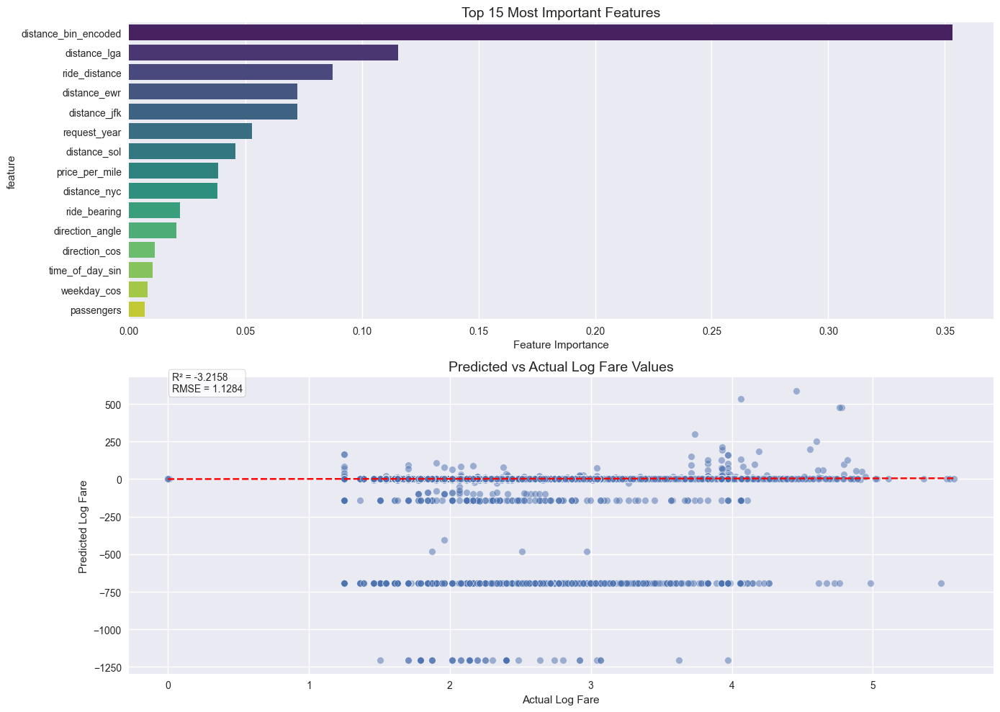

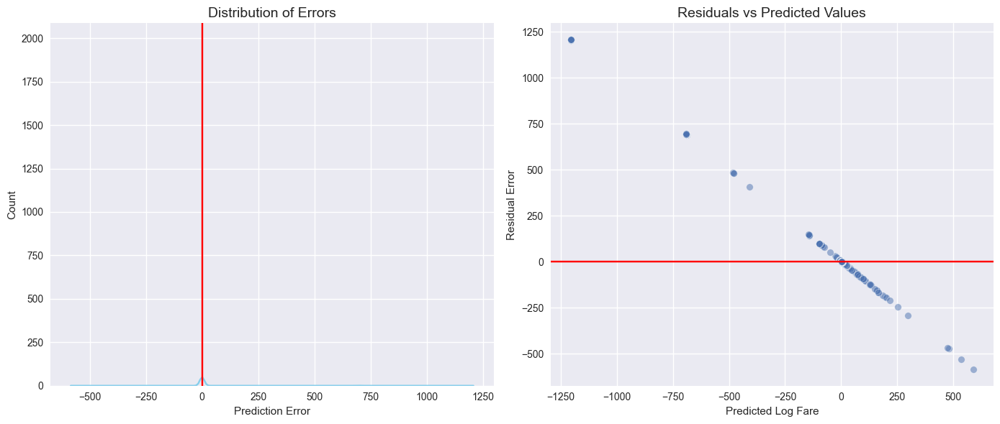

In [130]:
# Feature importance analysis
# Lasso regression uses coefficients instead of feature_importances_
feature_importance = pd.DataFrame({
    'feature': X_train.columns,
    'importance': np.abs(lasso_model.coef_)  # Use absolute values of coefficients
}).sort_values('importance', ascending=False)

# Visualize top features
plt.figure(figsize=(14, 10))
plt.subplot(2, 1, 1)
sns.barplot(x='importance', y='feature', data=feature_importance.head(15), palette='viridis')
plt.title('Top 15 Most Important Features', fontsize=14)
plt.xlabel('Feature Importance')
plt.tight_layout()

# Prediction vs Actual Plot
plt.subplot(2, 1, 2)

# Create a scatter plot of predicted vs actual
sns.scatterplot(x=y_test, y=y_pred_lasso, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel('Actual Log Fare')
plt.ylabel('Predicted Log Fare')
plt.title('Predicted vs Actual Log Fare Values', fontsize=14)

# Add annotations for metrics
plt.annotate(f'R² = {r2:.4f}\nRMSE = {rmse:.4f}', 
             xy=(0.05, 0.95), xycoords='axes fraction',
             bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", alpha=0.8))

plt.tight_layout()
plt.show()

# Distribution of errors
errors = y_test - y_pred_lasso
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.histplot(errors, kde=True, color='skyblue')
plt.axvline(0, color='red', linestyle='-')
plt.title('Distribution of Errors', fontsize=14)
plt.xlabel('Prediction Error')

plt.subplot(1, 2, 2)
sns.scatterplot(x=y_pred_lasso, y=errors, alpha=0.5)
plt.axhline(0, color='red', linestyle='-')
plt.title('Residuals vs Predicted Values', fontsize=14)
plt.xlabel('Predicted Log Fare')
plt.ylabel('Residual Error')

plt.tight_layout()
plt.show()

In [131]:
# ElasticNet
from sklearn.linear_model import ElasticNet

# Initialize the model with tuned hyperparameters
elasticnet_model = ElasticNet(alpha=0.001, l1_ratio=0.5, random_state=42)

In [132]:
# Train the model
print("Training ElasticNet model...")
elasticnet_model.fit(X_train_stdscaled, y_train)

Training ElasticNet model...


ElasticNet(alpha=0.001, random_state=42)

In [133]:
# Make predictions
y_pred_elasticnet = elasticnet_model.predict(X_test_stdscaled)

In [134]:
# Calculate metrics
mse_elasticnet = mean_squared_error(y_test, y_pred_elasticnet)
rmse_elasticnet = np.sqrt(mse_elasticnet)
mae_elasticnet = mean_absolute_error(y_test, y_pred_elasticnet)
r2_elasticnet = r2_score(y_test, y_pred_elasticnet)

# Calculate Huber loss manually with delta=1.35
y_diff_elasticnet = y_test - y_pred_elasticnet
abs_diff_elasticnet = np.abs(y_diff_elasticnet)
idx_elasticnet = abs_diff_elasticnet <= delta
huber_loss_value_elasticnet = np.mean(
    0.5 * y_diff_elasticnet[idx_elasticnet] ** 2 + delta * (abs_diff_elasticnet[~idx_elasticnet] - 0.5 * delta)
)

# Print metrics with better formatting
print(f"\nModel: ElasticNet Regression")
print("-" * 50)
print(f"R² Score:      {r2_elasticnet:.4f}")
print(f"MSE:           {mse_elasticnet:.4f}")
print(f"RMSE:          {rmse_elasticnet:.4f}")
print(f"MAE:           {mae_elasticnet:.4f}")
print(f"Huber Loss:    {huber_loss_value_elasticnet:.4f}")


Model: ElasticNet Regression
--------------------------------------------------
R² Score:      -33605.5215
MSE:           10150.8173
RMSE:          100.7513
MAE:           14.1841
Huber Loss:    nan


In [135]:
# Calculate and print what percentage of predictions are within 10% of actual values
actual_fares_elasticnet = np.expm1(y_test)
predicted_fares_elasticnet = np.expm1(y_pred_elasticnet)
percentage_error_elasticnet = np.abs((actual_fares_elasticnet - predicted_fares_elasticnet) / actual_fares_elasticnet) * 100
within_10_percent_elasticnet = np.mean(percentage_error_elasticnet <= 10) * 100
within_20_percent_elasticnet = np.mean(percentage_error_elasticnet <= 20) * 100

print("\nPrediction Accuracy:")
print(f"Predictions within 10% of actual fare: {within_10_percent_elasticnet:.2f}%")
print(f"Predictions within 20% of actual fare: {within_20_percent_elasticnet:.2f}%")


Prediction Accuracy:
Predictions within 10% of actual fare: 26.40%
Predictions within 20% of actual fare: 50.34%
